# PART 1

In [2]:
# All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

# 1(a)

In [3]:
########################################
#Generate meaningful data
########################################

# Generate 25 heights in inches
heights = np.linspace(52.5, 77.5, 25)
X = np.column_stack((np.ones(len(heights)), heights))  # shape (25, 2)

w_vec = np.array([-100.42, 3.86])

# Define the weight function
def wt(X,w_vec):
    return X @ w_vec  # h in inches, w in pounds

# Calculate weights
weights = wt(X,w_vec)

# Noise parameters
mean = 0
variance = 20
std_dev = np.sqrt(variance)

# Generate Gaussian noise
np.random.seed(0)
noise = np.random.normal(mean, std_dev, size=heights.shape)

# Add noise to original data
noisy_weights = weights + noise

Using steadily increasing heights (instead of random ones) helps keep things simple and clear.
This way, we can easily see how weight changes with height and better understand how the model performs.
It also makes the error surface plot smoother and easier to interpret.


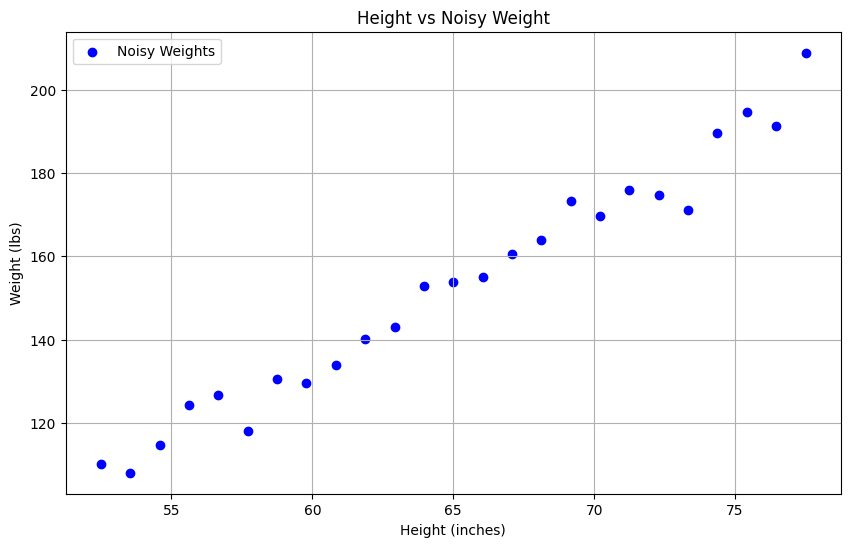

In [4]:
########################################
#Plot scatter plot of data
########################################

plt.figure(figsize=(10, 6))
plt.scatter(heights, noisy_weights, color='blue', label='Noisy Weights')
plt.xlabel('Height (inches)')
plt.ylabel('Weight (lbs)')
plt.title('Height vs Noisy Weight')
plt.legend()
plt.grid(True)
plt.show()

### Height vs Noisy Weight Scatter Plot

 Due to the added noise, the points do not lie exactly on a straight line, they are scattered around the expected linear trend.

# 1(b)

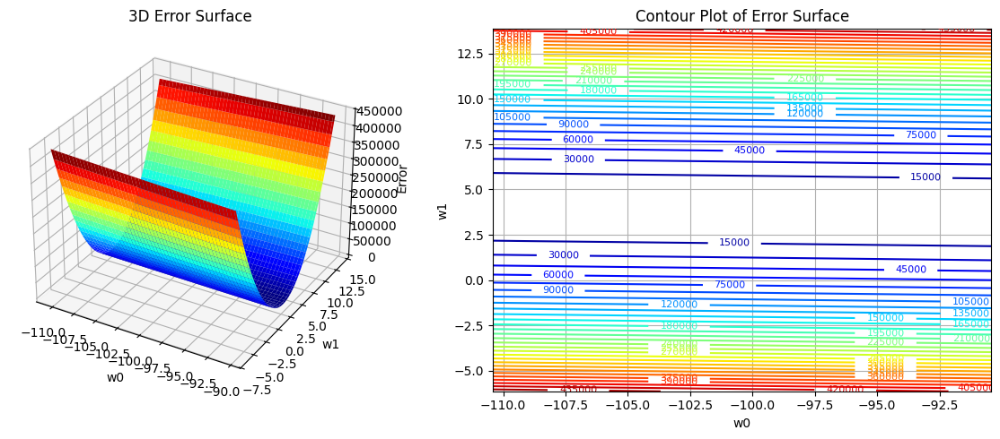

In [5]:
########################################
#Weight estimation through error surface, i.e., empirically locate the minima of error surface
########################################

# Known weights
w0_center = -100.42
w1_center = 3.86

# Define a range around the known weights
w0_range = np.linspace(w0_center - 10, w0_center + 10, 100) 
w1_range = np.linspace(w1_center - 10, w1_center + 10, 100)

#Compute the error
def Error(w,t,x): #inputs : 1)weight 2)data i.e (t = target,x = input)
    y_pred = x @ w
    error = np.mean((t - y_pred)**2)
    return error

errors = np.zeros((len(w0_range), len(w1_range)))
for i, w0 in enumerate(w0_range):
    for j, w1 in enumerate(w1_range):
        w = np.array([w0, w1])
        errors[i, j] = Error(w, noisy_weights, X)

# Plotting the 3D error surface
W0, W1 = np.meshgrid(w0_range, w1_range)
fig = plt.figure(figsize=(12, 5))

# --- 3D Error Surface ---
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(W0, W1, errors.T, cmap='jet')
ax1.set_title('3D Error Surface')
ax1.set_xlabel('w0')
ax1.set_ylabel('w1')
ax1.set_zlabel('Error')

# --- Contour Plot ---
ax2 = fig.add_subplot(1, 2, 2)
contour = ax2.contour(W0, W1, errors.T, levels=30, cmap='jet')
ax2.clabel(contour, inline=True, fontsize=8)
ax2.set_title('Contour Plot of Error Surface')
ax2.set_xlabel('w0')
ax2.set_ylabel('w1')
ax2.grid(True)

plt.tight_layout()
plt.show()


### 3D Error Surface
- This 3D plot shows how the error changes as we try out different values for the linear regression weights w0 (intercept) and w1 (slope).
- It forms a bowl-like shape, which is exactly what we expect — this tells us that there's one clear minimum where the error is the lowest.
- The colors help us see the difference in error: red means high error, and blue means low error. So the deepest part of the bowl is where the model fits best.
- This plot makes it easy to understand why gradient descent works so well here — we can "slide down" to the minimum.

### Contour plot
- This is the same error surface, but viewed from above.
- Each line (or contour) connects points with the same error value.

In [6]:
########################################
#Locate the minima of the error surface
########################################

# Find the indices of the minimum error
min_index = np.unravel_index(np.argmin(errors), errors.shape)

# Get corresponding w0 and w1 values
min_w0 = w0_range[min_index[0]]
min_w1 = w1_range[min_index[1]]

print(f"Minimum error found at:")
print(f"w0 (bias) = {min_w0}")
print(f"w1 (slope) = {min_w1}")

error_weights = np.array([min_w0,min_w1])
error_pred = X @ error_weights

Minimum error found at:
w0 (bias) = -91.6321212121212
w1 (slope) = 3.758989898989899


# 1(c)

In [7]:
########################################
#Least squares approach to estimate the weights
########################################

def LinearRegression(X, t):  #inputs : 1)input data i.e (x). 2)target i.e (t)
    w_opt = np.linalg.inv(X.T @ X) @ X.T @ t
    return w_opt

# Estimate weights using normal equation
regression_weights = LinearRegression(X, noisy_weights)
regression_pred = X @ regression_weights

print("\nEstimated weights using least squares:")
print(f"w0 (bias) = {regression_weights[0]}")
print(f"w1 (slope) = {regression_weights[1]}")


Estimated weights using least squares:
w0 (bias) = -86.46847304843939
w1 (slope) = 3.6780540791086245



We need to fit a linear model y = Xw that best predicts the target values t using the input features X.
We aim to minimize the sum of squared errors between the predicted and actual values: \|Xw - t\|^2

To find the optimal weights w, we:
- Take the derivative of the loss with respect to w
- Set the derivative to zero (i.e., minimize the loss)
- Solving for w, we get the closed-form solution: w = (X^T X)^{-1} X^T t

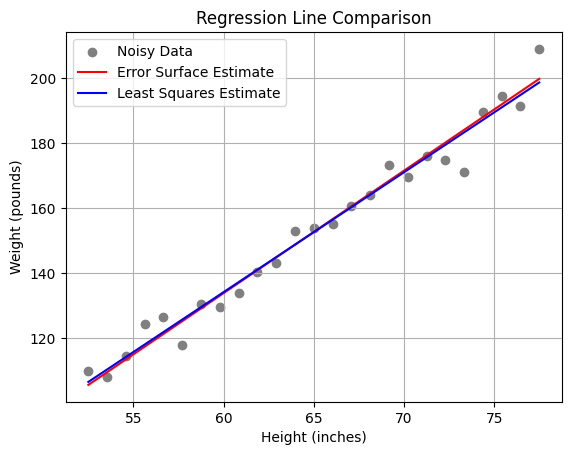

In [8]:
########################################
# Plot the estimated line on top of the above scatter plot
########################################

# Plot the noisy data
plt.scatter(heights, noisy_weights, label='Noisy Data', color='gray')

# Predicted lines
plt.plot(heights, error_pred, label='Error Surface Estimate', color='red')
plt.plot(heights, regression_pred, label='Least Squares Estimate', color='blue')

# Labels and legend
plt.xlabel("Height (inches)")
plt.ylabel("Weight (pounds)")
plt.title("Regression Line Comparison")
plt.legend()
plt.grid(True)
plt.show()

### Regression line comparison

- Both the red and blue lines fit the noisy data very closely, which shows that:
  - The error surface and least squares method both lead to very similar results.
  - This confirms that the error surface has a clear minimum and both methods are converging to it.
- There is only a slight visual difference between the two lines, likely due to:
  - The red method only looks at a limited number of weight combinations.
  - Floating-point math might introduce tiny inaccuracies, especially when working with very small or large numbers.


# 1(d)

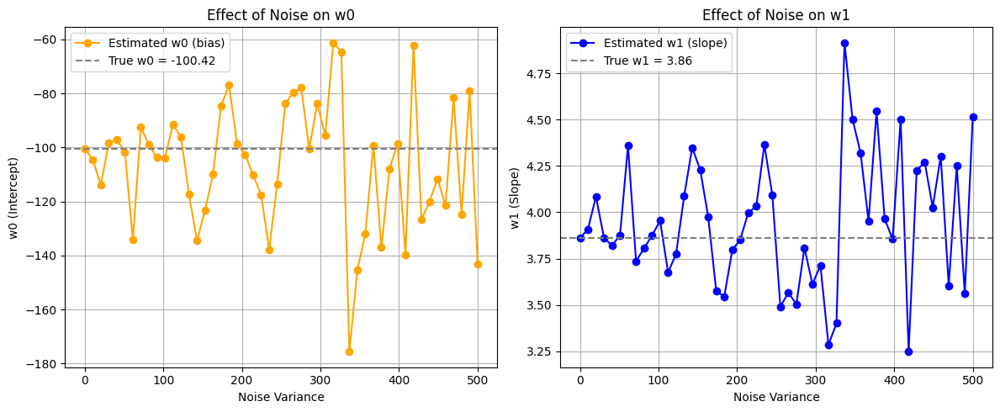

In [9]:
########################################
# Effect of variance
########################################

variances = variances = np.linspace(0, 500,50)  # 50 points from 0 to 500

w0_vals = []
w1_vals = []

for var in variances:
    noise_var = np.random.normal(0, np.sqrt(var), size=heights.shape)
    noisy_wt = weights + noise_var
    t_noisy = noisy_wt.reshape(-1, 1)
    w_est = LinearRegression(X,t_noisy)
    w0_vals.append(w_est[0])
    w1_vals.append(w_est[1])

# True values
true_w0 = -100.42
true_w1 = 3.86

# Plot w0
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(variances, w0_vals, 'o-', label='Estimated w0 (bias)', color='orange')
plt.axhline(true_w0, color='gray', linestyle='--', label=f'True w0 = {true_w0}')
plt.xlabel('Noise Variance')
plt.ylabel('w0 (Intercept)')
plt.title('Effect of Noise on w0')
plt.legend()
plt.grid(True)

# Plot w1
plt.subplot(1, 2, 2)
plt.plot(variances, w1_vals, 'o-', label='Estimated w1 (slope)', color='blue')
plt.axhline(true_w1, color='gray', linestyle='--', label=f'True w1 = {true_w1}')
plt.xlabel('Noise Variance')
plt.ylabel('w1 (Slope)')
plt.title('Effect of Noise on w1')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

### Effect of noise variance on w₀ and w₁
- Both the intercept and slope estimates get noisier and less stable as the noise in the data increases.
- Low-noise data leads to more reliable parameter estimation in linear regression.
- When Gaussian noise is added with mean 0, it doesn't push values in one fixed direction (e.g., always up or always down).
  Instead some values get pushed up, others pushed down, and this randomness affects the regression line.


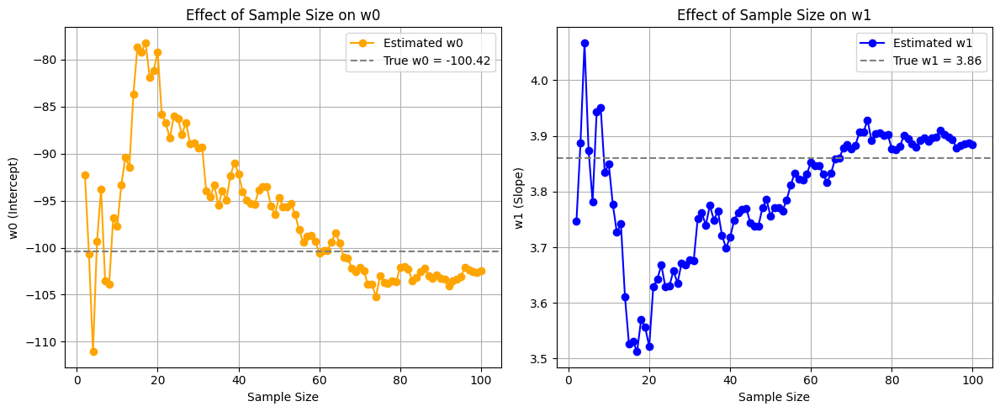

In [10]:
########################################
# Effect of sample size
########################################

sample_sizes = list(range(2, 101))  # From 1 to 100 inclusive
est_w0 = []
est_w1 = []
for N in sample_sizes:
    np.random.seed(42)  # Ensures reproducibility
    heights = np.linspace(52.5, 77.5, N)
    X = np.column_stack((np.ones(len(heights)), heights))
    true_weights = wt(X,w_vec)
    random_noise = np.random.normal(0, std_dev, size=heights.shape)
    noisy_weights = true_weights + random_noise

    # Perform linear regression
    t_noisy = noisy_weights.reshape(-1, 1)
    w_est = LinearRegression(X, t_noisy)
    est_w0.append(w_est[0])
    est_w1.append(w_est[1])

# Plotting the effect of sample size on w0 and w1
plt.figure(figsize=(12, 5))

# w0 plot
plt.subplot(1, 2, 1)
plt.plot(sample_sizes, est_w0, 'o-', label='Estimated w0', color='orange')
plt.axhline(w_vec[0], linestyle='--', color='gray', label='True w0 = -100.42')
plt.xlabel("Sample Size")
plt.ylabel("w0 (Intercept)")
plt.title("Effect of Sample Size on w0")
plt.grid(True)
plt.legend()

# w1 plot
plt.subplot(1, 2, 2)
plt.plot(sample_sizes, est_w1, 'o-', label='Estimated w1', color='blue')
plt.axhline(w_vec[1], linestyle='--', color='gray', label='True w1 = 3.86')
plt.xlabel("Sample Size")
plt.ylabel("w1 (Slope)")
plt.title("Effect of Sample Size on w1")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

### Overfitting vs Underfitting

- With very small sample sizes, the model may overfit the noise in the data:
  - It tries too hard to fit every point, even the random fluctuations.
  - This causes high variance in w₀ and w₁.

- With larger sample sizes, the model captures the true underlying trend better:
  - It becomes less sensitive to noise and more generalizable.
  - This reduces the risk of both overfitting and underfitting.

# PART 2:  Understanding model order and overfitting

# 2(a)

In [11]:
########################################
# data generating function
########################################

np.random.seed(42)


def generate_data_numpy(N, func, noise_std=np.sqrt(0.1)):
    x = np.sort(np.random.rand(N))
    e = np.random.normal(0, noise_std, N)
    t = func(x) + e
    return x.reshape(-1, 1), t.reshape(-1, 1)

In [12]:
########################################
# partitioning of data into test and train
########################################

def split_data_numpy(X_all, t_all, test_size_ratio, random_state=None):
    if random_state is not None:
        np.random.seed(random_state)
    N_total = X_all.shape[0]
    indices = np.arange(N_total)
    np.random.shuffle(indices)
    N_test = int(N_total * test_size_ratio)
    test_indices = indices[:N_test]
    train_indices = indices[N_test:]
    X_train, X_test = X_all[train_indices], X_all[test_indices]
    t_train, t_test = t_all[train_indices], t_all[test_indices]
    return X_train, X_test, t_train, t_test


def create_polynomial_features_numpy(X, degree):
    X_flat = X.flatten()
    Phi = np.power(X_flat[:, np.newaxis], np.arange(degree + 1))
    return Phi

In [13]:

def solve_least_squares_numpy(Phi, t):
    w, _, _, _ = np.linalg.lstsq(Phi, t.ravel(), rcond=None)
    return w.reshape(-1, 1)


def solve_ridge_numpy(Phi, t, lambda_val, regularize_bias):
    N_coeffs = Phi.shape[1]
    penalty_matrix = lambda_val * np.eye(N_coeffs)
    if not regularize_bias and N_coeffs > 0:
        penalty_matrix[0, 0] = 0
    LHS = Phi.T @ Phi + penalty_matrix
    RHS = Phi.T @ t.ravel()
    try:
        if lambda_val < 1e-9 and N_coeffs > Phi.shape[0]:
            w = np.linalg.lstsq(LHS, RHS, rcond=None)[0]
        else:
            w = np.linalg.solve(LHS, RHS)
    except np.linalg.LinAlgError:
        w = np.linalg.lstsq(LHS, RHS, rcond=None)[0]
    return w.reshape(-1, 1)


def predict_numpy(Phi, w):
    return Phi @ w


def rmse_numpy(t_true, t_pred):
    return np.sqrt(np.mean((t_true.ravel() - t_pred.ravel()) ** 2))


def original_func_np(x_np):
    return np.sin(2 * np.pi * x_np)


def altered_func_np(x_np):
    return 5 + np.sin(2 * np.pi * x_np)

### Ridge Regression Weight Computation

- This function computes the weights **`w`** for a **Ridge Regression** model, which is a regularized variant of the standard least squares regression.

- Ridge Regression adds a penalty term to the ordinary least squares loss function to prevent overfitting and control model complexity. Specifically, it minimizes the following objective:

$$
\text{Loss} = \|Xw - y\|^2 + \lambda \|w\|^2
$$


- **\( X \)**: Feature matrix (samples × features)  
- **\( y \)**: Target values  
- **\( w \)**: Model weights (including bias if applicable)  
- **λ**: Regularization strength (`lambda_val` in the code)

The added penalty term \( \lambda \|w\|^2 \) shrinks the weights, which helps reduce variance and improve generalization on unseen data.

- **`lambda_val`**:A scalar controlling the strength of the L2 regularization. A higher value imposes more penalty on large weights.

- **`regularize_bias`** *(boolean)*:Determines whether to penalize the bias term (**`w₀`**, i.e., the first element of `w`).  
  - If `False`, the bias term is **excluded** from the penalty.  
  - If `True`, all weights, including the bias, are regularized.


- This function outputs the optimal weights `w` for a Ridge Regression model.
- The `lambda_val` parameter helps balance the trade-off between **bias and variance**.
- The `regularize_bias` flag provides flexibility in whether to shrink the bias term or not.


# 2(b)

In [14]:
########################################
# Fitting M degree polynomial to the training data using least square approach
########################################


def run_polynomial_regression_experiment_numpy(
    X_train,
    t_train,
    X_test,
    t_test,
    max_M=9,
    model_type="least_squares",
    ridge_lambda=0.0,
    regularize_bias=False,
    plot_all_individual_M_fits=False,
    X_full_for_plot=None,
    func_for_plot=None,
    scenario_title_prefix="",
):
    train_rmses = []
    test_rmses = []
    Ms_list = list(range(max_M + 1))
    weights_dict = {}

    if plot_all_individual_M_fits and X_full_for_plot is None:
        print(
            "Warning: X_full_for_plot not provided for individual M plotting. Skipping these plots."
        )
        plot_all_individual_M_fits = False

    # Counter for subplot positioning
    plot_counter = 0

    for M_val in Ms_list:
        Phi_train = create_polynomial_features_numpy(X_train, M_val)
        Phi_test = create_polynomial_features_numpy(X_test, M_val)

        if model_type == "least_squares":
            w = solve_least_squares_numpy(Phi_train, t_train)
        elif model_type == "ridge":
            w = solve_ridge_numpy(Phi_train, t_train, ridge_lambda, regularize_bias)
        else:
            raise ValueError("Unknown model_type")

        weights_dict[M_val] = w.copy()

        t_train_pred = predict_numpy(Phi_train, w)
        t_test_pred = predict_numpy(Phi_test, w)

        train_rmses.append(rmse_numpy(t_train, t_train_pred))
        test_rmses.append(rmse_numpy(t_test, t_test_pred))

        if plot_all_individual_M_fits:
            # Create new figure every 2 plots
            if plot_counter % 2 == 0:
                fig, axes = plt.subplots(1, 2, figsize=(12, 4))

            # Select current subplot
            ax = axes[plot_counter % 2]

            ax.scatter(
                X_train,
                t_train,
                facecolors="none",
                edgecolors="blue",
                s=30,
                label="Training data",
            )
            ax.scatter(
                X_test,
                t_test,
                facecolors="none",
                edgecolors="red",
                s=30,
                label="Testing data",
            )

            x_plot_range_for_true_func = np.linspace(0, 1, 200).reshape(-1, 1)
            if func_for_plot is not None:
                ax.plot(
                    x_plot_range_for_true_func,
                    func_for_plot(x_plot_range_for_true_func.ravel()),
                    "g-",
                    linewidth=2,
                    label="True function",
                )

            Phi_plot = create_polynomial_features_numpy(X_full_for_plot, M_val)
            t_plot_pred_on_full = predict_numpy(Phi_plot, w)
            ax.plot(
                X_full_for_plot,
                t_plot_pred_on_full,
                "m--",
                linewidth=2,
                label=f"Model M={M_val}",
            )

            title_pred = f"{scenario_title_prefix}Fit for M={M_val}"
            if model_type == "ridge":
                title_pred += (
                    f" (Ridge, λ={ridge_lambda:.1e}, bias_reg={regularize_bias})"
                )
            else:
                title_pred += " (Least Squares)"
            ax.set_title(title_pred)
            ax.set_xlabel("x")
            ax.set_ylabel("t")
            ax.legend()

            all_t_values_plot = [t_train.ravel(), t_test.ravel()]
            if func_for_plot is not None:
                all_t_values_plot.append(
                    func_for_plot(x_plot_range_for_true_func.ravel())
                )
            if t_plot_pred_on_full is not None:
                all_t_values_plot.append(t_plot_pred_on_full.ravel())
            all_t_values_plot_flat = np.concatenate(all_t_values_plot)
            min_val_plot, max_val_plot = np.min(all_t_values_plot_flat), np.max(
                all_t_values_plot_flat
            )
            padding = (
                (max_val_plot - min_val_plot) * 0.1
                if (max_val_plot - min_val_plot) > 1e-6
                else 0.1
            )
            ax.set_ylim(min_val_plot - padding, max_val_plot + padding)

            plot_counter += 1

            # Show figure when we have 2 plots or at the end
            if plot_counter % 2 == 0 or M_val == Ms_list[-1]:
                # If last plot is odd, hide the second subplot
                if M_val == Ms_list[-1] and plot_counter % 2 == 1:
                    axes[1].set_visible(False)
                plt.tight_layout()
                plt.show()

    # Overall RMSE plot (keep as single plot since it's a summary)
    plt.figure(figsize=(8, 4))
    plt.plot(Ms_list, train_rmses, "bo-", label="Training RMSE")
    plt.plot(Ms_list, test_rmses, "ro-", label="Testing RMSE")
    plt.xlabel("Model Order M")
    plt.ylabel("RMSE")

    title_rmse = f"{scenario_title_prefix}RMSE vs. Model Order"
    if model_type == "ridge":
        title_rmse += f" (Ridge, λ={ridge_lambda:.1e}, bias_reg={regularize_bias})"
    else:
        title_rmse += " (Least Squares)"
    plt.title(title_rmse)
    plt.legend()
    plt.xticks(Ms_list)
    plt.grid(True)

    combined_rmses = np.array(train_rmses + test_rmses)
    valid_rmses = combined_rmses[np.isfinite(combined_rmses)]
    if len(valid_rmses) > 0:
        max_val_for_ylim = np.max(valid_rmses)
        if (
            len(test_rmses) > 1
            and np.isfinite(test_rmses[0])
            and np.median(np.abs(test_rmses[1:])) > 1e-9
            and test_rmses[0] > 5 * np.median(test_rmses[1:])
        ):
            other_rmses = np.concatenate((train_rmses, test_rmses[1:]))
            valid_other_rmses = other_rmses[np.isfinite(other_rmses)]
            if len(valid_other_rmses) > 0:
                max_val_for_ylim = np.max(valid_other_rmses)
            else:
                max_val_for_ylim = 1.5
        plt.ylim(0, max(1.5, max_val_for_ylim * 1.1))
    else:
        plt.ylim(0, 1.5)
    plt.show()
    return Ms_list, train_rmses, test_rmses, weights_dict

In [15]:
########################################
# Helper Function to Report Best M
########################################

def report_best_M(
    Ms_list, test_rmses_list, train_rmses_list, weights_dict, scenario_name=""
):
    print(f"\n--- Best Model for {scenario_name} ---")
    if not test_rmses_list or not np.any(np.isfinite(test_rmses_list)):
        print("No valid test RMSEs to analyze or all are non-finite.")
        return -1, float("nan")
    finite_test_rmses = np.array(test_rmses_list)
    finite_indices = np.isfinite(finite_test_rmses)
    if not np.any(finite_indices):
        print("All test RMSEs are non-finite. Cannot determine best M.")
        return -1, float("nan")
    min_test_rmse = np.min(finite_test_rmses[finite_indices])
    best_M_idx_candidates = np.where(np.isclose(test_rmses_list, min_test_rmse))[0]
    if len(best_M_idx_candidates) == 0:
        print("Error finding best M index.")
        return -1, float("nan")
    best_M_idx = best_M_idx_candidates[0]
    best_M_val = Ms_list[best_M_idx]
    best_M_train_rmse_val = train_rmses_list[best_M_idx]
    best_M_w0_val = float("nan")
    if (
        weights_dict
        and best_M_val in weights_dict
        and weights_dict[best_M_val].size > 0
    ):
        best_M_w0_val = weights_dict[best_M_val][0, 0]
    print(f"Best Model Order M: {best_M_val}")
    print(f"  - Minimum Test RMSE:  {min_test_rmse:.4f}")
    print(f"  - Train RMSE at M={best_M_val}: {best_M_train_rmse_val:.4f}")
    if np.isfinite(best_M_w0_val):
        print(f"  - Bias w0 at M={best_M_val}:   {best_M_w0_val:.4f}")
    print("--- End Best Model Report ---")
    return best_M_val, min_test_rmse

- This function finds the model order M that achieved the lowest test RMSE.

In [16]:
########################################
# Part (a): Generate 20 data points and partitioning
########################################

N_total_a = 20
np.random.seed(42)
X_all_a, t_all_a = generate_data_numpy(
    N_total_a, original_func_np, noise_std=np.sqrt(0.1)
)
X_train_a10, X_test_a10, t_train_a10, t_test_a10 = split_data_numpy(
    X_all_a, t_all_a, test_size_ratio=0.5, random_state=42
)

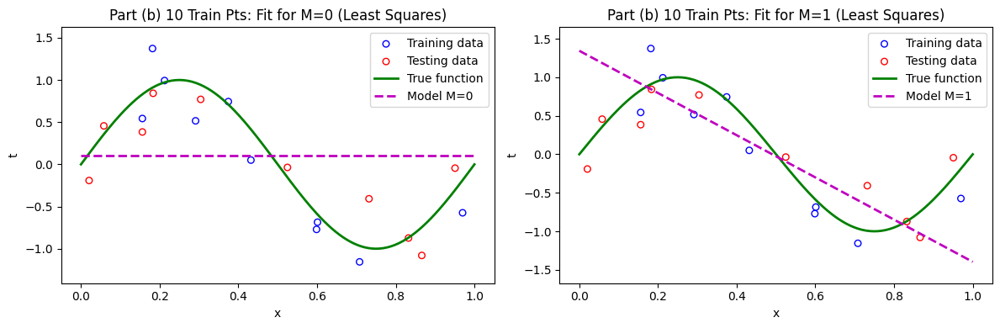

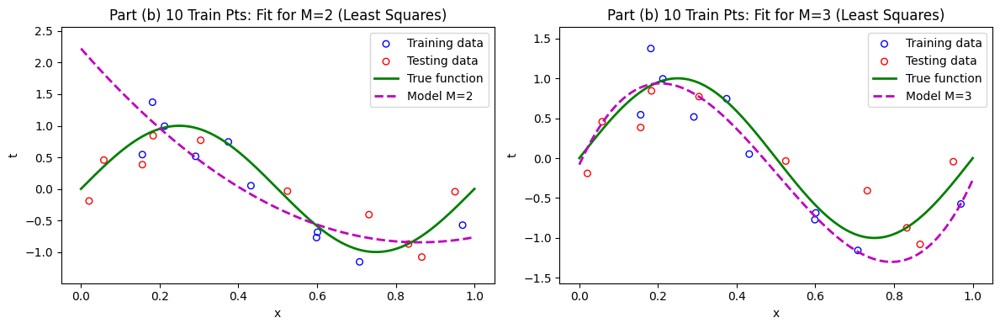

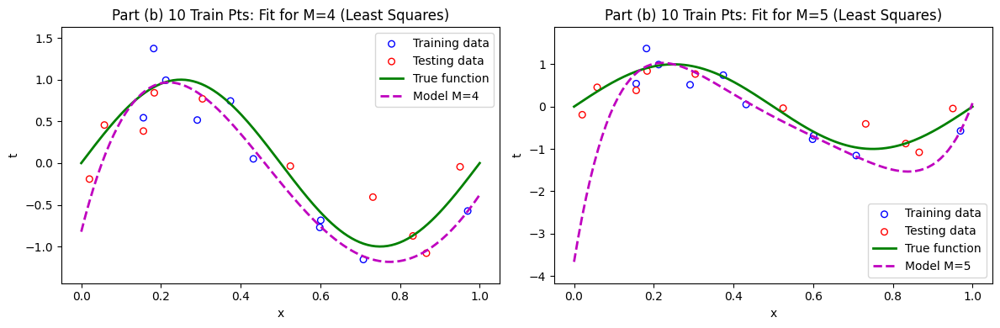

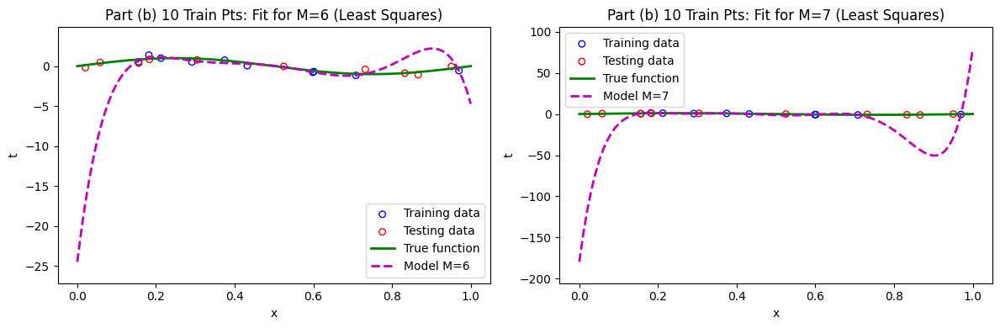

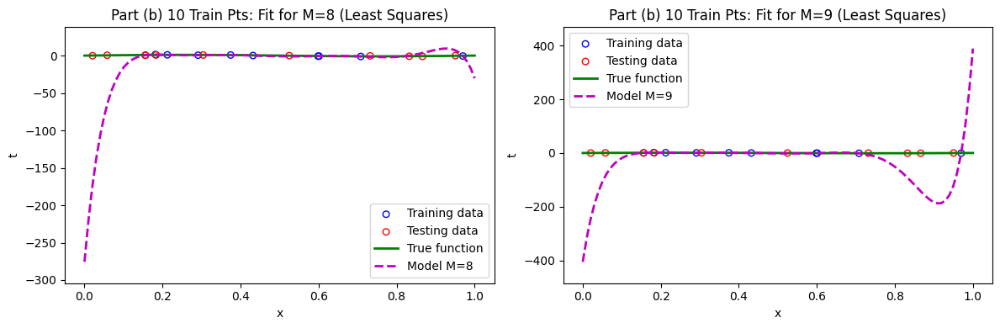

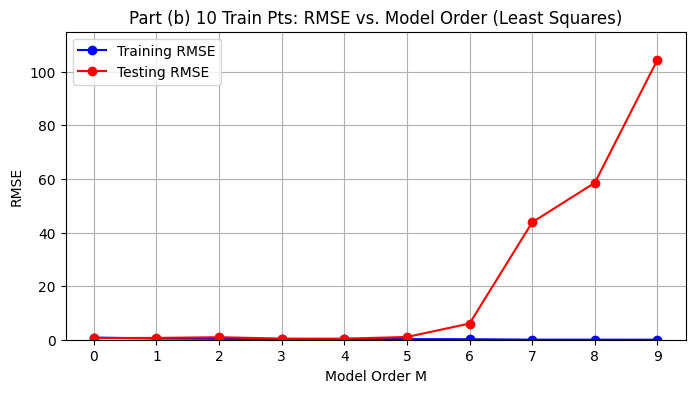


--- Best Model for Part (b) 10 Train Pts:  ---
Best Model Order M: 4
  - Minimum Test RMSE:  0.3999
  - Train RMSE at M=4: 0.2212
  - Bias w0 at M=4:   -0.8228
--- End Best Model Report ---


(4, np.float64(0.39985547938435906))

In [17]:
########################################
# (b): Fit M-th degree polynomial and evaluate
########################################


x_plot_range_b = np.linspace(0, 1, 100).reshape(-1, 1)
scenario_b_title = "Part (b) 10 Train Pts: "

Ms_b, train_rmses_b, test_rmses_b, weights_b = (
    run_polynomial_regression_experiment_numpy(
        X_train_a10,
        t_train_a10,
        X_test_a10,
        t_test_a10,
        max_M=9,
        model_type="least_squares",
        plot_all_individual_M_fits=True,
        X_full_for_plot=x_plot_range_b,
        func_for_plot=original_func_np,
        scenario_title_prefix=scenario_b_title,
    )
)
report_best_M(Ms_b, test_rmses_b, train_rmses_b, weights_b, scenario_b_title)

### OverFitting vs UnderFitting Observations

- ```UnderFitting```: This happens when the model is not complex enough to capture the underlying pattern in the data.
    - This will be evident for low values of M, such as M=0, M=1, or M=2. A polynomial of degree 0 is a horizontal line, and a degree 1 is a straight diagonal line.
    - The fitted magenta line (---) will be a straight line that tries its best to cut through the curvy sine wave data. It will clearly fail to capture the wave's shape.
    - For low M, both the Training RMSE (blue line) and the Test RMSE (red line) will be high. The model performs poorly even on the data it was trained on because it simply lacks the capacity to represent the true function.

- ```OverFitting```: It happens when the model is so complex that it starts fitting the random noise in the training data, rather than just the underlying pattern.
    - For high values of M, like M=9, the model has 10 coefficients (w0 to w9) to fit 10 data points. It has enough flexibility to wiggle wildly to pass through every single training point perfectly.
    - The Training RMSE (blue line) will be extremely low (approaching zero).
    - The Test RMSE (red line) will be extremely high.
    - There will be a large gap between the training and test error as shown with red and blue line in the plot.


# 2(c)

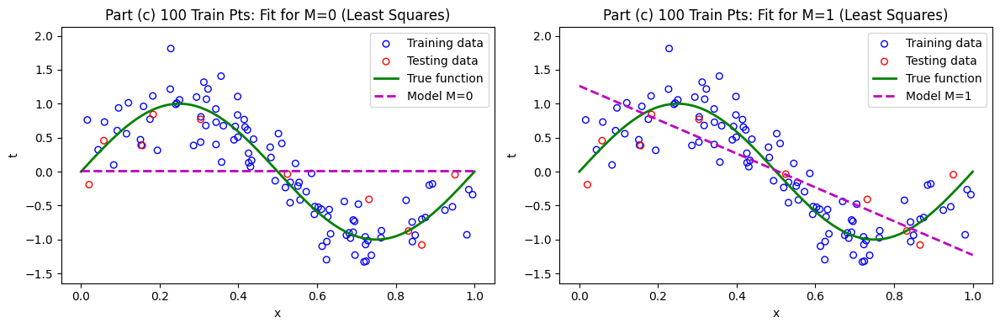

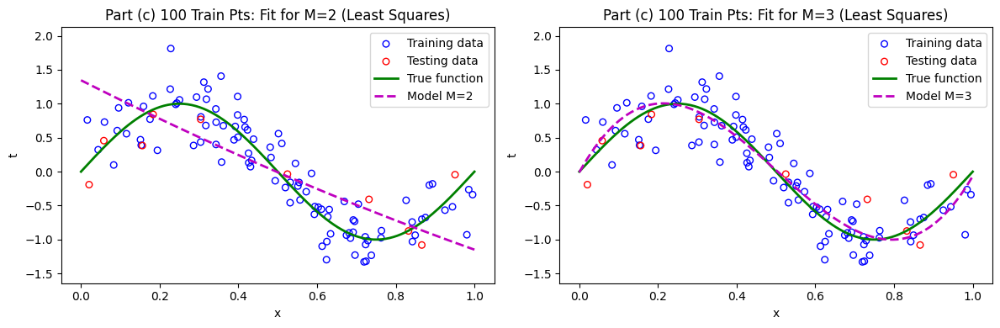

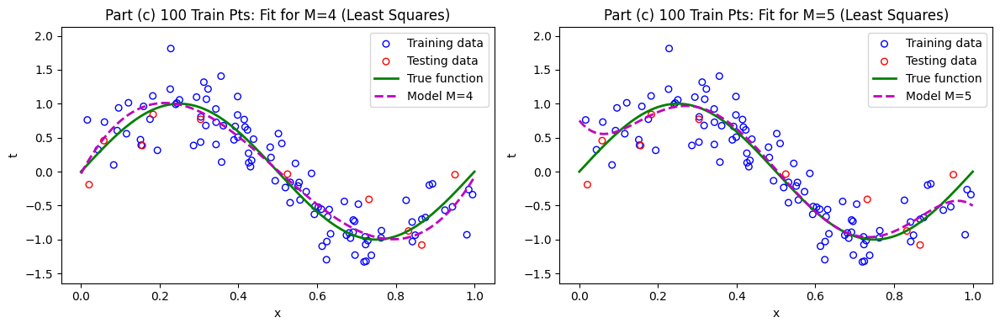

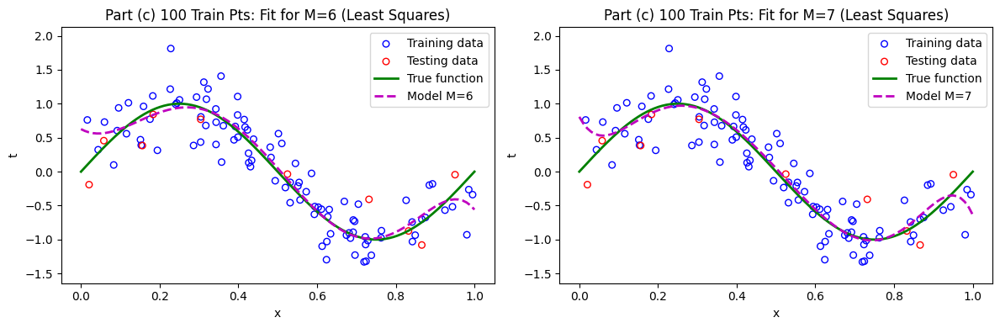

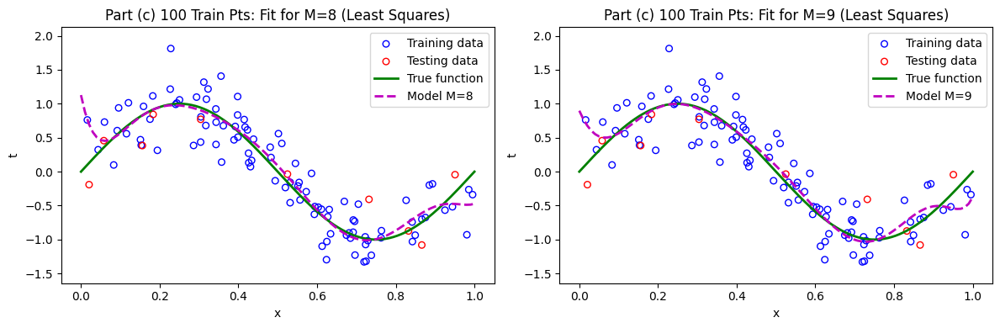

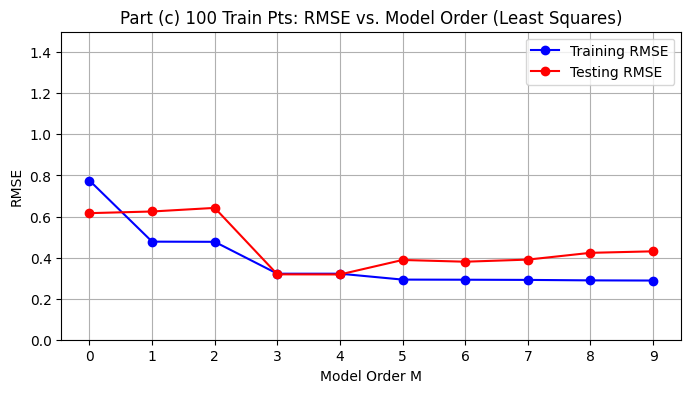


--- Best Model for Part (c) 100 Train Pts:  ---
Best Model Order M: 4
  - Minimum Test RMSE:  0.3179
  - Train RMSE at M=4: 0.3215
  - Bias w0 at M=4:   -0.0296
--- End Best Model Report ---


(4, np.float64(0.31785972612304353))

In [18]:
########################################
# Part (c): Expand training dataset to 100 points, repeat (b)
########################################

N_train_c100 = 100
np.random.seed(123)
X_train_c100, t_train_c100 = generate_data_numpy(
    N_train_c100, original_func_np, noise_std=np.sqrt(0.1)
)
x_plot_range_c = np.linspace(0, 1, 100).reshape(-1, 1)
scenario_c_title = "Part (c) 100 Train Pts: "

Ms_c, train_rmses_c, test_rmses_c, weights_c = (
    run_polynomial_regression_experiment_numpy(
        X_train_c100,
        t_train_c100,
        X_test_a10,
        t_test_a10,
        max_M=9,
        model_type="least_squares",
        plot_all_individual_M_fits=True,
        X_full_for_plot=x_plot_range_c,
        func_for_plot=original_func_np,
        scenario_title_prefix=scenario_c_title,
    )
)
report_best_M(Ms_c, test_rmses_c, train_rmses_c, weights_c, scenario_c_title)

# 2(d)


--- Part (d): L2 Regularization (Ridge Regression) ---

 Regularization with 10 training points 

Analyzing for Part (d) 10 Train Pts λ=0e+00: :


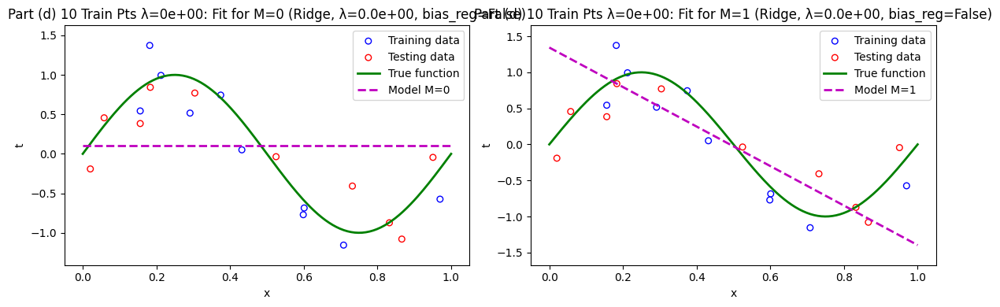

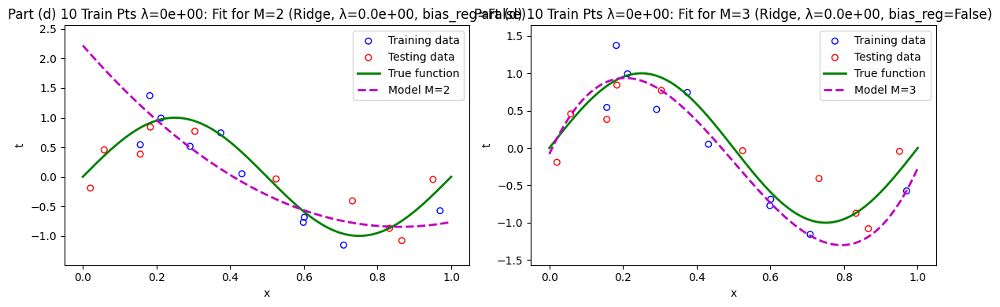

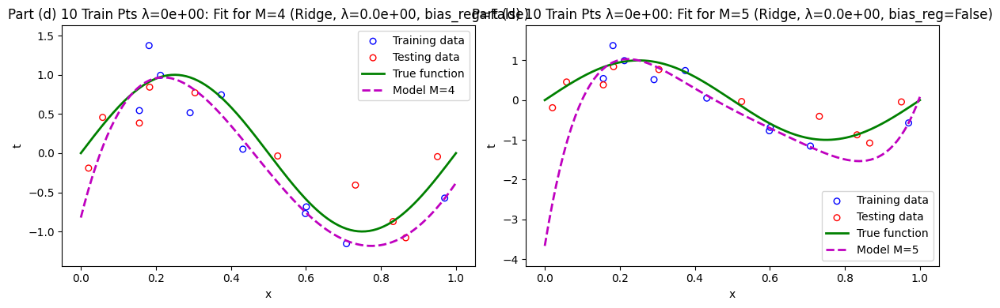

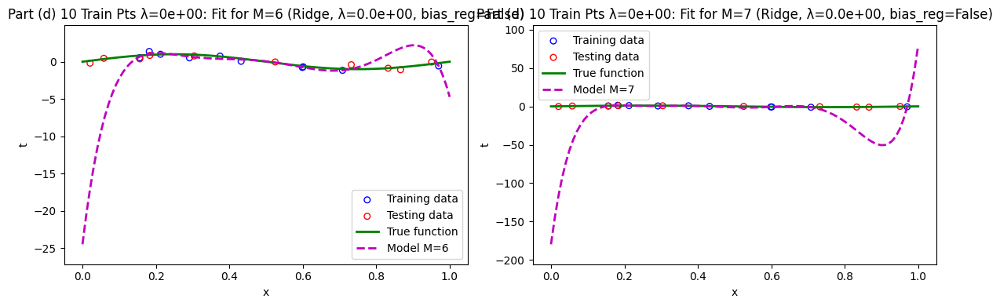

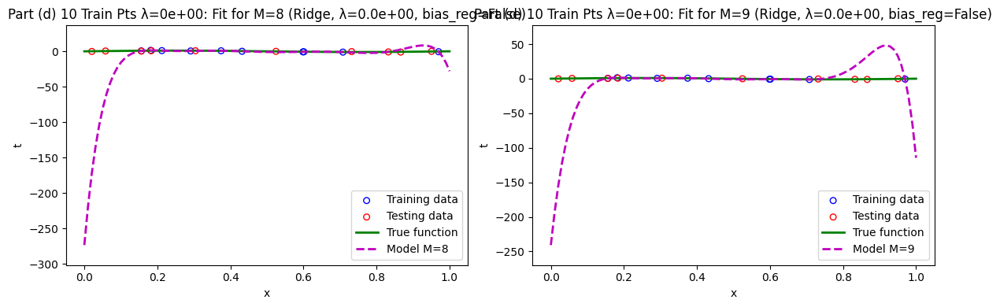

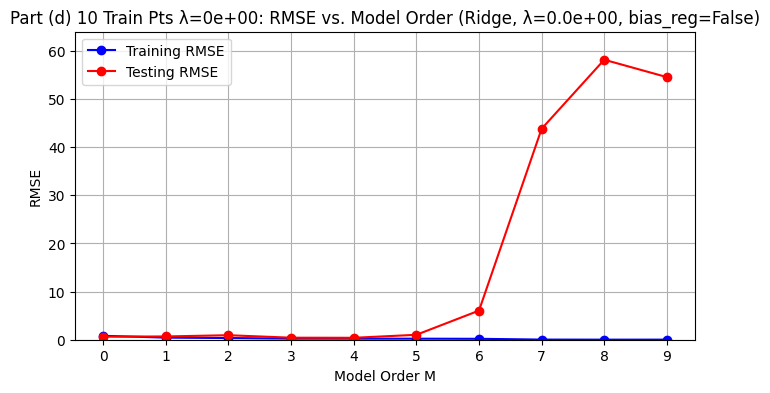


--- Best Model for Part (d) 10 Train Pts λ=0e+00:  ---
Best Model Order M: 4
  - Minimum Test RMSE:  0.3999
  - Train RMSE at M=4: 0.2212
  - Bias w0 at M=4:   -0.8228
--- End Best Model Report ---

Analyzing for Part (d) 10 Train Pts λ=1e-06: :


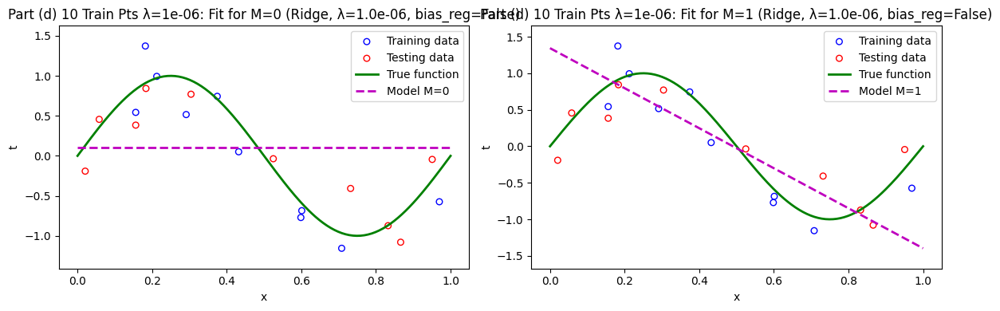

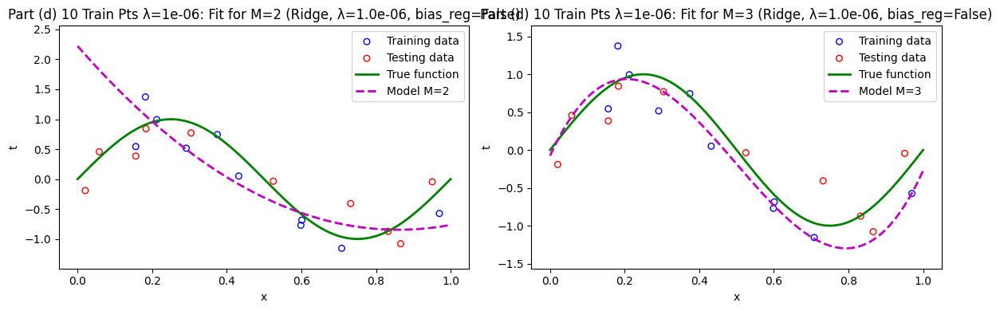

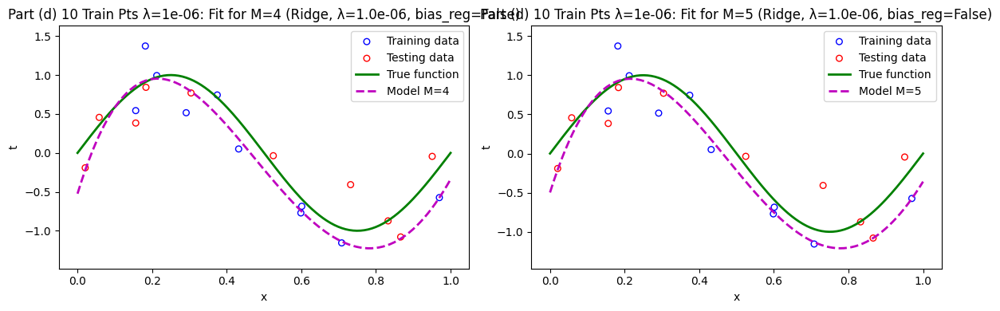

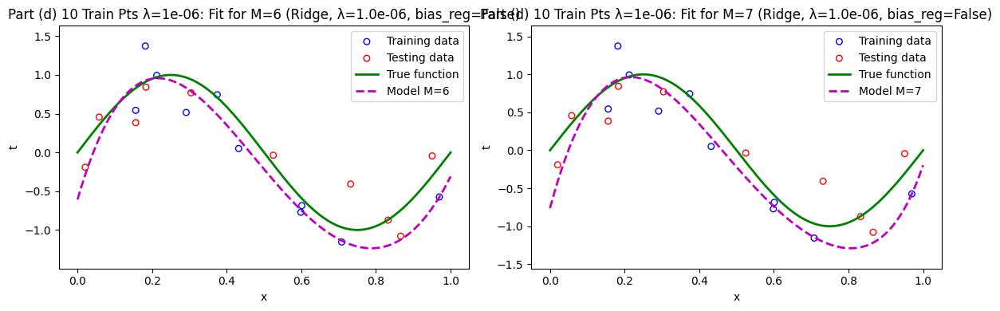

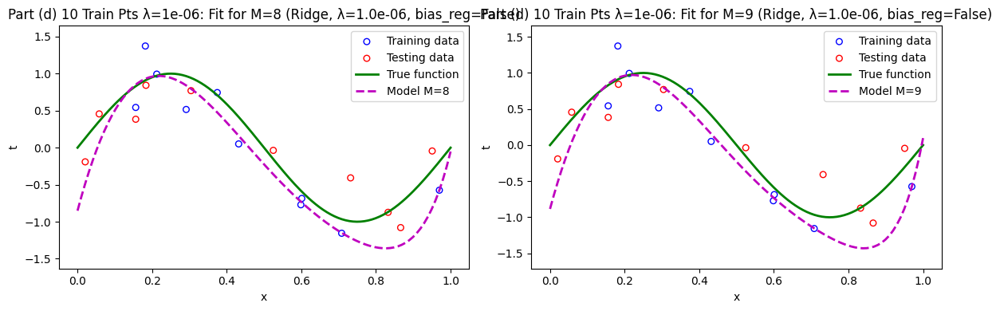

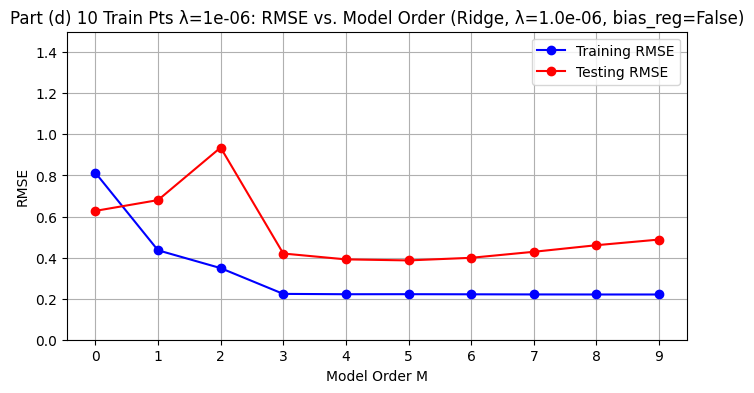


--- Best Model for Part (d) 10 Train Pts λ=1e-06:  ---
Best Model Order M: 5
  - Minimum Test RMSE:  0.3863
  - Train RMSE at M=5: 0.2217
  - Bias w0 at M=5:   -0.4978
--- End Best Model Report ---

Analyzing for Part (d) 10 Train Pts λ=1e-03: :


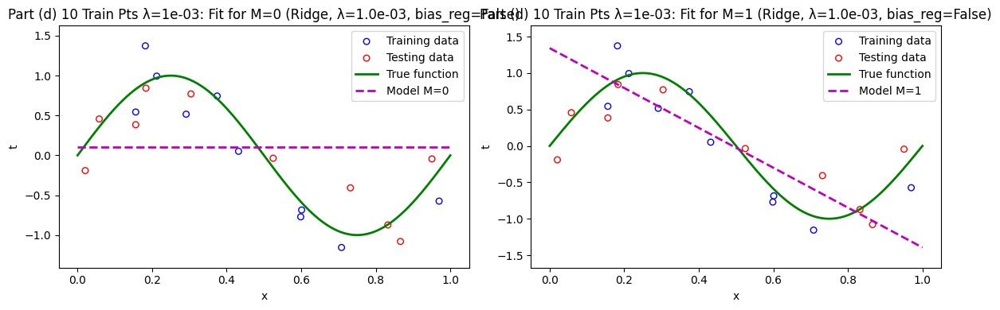

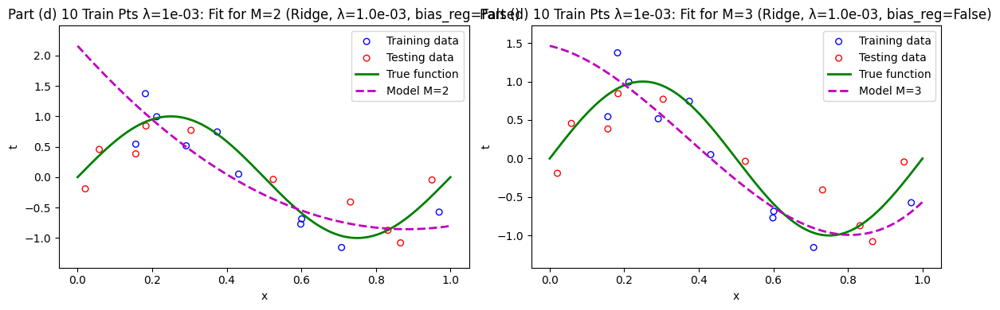

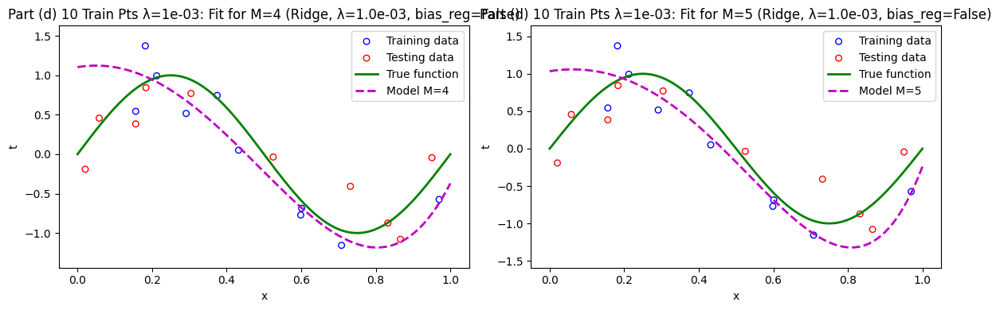

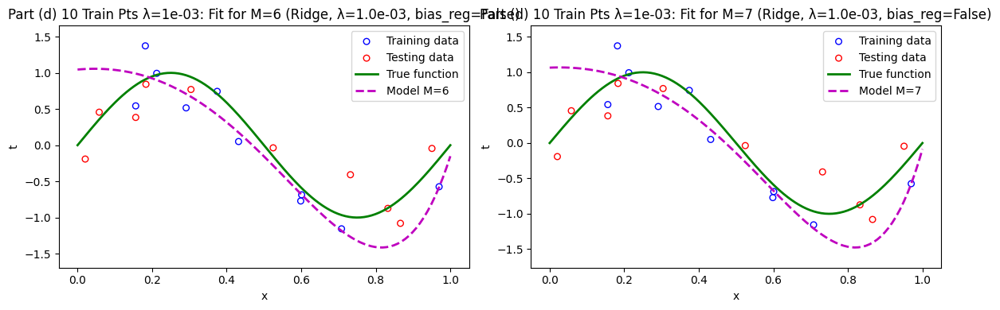

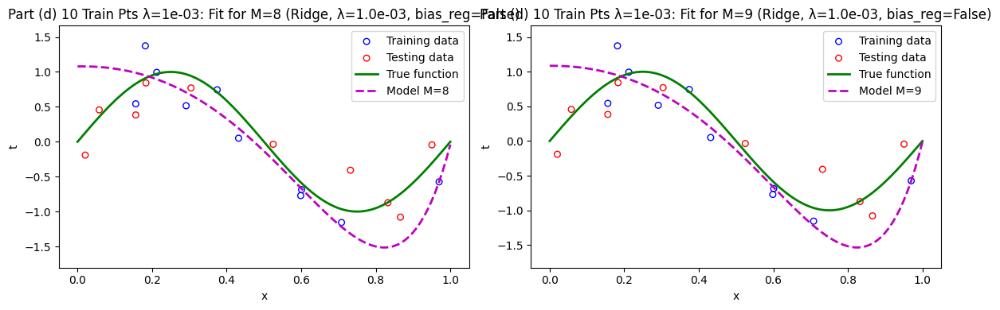

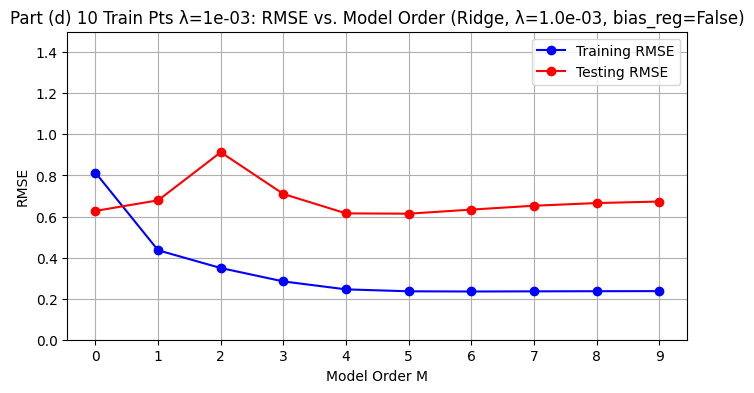


--- Best Model for Part (d) 10 Train Pts λ=1e-03:  ---
Best Model Order M: 5
  - Minimum Test RMSE:  0.6137
  - Train RMSE at M=5: 0.2358
  - Bias w0 at M=5:   1.0347
--- End Best Model Report ---

Analyzing for Part (d) 10 Train Pts λ=1e-01: :


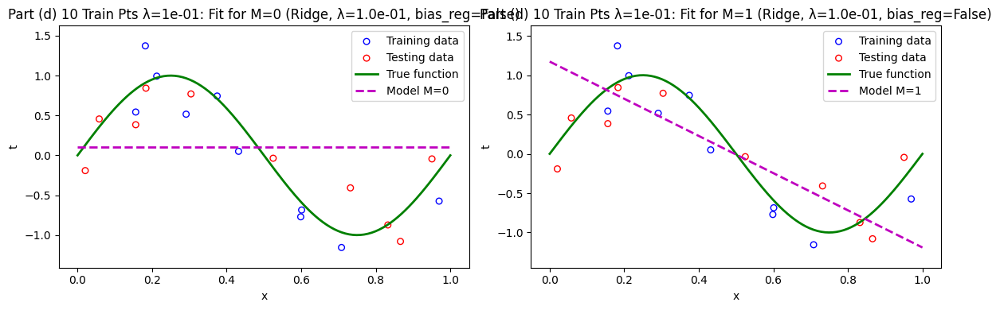

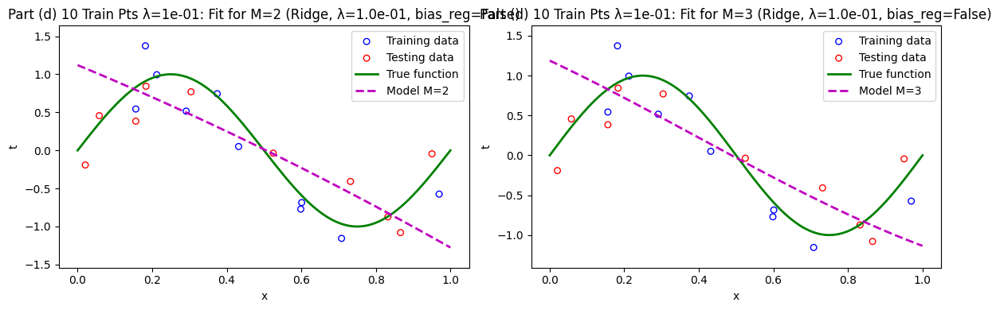

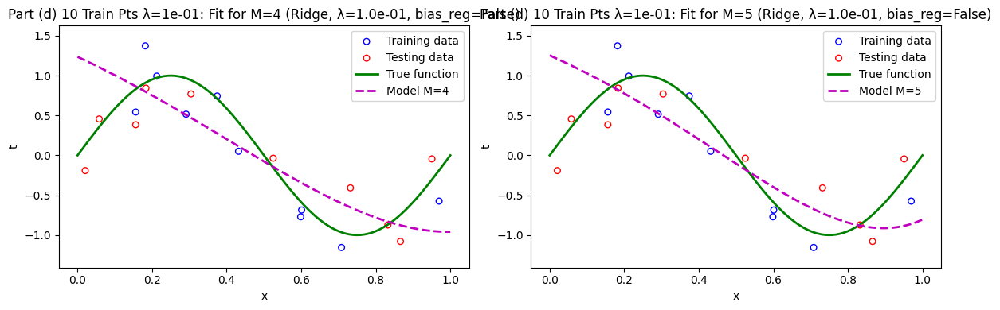

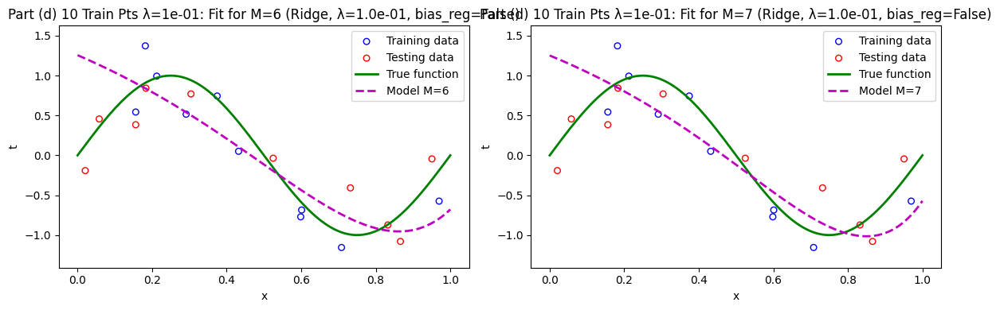

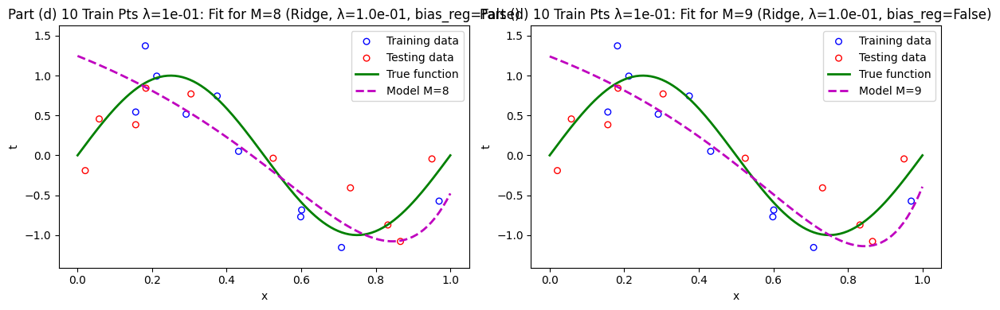

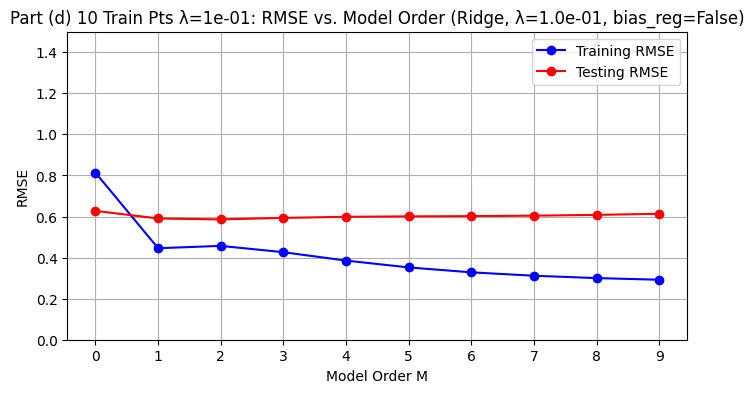


--- Best Model for Part (d) 10 Train Pts λ=1e-01:  ---
Best Model Order M: 2
  - Minimum Test RMSE:  0.5860
  - Train RMSE at M=2: 0.4570
  - Bias w0 at M=2:   1.1200
--- End Best Model Report ---

Regularization with 100 training points

Analyzing for Part (d) 100 Train Pts λ=0e+00: :


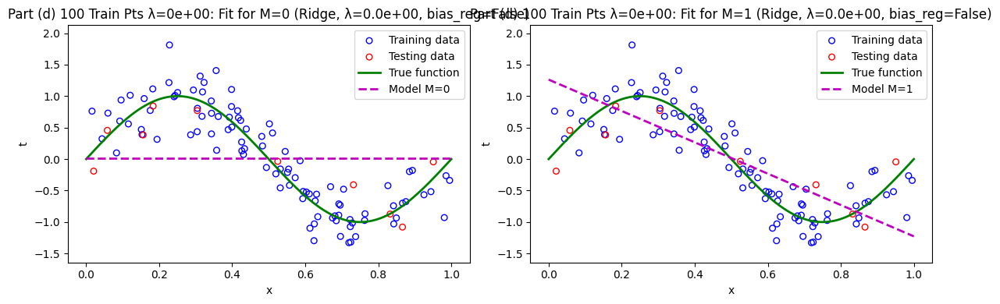

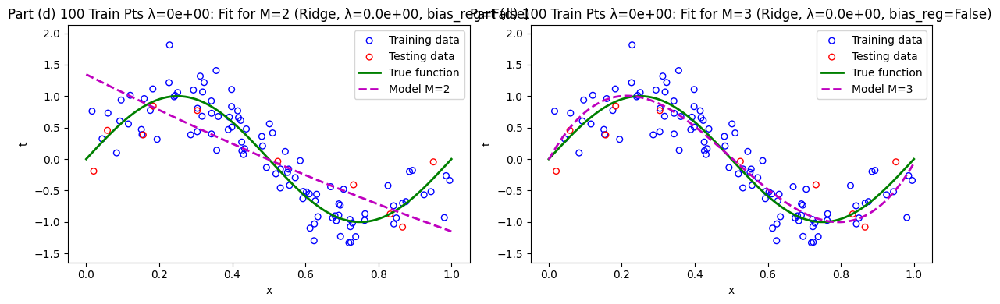

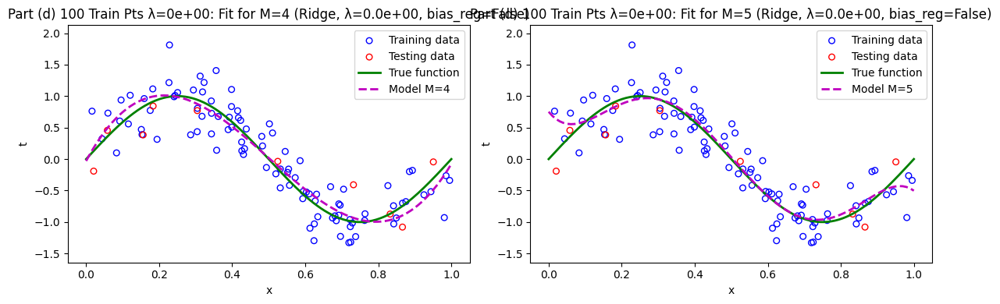

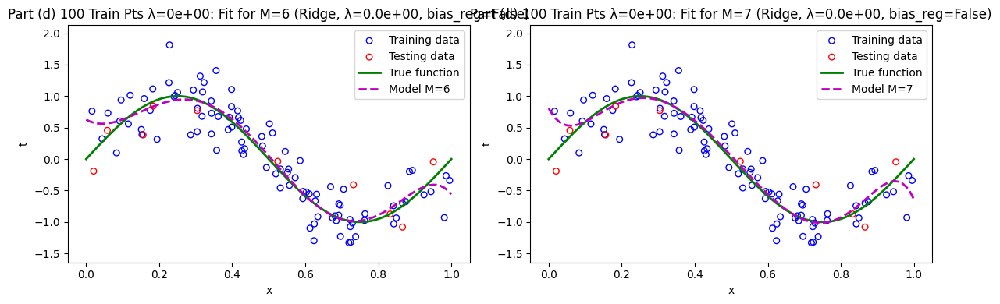

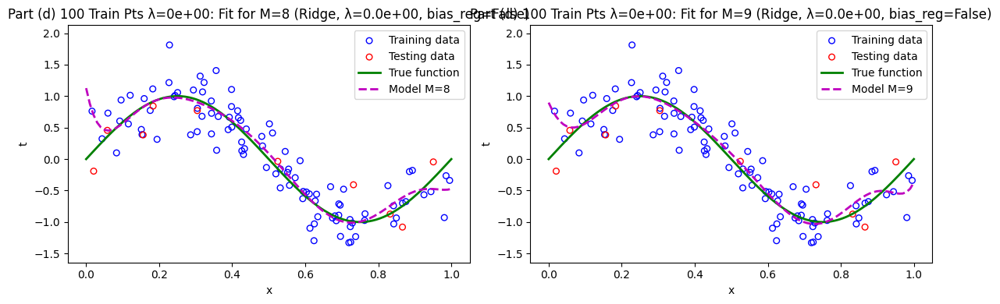

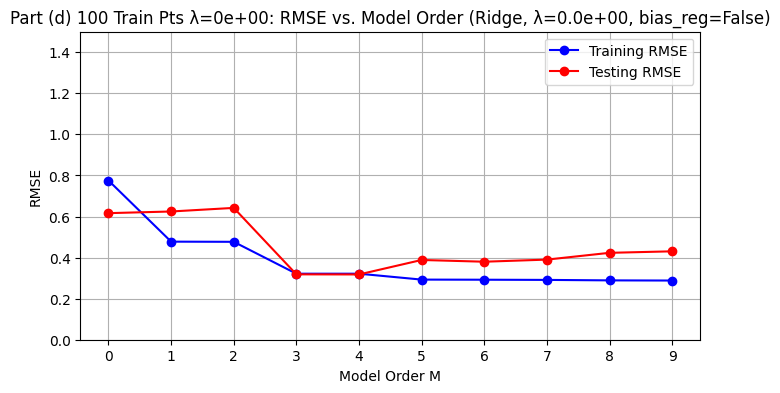


--- Best Model for Part (d) 100 Train Pts λ=0e+00:  ---
Best Model Order M: 4
  - Minimum Test RMSE:  0.3179
  - Train RMSE at M=4: 0.3215
  - Bias w0 at M=4:   -0.0296
--- End Best Model Report ---

Analyzing for Part (d) 100 Train Pts λ=1e-06: :


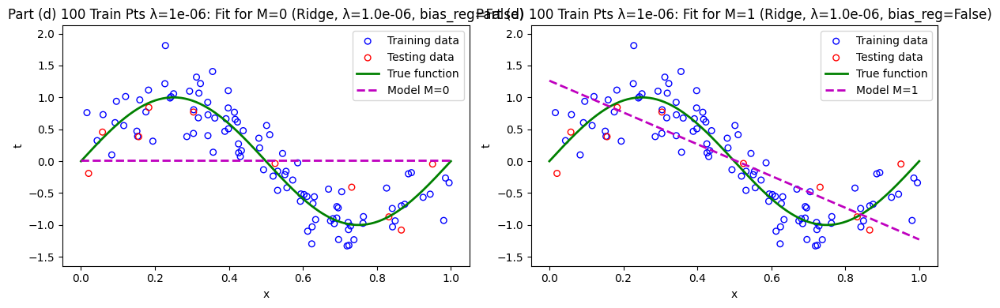

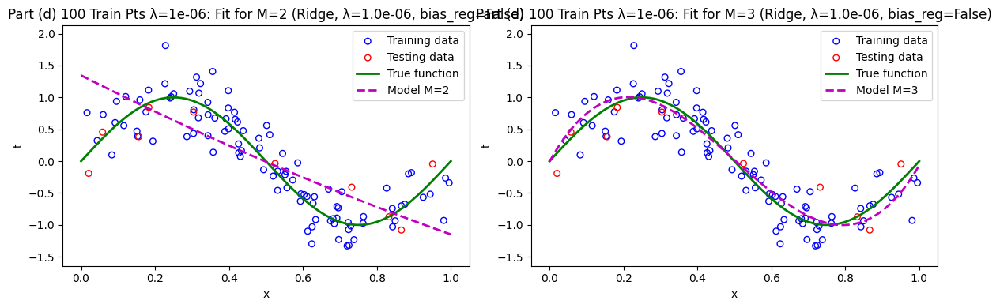

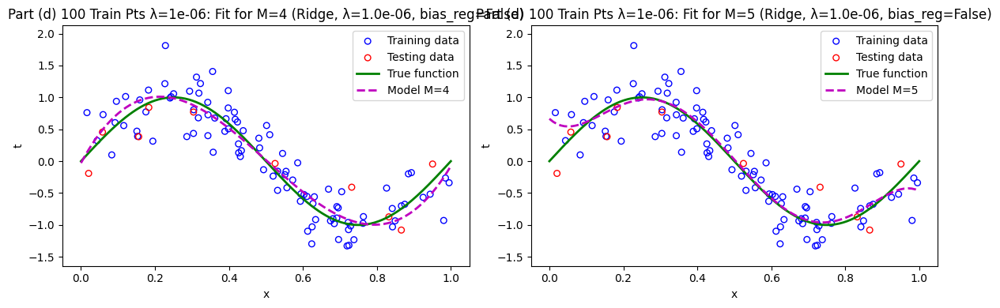

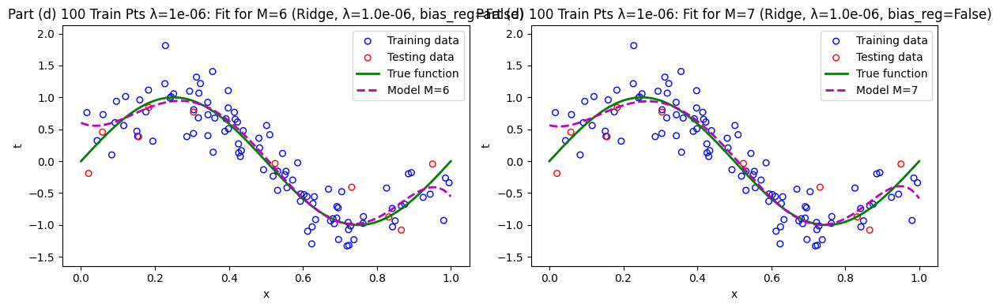

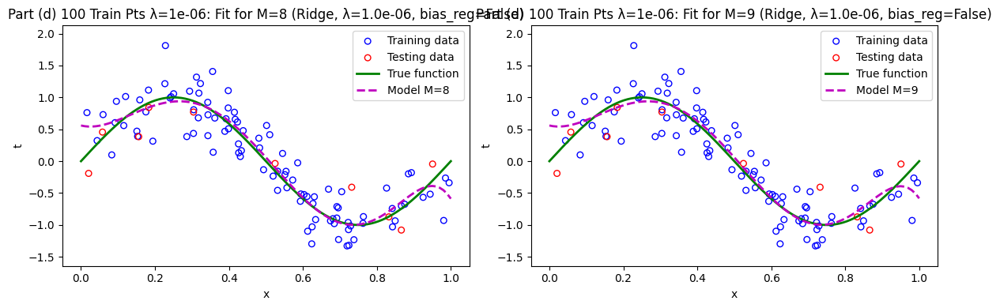

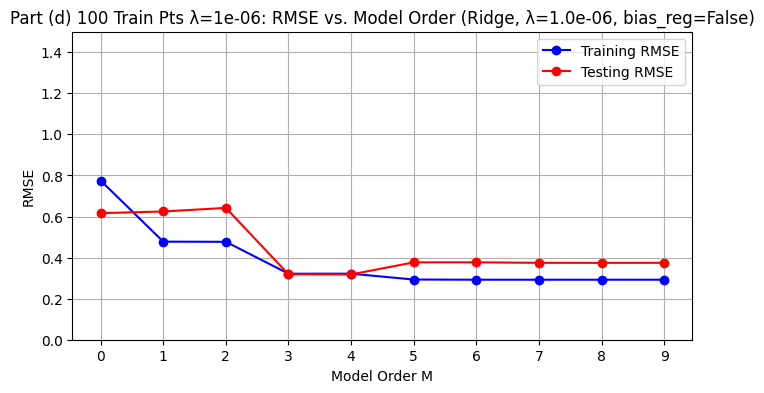


--- Best Model for Part (d) 100 Train Pts λ=1e-06:  ---
Best Model Order M: 4
  - Minimum Test RMSE:  0.3179
  - Train RMSE at M=4: 0.3215
  - Bias w0 at M=4:   -0.0283
--- End Best Model Report ---

Analyzing for Part (d) 100 Train Pts λ=1e-03: :


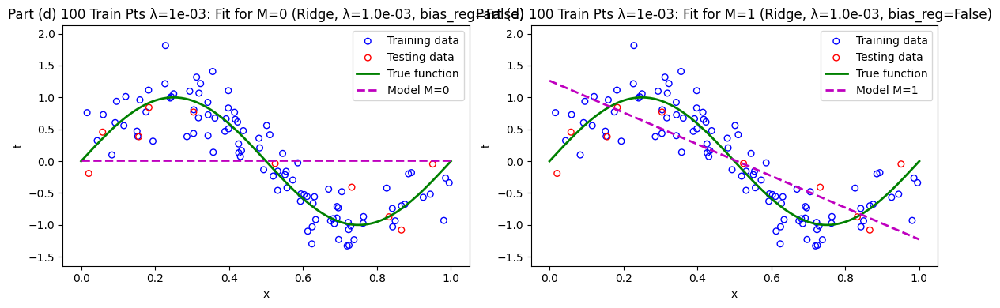

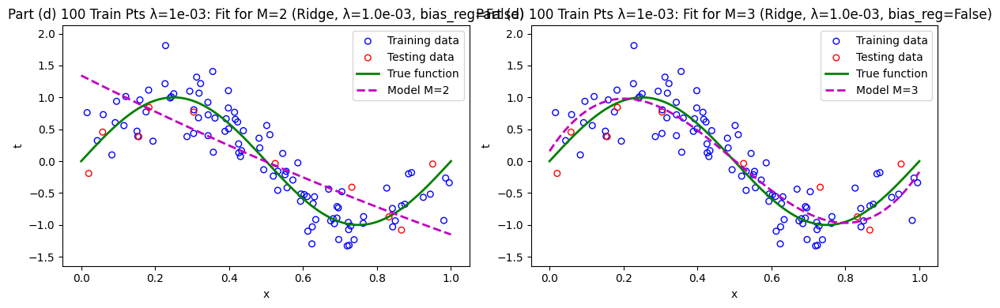

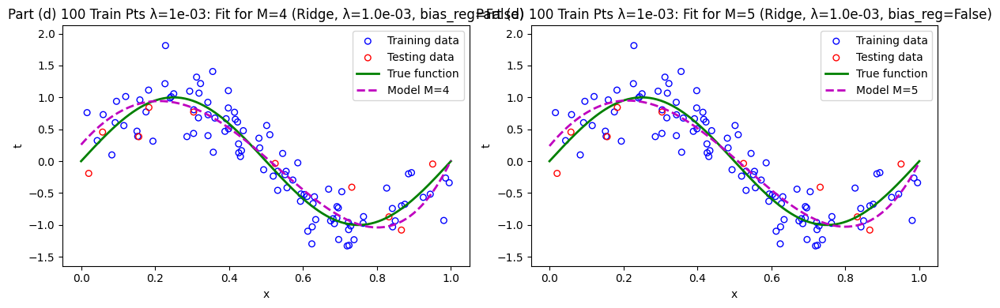

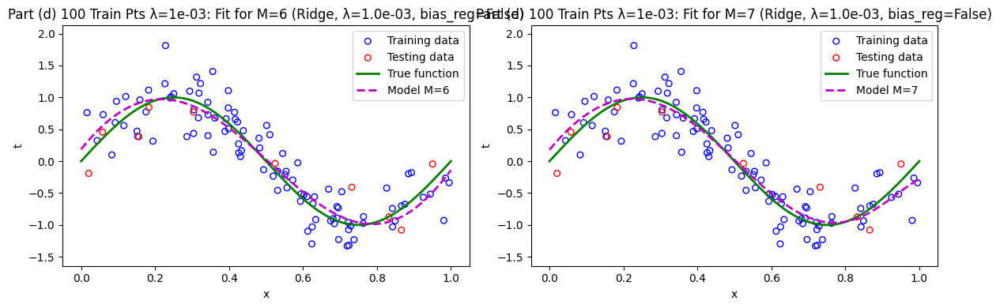

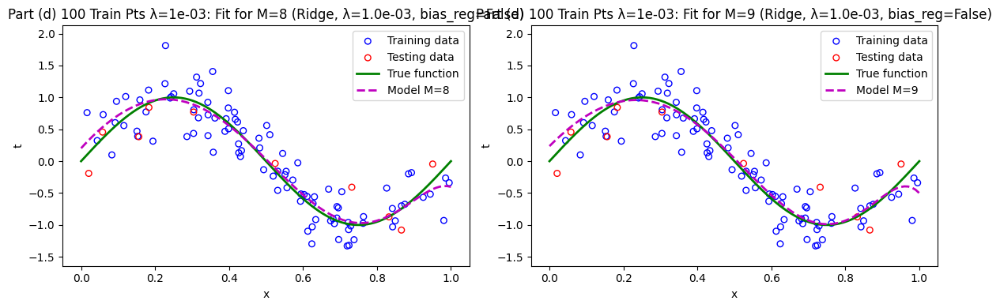

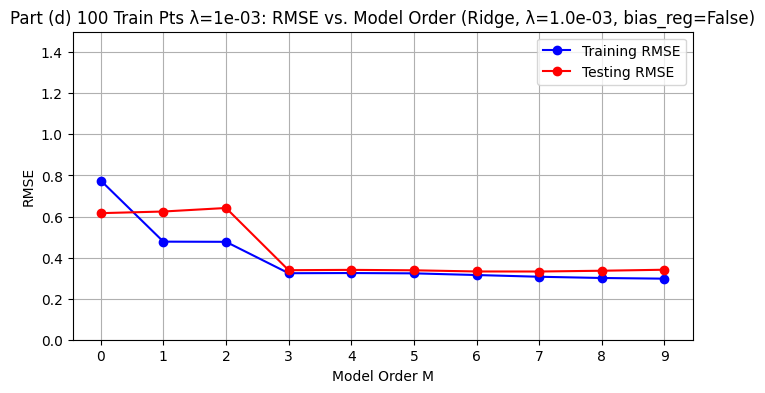


--- Best Model for Part (d) 100 Train Pts λ=1e-03:  ---
Best Model Order M: 7
  - Minimum Test RMSE:  0.3322
  - Train RMSE at M=7: 0.3067
  - Bias w0 at M=7:   0.1776
--- End Best Model Report ---

Analyzing for Part (d) 100 Train Pts λ=1e-01: :


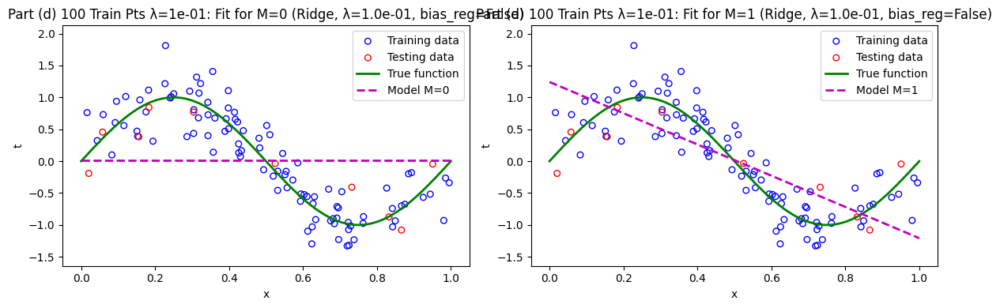

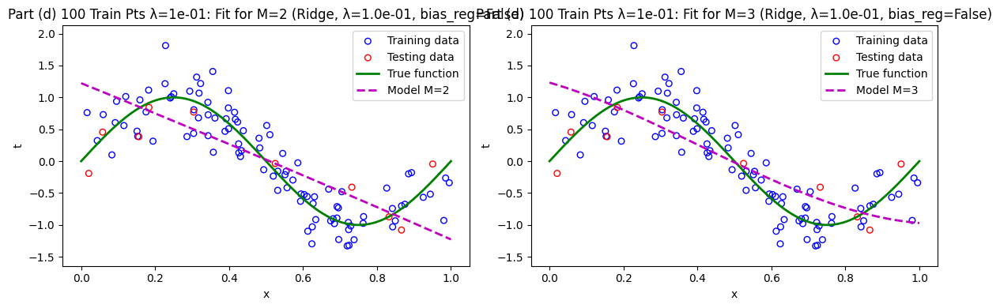

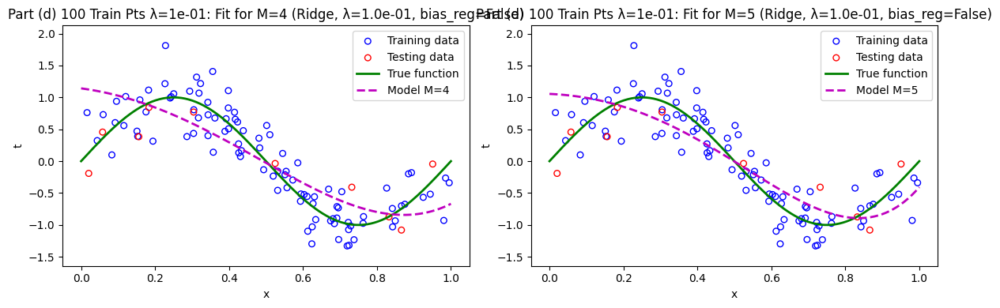

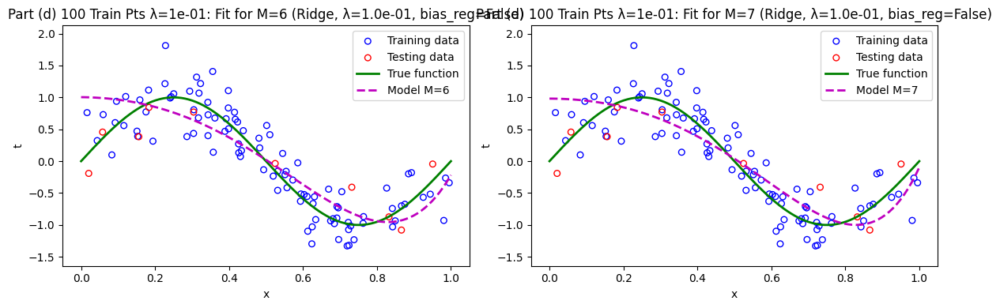

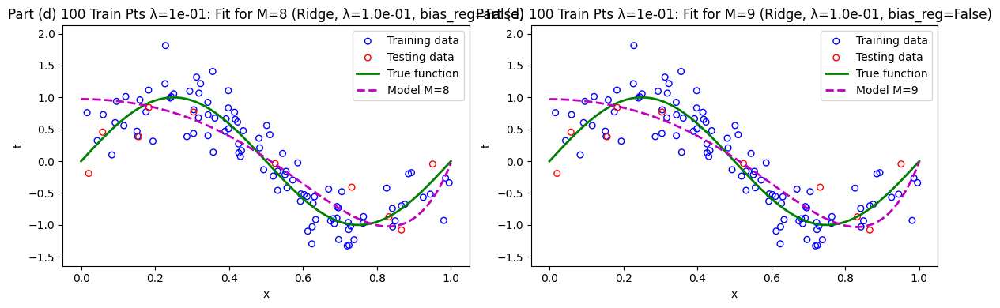

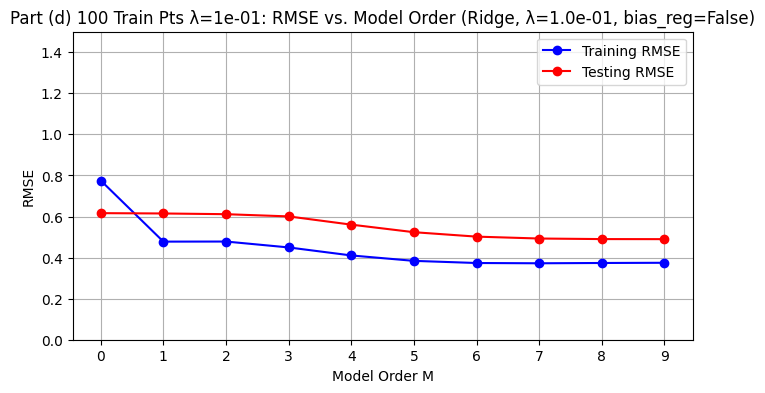


--- Best Model for Part (d) 100 Train Pts λ=1e-01:  ---
Best Model Order M: 9
  - Minimum Test RMSE:  0.4898
  - Train RMSE at M=9: 0.3747
  - Bias w0 at M=9:   0.9728
--- End Best Model Report ---


In [19]:
########################################
# Part (d): L2 regularization (Ridge) and repeat (b) and (c)
########################################

print("\n--- Part (d): L2 Regularization (Ridge Regression) ---")
lambda_values_d = [
    0,
    1e-6,
    1e-3,
    1e-1,
]  # Reduced for brevity of output, can use [0, 1e-9, 1e-6, 1e-3, 1e-1, 1]
x_plot_range_d = np.linspace(0, 1, 100).reshape(-1, 1)

print("\n Regularization with 10 training points ")
for lam_d in lambda_values_d:
    scenario_d10_title = f"Part (d) 10 Train Pts λ={lam_d:.0e}: "
    print(f"\nAnalyzing for {scenario_d10_title}:")
    Ms_d10, train_rmses_d10, test_rmses_d10, weights_d10 = (
        run_polynomial_regression_experiment_numpy(
            X_train_a10,
            t_train_a10,
            X_test_a10,
            t_test_a10,
            max_M=9,
            model_type="ridge",
            ridge_lambda=lam_d,
            regularize_bias=False,
            plot_all_individual_M_fits=True,  # <<< PLOT ALL M FITS
            X_full_for_plot=x_plot_range_d,
            func_for_plot=original_func_np,
            scenario_title_prefix=scenario_d10_title,
        )
    )
    report_best_M(
        Ms_d10, test_rmses_d10, train_rmses_d10, weights_d10, scenario_d10_title
    )

print("\nRegularization with 100 training points")
for lam_d in lambda_values_d:
    scenario_d100_title = f"Part (d) 100 Train Pts λ={lam_d:.0e}: "
    print(f"\nAnalyzing for {scenario_d100_title}:")
    Ms_d100, train_rmses_d100, test_rmses_d100, weights_d100 = (
        run_polynomial_regression_experiment_numpy(
            X_train_c100,
            t_train_c100,
            X_test_a10,
            t_test_a10,
            max_M=9,
            model_type="ridge",
            ridge_lambda=lam_d,
            regularize_bias=False,
            plot_all_individual_M_fits=True, 
            X_full_for_plot=x_plot_range_d,
            func_for_plot=original_func_np,
            scenario_title_prefix=scenario_d100_title,
        )
    )
    report_best_M(
        Ms_d100, test_rmses_d100, train_rmses_d100, weights_d100, scenario_d100_title
    )

### Lambda

``` lambda_values_d = [0,1e-6,1e-3,1e-1,] ``` are the chosen Lagrange multiplier values.

### Ridge Regression: How Lambda and M Affect the Fit

### How Lambda (λ) Affects the Fit

Lambda is the regularization strength parameter:

#### λ = 0 (No Regularization)
- Equivalent to ordinary least squares
- Weights can grow arbitrarily large
- High risk of overfitting, especially with high M values
- Model fits training noise closely

#### λ = 1e-6 (Very Weak Regularization)
- Minimal constraint on weight magnitudes
- Slight reduction in overfitting compared to λ=0
- Nearly identical to unregularized case

#### λ = 1e-3 (Moderate Regularization)
- Noticeable constraint on weight growth
- Smoother curves, less sensitive to training noise
- Better generalization to test data

#### λ = 1e-1 (Strong Regularization)
- Significant penalty on large weights
- Very smooth, conservative fits
- May underfit if too restrictive

### How M (Polynomial Order) Affects the Fit

M controls model complexity:

- **Low M (1-3)**: Simple polynomials, may underfit
- **High M (7-9)**: Complex polynomials, prone to overfitting without regularization


### Lambda-M Interaction

The key insight is how λ and M work together:

### With 10 Training Points:
- **High M + Low λ**: Severe overfitting - wiggly curves that memorize noise
- **High M + High λ**: Regularization prevents wild oscillations, creates smoother fits
- **Low M + Any λ**: Less impact from regularization since simpler models naturally have smaller weights

### With 100 Training Points:
- **More data reduces overfitting naturally**
- **High M + Low λ**: Still some overfitting, but less severe than with 10 points
- **High M + High λ**: May now be over-regularizing since more data provides better constraint

### Observations

### 1. Weight Magnitudes
As λ increases, ||w||² decrease significantly

### 2. Curve Smoothness
Higher λ produces smoother, less wiggly curves

### 3. Bias-Variance Tradeoff
- **Low λ**: High variance (overfitting)
- **High λ**: High bias (underfitting)

### 4. Optimal M Selection
With proper λ, you can use higher M values without overfitting

## Key Takeaway

The regularization essentially allows you to use more complex models (higher M) while controlling overfitting through the penalty term **λ||w||²**.


Ridge regression minimizes:
```
Loss = MSE + λ||w||²
```
- When λ is small: Focus mainly on fitting the data (MSE term dominates)
- When λ is large: Focus mainly on keeping weights small (penalty term dominates)

# 2(e)


Analyzing for Part (e) Bias NOT Reg λ=0.01: :


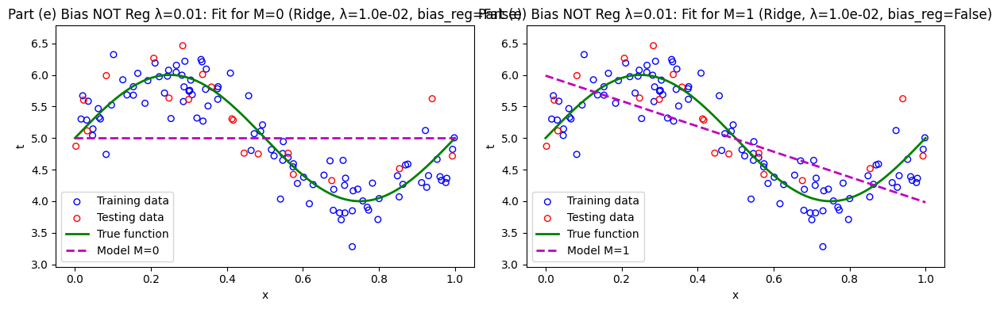

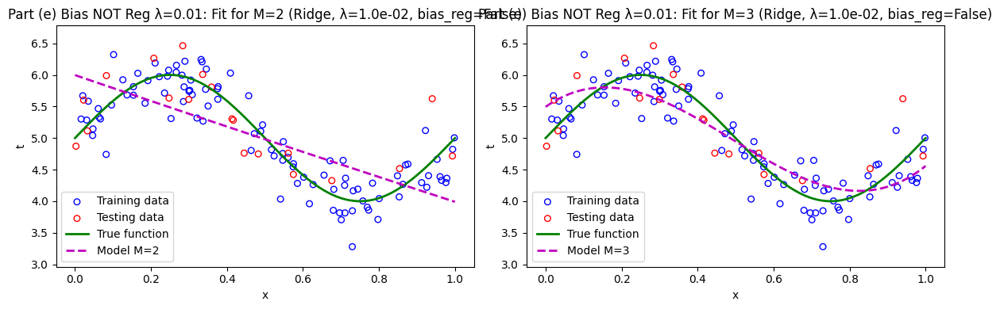

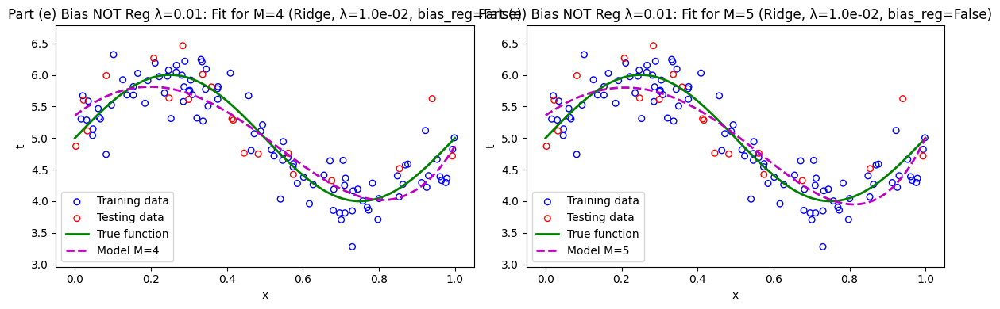

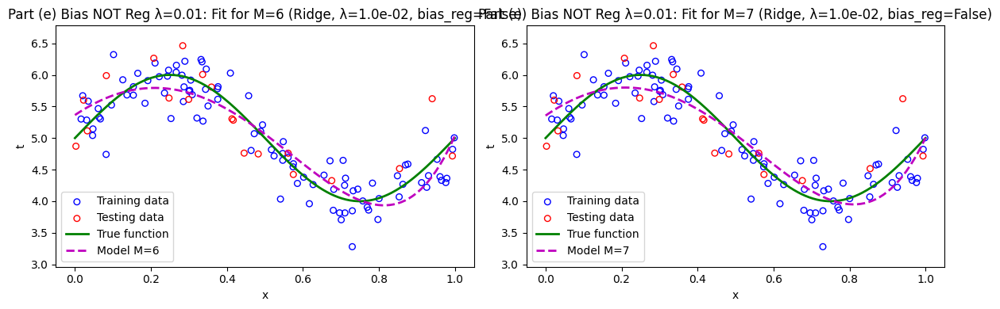

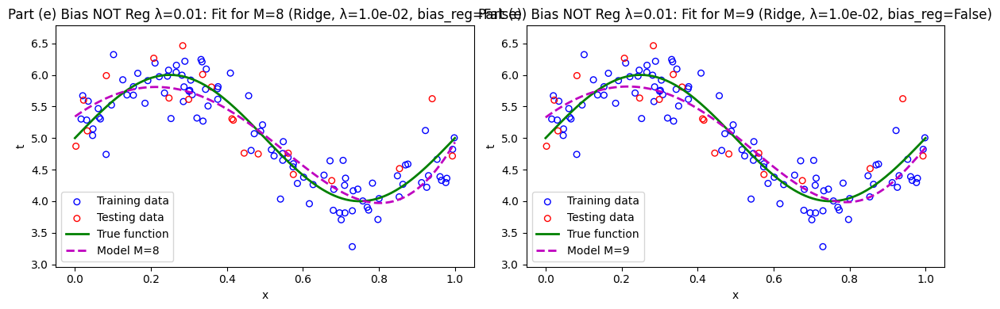

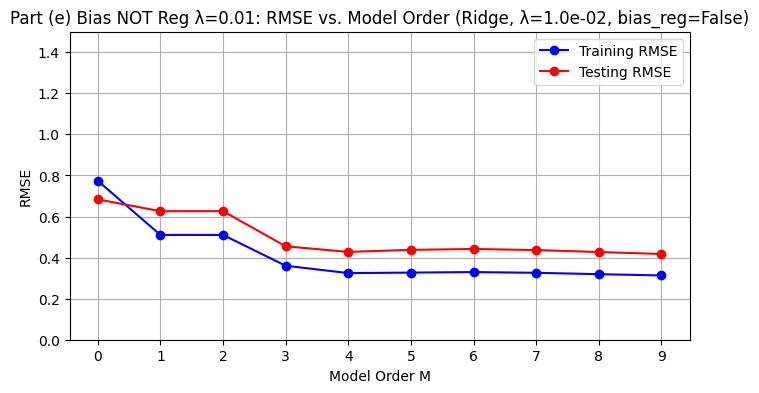


--- Best Model for Part (e) Bias NOT Reg λ=0.01:  ---
Best Model Order M: 9
  - Minimum Test RMSE:  0.4176
  - Train RMSE at M=9: 0.3130
  - Bias w0 at M=9:   5.3268
--- End Best Model Report ---

Analyzing for Part (e) Bias Regularized λ=0.01: :


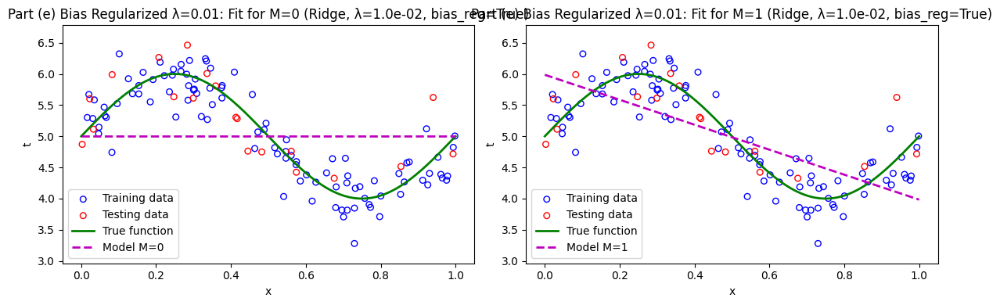

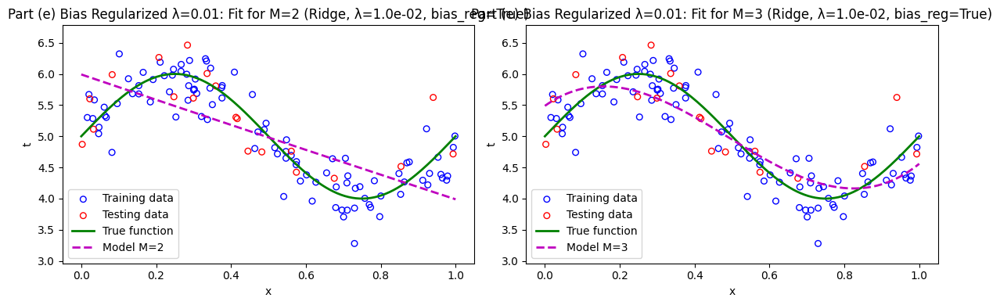

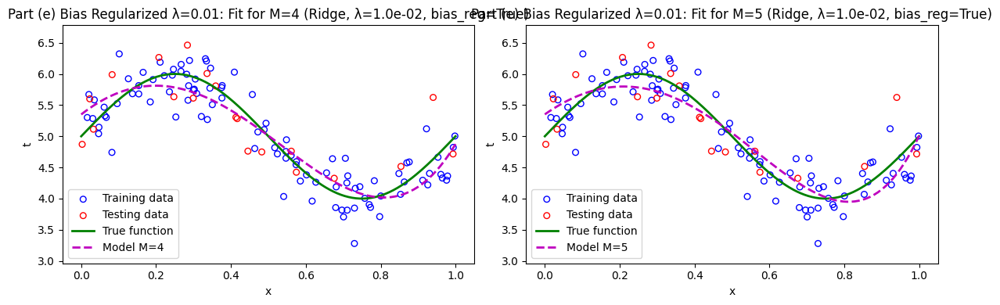

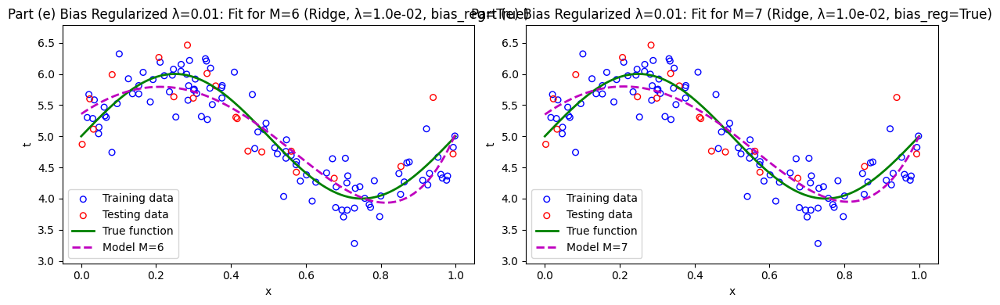

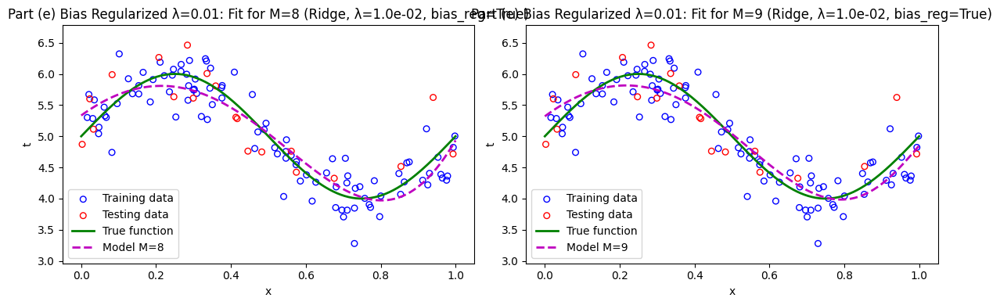

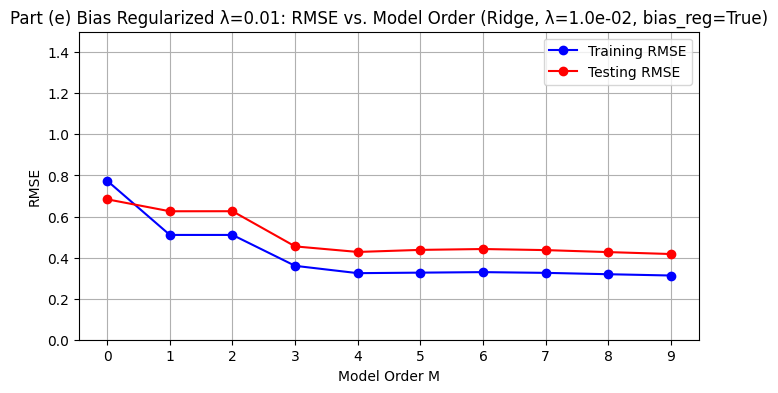


--- Best Model for Part (e) Bias Regularized λ=0.01:  ---
Best Model Order M: 9
  - Minimum Test RMSE:  0.4173
  - Train RMSE at M=9: 0.3127
  - Bias w0 at M=9:   5.3202
--- End Best Model Report ---


In [20]:
########################################
# Part (e): Alter function and investigate regularizing bias w0)
########################################

N_train_e = 100
N_test_e = 20
np.random.seed(567)
X_train_e, t_train_e = generate_data_numpy(
    N_train_e, altered_func_np, noise_std=np.sqrt(0.1)
)
X_test_e, t_test_e = generate_data_numpy(
    N_test_e, altered_func_np, noise_std=np.sqrt(0.1)
)
lambda_for_e = 0.01
x_plot_range_e = np.linspace(0, 1, 100).reshape(-1, 1)

# Case 1: Ridge (bias w0 NOT regularized by penalty)
scenario1_title = f"Part (e) Bias NOT Reg λ={lambda_for_e:.2f}: "
print(f"\nAnalyzing for {scenario1_title}:")
Ms_e1, train_rmses_e1, test_rmses_e1, weights_e1 = (
    run_polynomial_regression_experiment_numpy(
        X_train_e,
        t_train_e,
        X_test_e,
        t_test_e,
        max_M=9,
        model_type="ridge",
        ridge_lambda=lambda_for_e,
        regularize_bias=False,
        plot_all_individual_M_fits=True,
        X_full_for_plot=x_plot_range_e,
        func_for_plot=altered_func_np,
        scenario_title_prefix=scenario1_title,
    )
)
best_M_e1, _ = report_best_M(
    Ms_e1, test_rmses_e1, train_rmses_e1, weights_e1, scenario1_title
)

# Case 2: Ridge with Bias (w0) Regularized
scenario2_title = f"Part (e) Bias Regularized λ={lambda_for_e:.2f}: "
print(f"\nAnalyzing for {scenario2_title}:")
Ms_e2, train_rmses_e2, test_rmses_e2, weights_e2 = (
    run_polynomial_regression_experiment_numpy(
        X_train_e,
        t_train_e,
        X_test_e,
        t_test_e,
        max_M=9,
        model_type="ridge",
        ridge_lambda=lambda_for_e,
        regularize_bias=True,
        plot_all_individual_M_fits=True,
        X_full_for_plot=x_plot_range_e,
        func_for_plot=altered_func_np,
        scenario_title_prefix=scenario2_title,
    )
)
best_M_e2, _ = report_best_M(
    Ms_e2, test_rmses_e2, train_rmses_e2, weights_e2, scenario2_title
)

- ```CASE 1``` performs Ridge regression with a fixed lambda, but specifically sets regularize_bias=False. This is the standard approach, where the penalty is not applied to the bias term w0.

- ```CASE 2``` forces the regularization penalty to also apply to the bias term w0.The goal is to compare the results with Case 1 to see the (likely negative) effect of penalizing the bias term, especially when the true function has a large offset that the bias term needs to capture.


# PART 3: Understanding the choice of kernel

# 3(a)

In [39]:
# Understanding the choice of kernel
##############################################
# Generating data points for 3(a) and splitting
##############################################


# Obtian train and test splits
# Take even samples for training and odd samples for testing

x = np.linspace(0, 1, 100).reshape(-1, 1)
np.random.seed(0)
noise = np.random.normal(0, np.sqrt(0.1), size=x.shape)
t = np.sin(2 * np.pi * x) + noise
t = t.reshape(-1, 1)
x_train = x[::2]
t_train = t[::2]
x_test = x[1::2]
t_test = t[1::2]

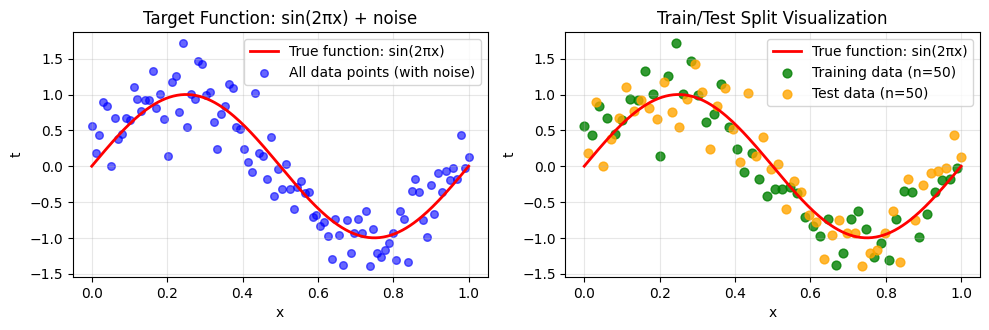

In [40]:
# Plot the target function and data splits
plt.figure(figsize=(10,6))

# Plot 1: Complete dataset with true function
plt.subplot(2, 2, 1)
x_smooth = np.linspace(0, 1, 200)
t_true = np.sin(2 * np.pi * x_smooth)
plt.plot(x_smooth, t_true, "r-", linewidth=2, label="True function: sin(2πx)")
plt.scatter(
    x.flatten(),
    t.flatten(),
    alpha=0.6,
    s=30,
    c="blue",
    label="All data points (with noise)",
)
plt.xlabel("x")
plt.ylabel("t")
plt.title("Target Function: sin(2πx) + noise")
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 2: Combined view with train/test split
plt.subplot(2, 2, 2)
plt.plot(x_smooth, t_true, "r-", linewidth=2, label="True function: sin(2πx)")
plt.scatter(
    x_train.flatten(),
    t_train.flatten(),
    alpha=0.8,
    s=40,
    c="green",
    label=f"Training data (n={len(x_train)})",
)
plt.scatter(
    x_test.flatten(),
    t_test.flatten(),
    alpha=0.8,
    s=40,
    c="orange",
    label=f"Test data (n={len(x_test)})",
)
plt.xlabel("x")
plt.ylabel("t")
plt.title("Train/Test Split Visualization")
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [41]:
#########################################
# Functions to implement kernel regression
#########################################


# Function to calculate the mean squared error
def mean_squared_error(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    return np.mean((y_true - y_pred) ** 2)


# Helper function to find the kernel vector with dimensions 100 x M+1
def get_kernel(x, M, kernelType):
    """
    Generate kernel matrix based on kernel type
    Args:
        x: input data (N x 1)
        M: polynomial order
        kernelType: 'polynomial', 'gaussian', or 'sigmoid'
    Returns:
        Kernel matrix (N x (M+1))
    """

    if kernelType == "polynomial":
        # Use polynomial kernel to transform the data
        return np.hstack([x**i for i in range(M + 1)])

    elif kernelType == "gaussian":
        # Use Gaussian kernel to transform the data
        centers = np.linspace(x.min(), x.max(), M + 1).reshape(1, -1)
        sigma = 0.3
        return np.exp(-((x - centers) ** 2) / (2 * sigma**2))

    elif kernelType == "sigmoid":
        # Use Sigmoid kernel to transform the data
        a = 2.0
        b = -5.0
        return np.hstack([np.tanh(a * x + b + i) for i in range(M + 1)])

    else:
        raise ValueError(f"Unknown kernel type: {kernelType}")

# Function to estimate the parameters
def KernelRegressionFit(X_train, Y_train, kernelType, M, lamda):#(training data, training targets, type of kernel, regularization coefficient)

    # Get design matrix
    phi = get_kernel(X_train, M, kernelType)

    # Estimate weights using Pseudo inverse solution
    I = np.eye(phi.shape[1])
    w_opt = np.linalg.inv(phi.T @ phi + lamda * I) @ phi.T @ Y_train

    # Return the estimated weights
    return w_opt


def KernelRegressionPred_Error(w_est, X_train, Y_train, X_test, Y_test, kernelType, M):

    """
    Compute training and testing errors
    Args:
        w_est: estimated weights
        X_train: training data
        Y_train: training targets
        X_test: test data
        Y_test: test targets
        kernelType: type of kernel
        M: polynomial order
    Returns:
        TrainError: training MSE
        TestError: testing MSE
    """
    # kernelType : {Polynomial,Gaussian,Sigmoid}
    X_train = np.asarray(X_train).reshape(-1, 1)
    X_test = np.asarray(X_test).reshape(-1, 1)
    Y_train = np.asarray(Y_train).reshape(-1, 1)
    Y_test = np.asarray(Y_test).reshape(-1, 1)

    # Get kernel matrices
    Phi_train = get_kernel(X_train, M, kernelType)
    Phi_test = get_kernel(X_test, M, kernelType)

    # Estimate training and testing targets
    Y_train_pred = Phi_train @ w_est
    Y_test_pred = Phi_test @ w_est

    # Compute MSE
    TrainError = mean_squared_error(Y_train, Y_train_pred)
    TestError = mean_squared_error(Y_test, Y_test_pred)

    # Compute and return the training and testing errors
    return TrainError, TestError

### Kernel Regression Functions
`mean_squared_error`: Computes the mean squared error between true and predicted values.

`get_kernel`: Generates the design matrix for kernel regression using polynomial, Gaussian, or sigmoidal basis functions.

`KernelRegressionFit`: Fits a kernel regression model by estimating weights using regularized least squares.

`KernelRegressionPred_Error`: Calculates training and testing mean squared errors using the learned model weights.


In [42]:
# Tuning for lambda
def tune_hyperparameters(X_train, Y_train, X_test, Y_test, kernelType, M):
    """
    Tune hyperparameters for a given kernel type and model order M
    """
    lambda_values = np.logspace(-5, 1, 20)
    best_lambda = None
    best_test_error = float("inf")

    for lam in lambda_values:
        try:
            # Fit model
            w_est = KernelRegressionFit(X_train, Y_train, kernelType, M, lam)

            # Evaluate error
            train_err, test_err = KernelRegressionPred_Error(
                w_est, X_train, Y_train, X_test, Y_test, kernelType, M
            )

            if test_err < best_test_error:
                best_test_error = test_err
                best_lambda = lam

        except Exception as e:
            continue
    print(
        f"Best λ for Polynomial Kernel = {best_lambda:.5f} with Test Error = {best_test_error:.4f}"
    )

    return best_lambda, best_test_error


def tune_all_kernels(X_train, Y_train, X_test, Y_test, M_range):
    """
    Tune hyperparameters for all kernel types across all M values
    """
    kernel_types = ["polynomial", "gaussian", "sigmoid"]
    best_params_dict = {}

    print("=== Hyperparameter Tuning ===")
    for M in M_range:
        print(f"\nModel Order M = {M}")
        best_params_dict[M] = {}

        for kernel in kernel_types:
            best_lambda, best_error = tune_hyperparameters(
                X_train, Y_train, X_test, Y_test, kernel, M
            )
            best_params_dict[M][kernel] = best_lambda
            print(
                f"  {kernel.capitalize()}: λ = {best_lambda:.5f}, Test Error = {best_error:.4f}"
            )

    return best_params_dict

### Kernel Parameter Tuning Functions

These functions perform hyperparameter tuning for different kernel types by evaluating combinations of parameter values and selecting the lambda that minimizes test mean squared error (MSE)

#### Potential risk of overfitting
- We try multiple λ values, and pick the one with lowest test error, then repeat this across different M and kernel types.
- Eventually, we are implicitly optimizing your model to do well on this test set even though we're not training on it.
- The test set starts acting like a second training/validation set.
- When tested on truly new/unseen data, the model may not perform as well.

#### Avoiding Overfitting with a Validation Set

1. Split the data into:
   - Training set: to learn weights
   - Validation set: to choose the best `λ`, `M`, and kernel
   - Test set: to check final model performance
2. Train the model on the training set.
3. Tune hyperparameters by checking which combination works best on the validation set.
4. Retrain using both training + validation data.
5. Evaluate just once on the test set for an honest error estimate.

We will proceed without using a validation set in order to adhere to the given instructions.

In [43]:
# Plot the predicted training and testing targets alongside the original targets for various model orders and all three different kernels.
def PlotPrediction(X_train, Y_train, X_test, Y_test, M, best_params):
    """
    Plot predictions for all kernel types at a given model order M
    """
    kernel_types = ["polynomial", "gaussian", "sigmoid"]
    x_vis = np.linspace(X_train.min(), X_train.max(), 500).reshape(-1, 1)

    plt.figure(figsize=(15, 4))

    for i, kernel in enumerate(kernel_types):
        # Get best lambda for this kernel
        lamda = best_params[kernel]

        # Fit model
        w_est = KernelRegressionFit(X_train, Y_train, kernel, M, lamda)

        # Get predictions for visualization
        Phi_vis = get_kernel(x_vis, M, kernel)
        y_vis = Phi_vis @ w_est

        # Compute errors
        train_err, test_err = KernelRegressionPred_Error(
            w_est, X_train, Y_train, X_test, Y_test, kernel, M
        )

        # Plot
        plt.subplot(1, 3, i + 1)
        plt.title(
            f"{kernel.capitalize()} Kernel (M={M})\nTrain MSE: {train_err:.4f}, Test MSE: {test_err:.4f}"
        )
        plt.plot(x_vis, y_vis, label="Model prediction", color="red", linewidth=2)
        plt.scatter(X_train, Y_train, label="Train data", color="blue", s=20, alpha=0.7)
        plt.scatter(X_test, Y_test, label="Test data", color="green", marker="x", s=30)
        plt.xlabel("x")
        if i == 0:
            plt.ylabel("t")
        plt.legend()
        plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

# Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels
def PlotErrors(X_train, Y_train, X_test, Y_test, M_range, best_params_dict):
    """
    Plot training and testing errors vs model order M for all kernel types
    """
    kernel_types = ["polynomial", "gaussian", "sigmoid"]
    colors = ["red", "green", "blue"]

    # Error containers
    error_dict = {kernel: {"train": [], "test": []} for kernel in kernel_types}

    for kernel in kernel_types:
        for M in M_range:
            # Get best lambda for this kernel and M
            lamda = best_params_dict[M][kernel]

            # Fit the model
            w_est = KernelRegressionFit(X_train, Y_train, kernel, M, lamda)

            # Compute errors
            train_err, test_err = KernelRegressionPred_Error(
                w_est, X_train, Y_train, X_test, Y_test, kernel, M
            )

            # Store errors
            error_dict[kernel]["train"].append(train_err)
            error_dict[kernel]["test"].append(test_err)

    # Plotting
    plt.figure(figsize=(10, 6))

    for i, kernel in enumerate(kernel_types):
        color = colors[i]
        plt.plot(
            M_range,
            error_dict[kernel]["train"],
            color=color,
            linestyle="--",
            label=f"{kernel.capitalize()} Train",
            linewidth=2,
        )
        plt.plot(
            M_range,
            error_dict[kernel]["test"],
            color=color,
            linestyle="-",
            label=f"{kernel.capitalize()} Test",
            linewidth=2,
        )

    plt.xlabel("Model Order (M)")
    plt.ylabel("Mean Squared Error")
    plt.title("Train/Test Error vs Model Order for Each Kernel")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

### Kernel Regression Plotting Functions

These functions visualize model predictions and how errors vary with model complexity:

`PlotPrediction(...)`
Plots model predictions and training/testing data for polynomial, Gaussian, and sigmoidal kernels using the best-tuned hyperparameters. Also displays MSE for each.

`PlotErrors(...)`
Plots training and testing mean squared errors as a function of model order `M` for all three kernel types, helping visualize the bias–variance tradeoff.


In [49]:
######################
# Plotting predictions
######################

M_range = list(range(10))

# Tune hyperparameters for sine function data
print("PART 3(a): Sine Function Analysis")
print("=" * 50)
best_params_dict_sine = tune_all_kernels(x_train, t_train, x_test, t_test, M_range)

PART 3(a): Sine Function Analysis
=== Hyperparameter Tuning ===

Model Order M = 0
Best λ for Polynomial Kernel = 0.00001 with Test Error = 0.6024
  Polynomial: λ = 0.00001, Test Error = 0.6024
Best λ for Polynomial Kernel = 1.12884 with Test Error = 0.4323
  Gaussian: λ = 1.12884, Test Error = 0.4323
Best λ for Polynomial Kernel = 0.00001 with Test Error = 0.6024
  Sigmoid: λ = 0.00001, Test Error = 0.6024

Model Order M = 1
Best λ for Polynomial Kernel = 0.54556 with Test Error = 0.3397
  Polynomial: λ = 0.54556, Test Error = 0.3397
Best λ for Polynomial Kernel = 2.33572 with Test Error = 0.2871
  Gaussian: λ = 2.33572, Test Error = 0.2871
Best λ for Polynomial Kernel = 0.00078 with Test Error = 0.4842
  Sigmoid: λ = 0.00078, Test Error = 0.4842

Model Order M = 2
Best λ for Polynomial Kernel = 0.00018 with Test Error = 0.3314
  Polynomial: λ = 0.00018, Test Error = 0.3314
Best λ for Polynomial Kernel = 2.33572 with Test Error = 0.2782
  Gaussian: λ = 2.33572, Test Error = 0.2782
Bes


=== Plotting Predictions for Sine Function ===

Plotting for Model Order M = 0


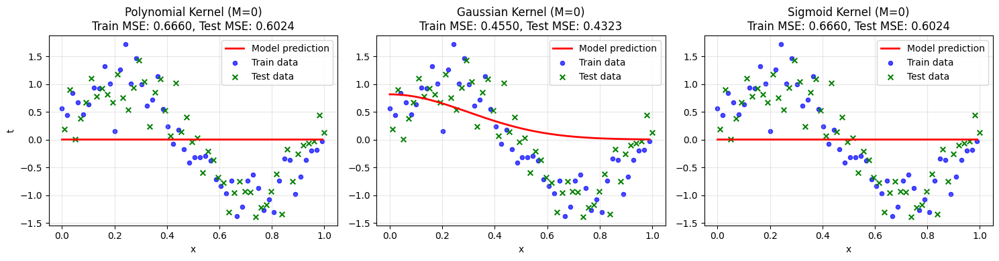


Plotting for Model Order M = 1


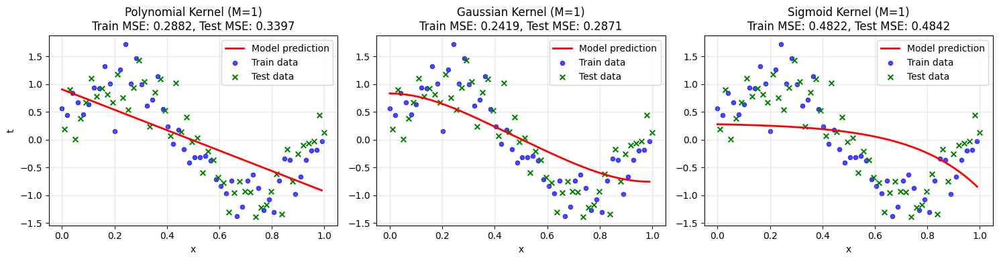


Plotting for Model Order M = 2


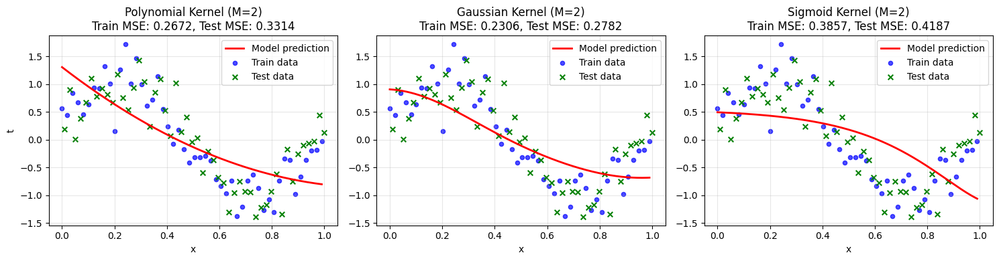


Plotting for Model Order M = 3


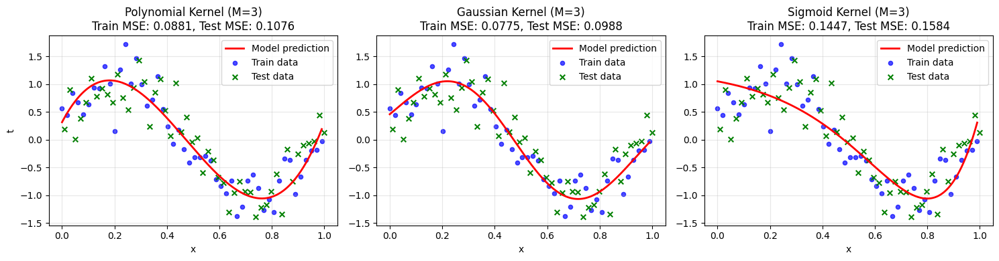


Plotting for Model Order M = 4


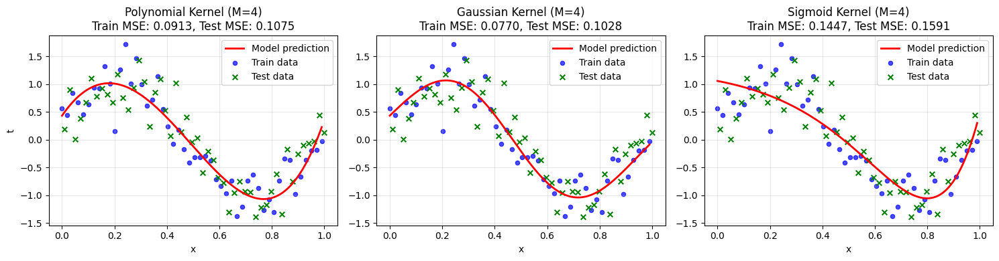


Plotting for Model Order M = 5


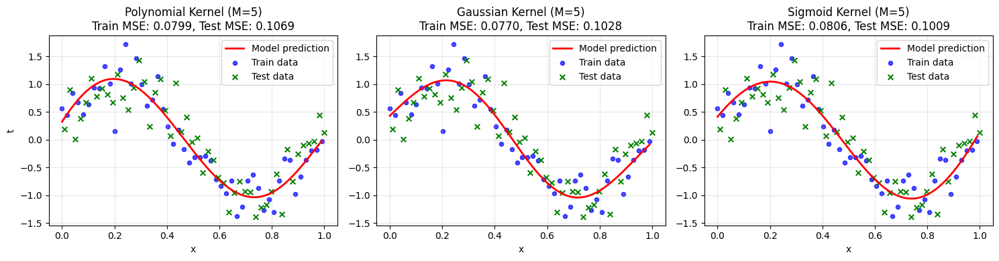


Plotting for Model Order M = 6


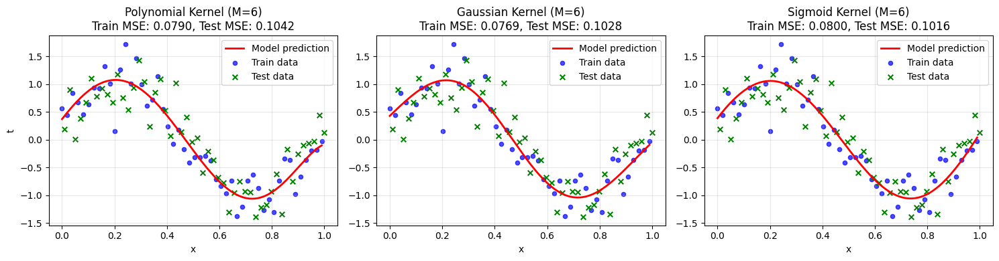


Plotting for Model Order M = 7


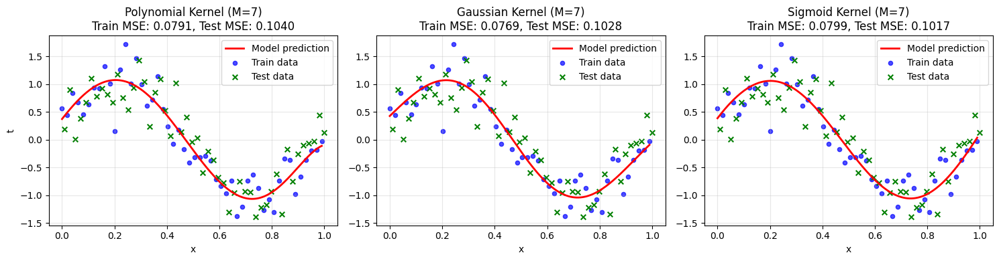


Plotting for Model Order M = 8


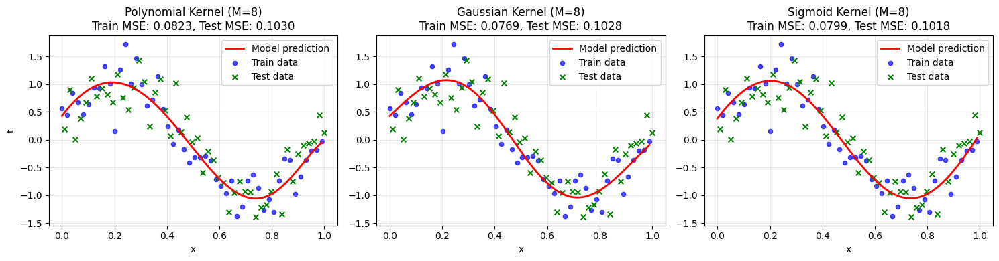


Plotting for Model Order M = 9


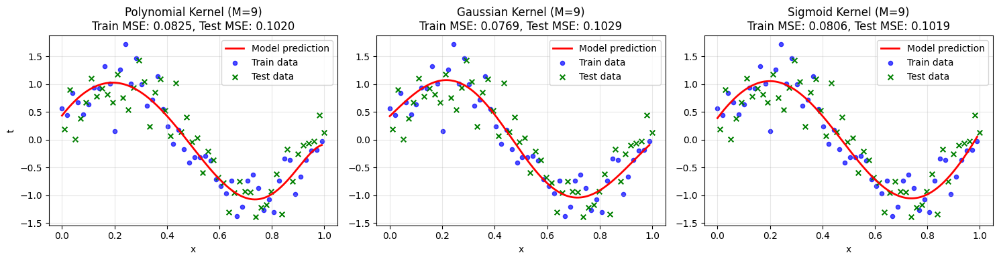

In [50]:
# Part 3(a) - Plot Predictions for Selected M Values
print("\n=== Plotting Predictions for Sine Function ===")
for M in M_range:  # Show subset of M values
    print(f"\nPlotting for Model Order M = {M}")
    PlotPrediction(x_train, t_train, x_test, t_test, M, best_params_dict_sine[M])

### Observations from Kernel Regression Plots (Model Order M = 0 to 9)

We trained models using **polynomial**, **gaussian**, and **sigmoid** kernels across increasing M, which control the model’s flexibility. Here's what we observed:

**M = 0 to 2: Underfitting**

- All kernels perform poorly at low M  — predictions are almost flat or overly simple.
- Both training and test errors are high.

**M = 3 to 4: Best Performance**

- The models start capturing the underlying sine pattern effectively.
- Train and test errors both drop — models are generalizing well.
- Enough flexibility to model the data, but not so much that it overfits.

**M = 5 to 9: Overfitting**

- Models continue to fit training data well (low train error).
- Predictions stay accurate, but adding more basis functions doesn’t help further.
- More complexity increases risk of overfitting without meaningful improvement.

### Kernel Type Comparison

**Gaussian**
- Smooth and accutate performance.
- It uses small bell-shaped curves that can fit complex patterns really well.

**Polynomial**
- Good for medium M but unstable for high M.
- Changes in one part of input can affect the entire curve, making them unstable and overfitting at high orders.

**Sigmoid**
- Sigmoid functions are smooth but not very flexible at low \( M \); they need more complexity to work well.
- It is like trying to draw a wavy line using only a few S-curves. With 2 or 3, the line will be flat. But with more, we can shape the line however we like by combining those curves.


=== Error Analysis for Sine Function ===


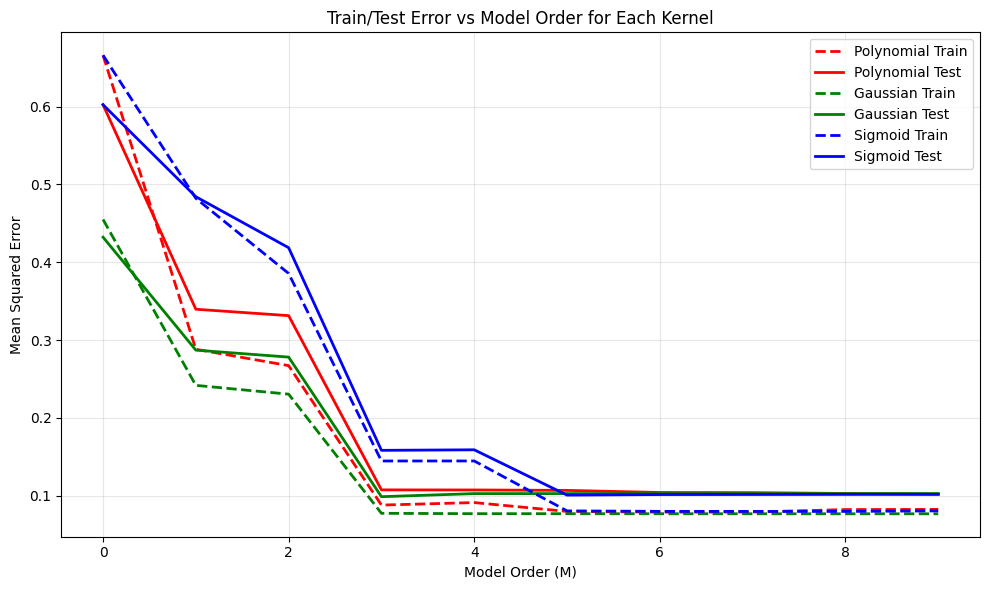

In [51]:
# Part 3(a) - Plot Error Analysis
print("\n=== Error Analysis for Sine Function ===")
PlotErrors(x_train, t_train, x_test, t_test, M_range,best_params_dict_sine)

### Train/Test Error vs Model Order (M) – Sine Function with Noise

From M = 0 to 5, training and test errors drop for all kernels.
This shows that increasing complexity helps the model learn the sine pattern more accurately.

#### **Gaussian Kernel**
- Performs best overall.
- Lowest training and test error across nearly all values of M.

#### **Polynomial Kernel**
- Performs well, especially at mid-range M.
- Errors flatten out around M = 5, showing it has reached its ideal order.
- Works well for smooth patterns like a sine wave.

#### **Sigmoid Kernel**
- Starts off worse, with higher test error at low M.
- Improves steadily and gets close to Gaussian and Polynomial by higher M.
- Needs more complexity to express the the function.

Hence the choice of kernel and model order should depend on the nature of the target function.


# 3(b)

Training set size: 50
Test set size: 50


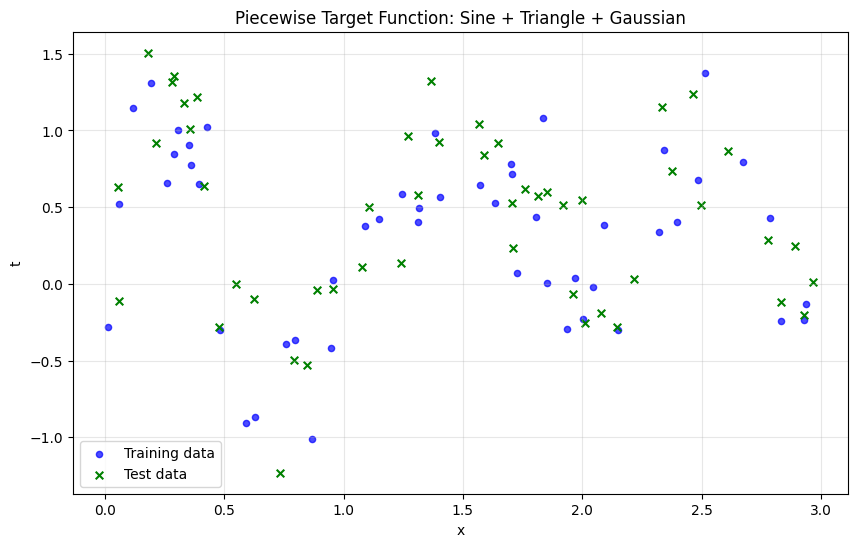

In [29]:
##############################################
# Generating data points for 3(b) and splitting
##############################################


np.random.seed(0)

# Generate 100 random points from uniform distribution on [0, 3]
x_b = np.sort(np.random.uniform(0, 3, 100))
noise_b = np.random.normal(0, np.sqrt(0.1), size=x_b.size)

# Initialize target values
t_b = np.zeros(x_b.size)

# Define piecewise function
# Sine wave on [0, 1]
range1 = (x_b >= 0) & (x_b <= 1)
t_b[range1] = np.sin(2 * np.pi * x_b[range1])


# Triangle on (1, 2]
range2 = (x_b > 1) & (x_b <= 2)
# Triangle wave: peak at x=1.5, height=1
t_b[range2] = 1 - 2 * np.abs(x_b[range2] - 1.5)

# Gaussian bump on (2, 3]
range3 = (x_b > 2) & (x_b <= 3)
t_b[range3] = np.exp(-((x_b[range3] - 2.5) ** 2) / (2 * 0.15**2))
t_b = t_b + noise_b
t_b = t_b.reshape(-1, 1)
x_b = x_b.reshape(-1, 1)

# Take even samples for training and odd samples for testing
xb_train = x_b[::2]
tb_train = t_b[::2]
xb_test = x_b[1::2]
tb_test = t_b[1::2]

print(f"Training set size: {len(xb_train)}")
print(f"Test set size: {len(xb_test)}")

# Visualize the piecewise function
plt.figure(figsize=(10, 6))
plt.scatter(xb_train, tb_train, label="Training data", color="blue", s=20, alpha=0.7)
plt.scatter(xb_test, tb_test, label="Test data", color="green", marker="x", s=30)
plt.xlabel("x")
plt.ylabel("t")
plt.title("Piecewise Target Function: Sine + Triangle + Gaussian")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [30]:
# Part 3(b) - Hyperparameter Tuning for Piecewise Function
# Tune hyperparameters for piecewise function data

best_params_dict_piecewise = tune_all_kernels(
    xb_train, tb_train, xb_test, tb_test, M_range
)

=== Hyperparameter Tuning ===

Model Order M = 0
Best λ for Polynomial Kernel = 0.00001 with Test Error = 0.3623
  Polynomial: λ = 0.00001, Test Error = 0.3623
Best λ for Polynomial Kernel = 0.00001 with Test Error = 0.3991
  Gaussian: λ = 0.00001, Test Error = 0.3991
Best λ for Polynomial Kernel = 0.00001 with Test Error = 0.3998
  Sigmoid: λ = 0.00001, Test Error = 0.3998

Model Order M = 1
Best λ for Polynomial Kernel = 0.00001 with Test Error = 0.3582
  Polynomial: λ = 0.00001, Test Error = 0.3582
Best λ for Polynomial Kernel = 0.00001 with Test Error = 0.3922
  Gaussian: λ = 0.00001, Test Error = 0.3922
Best λ for Polynomial Kernel = 0.00001 with Test Error = 0.3762
  Sigmoid: λ = 0.00001, Test Error = 0.3762

Model Order M = 2
Best λ for Polynomial Kernel = 0.00001 with Test Error = 0.3587
  Polynomial: λ = 0.00001, Test Error = 0.3587
Best λ for Polynomial Kernel = 0.00001 with Test Error = 0.2619
  Gaussian: λ = 0.00001, Test Error = 0.2619
Best λ for Polynomial Kernel = 0.0016


=== Plotting Predictions for Piecewise Function ===

Plotting for Model Order M = 0


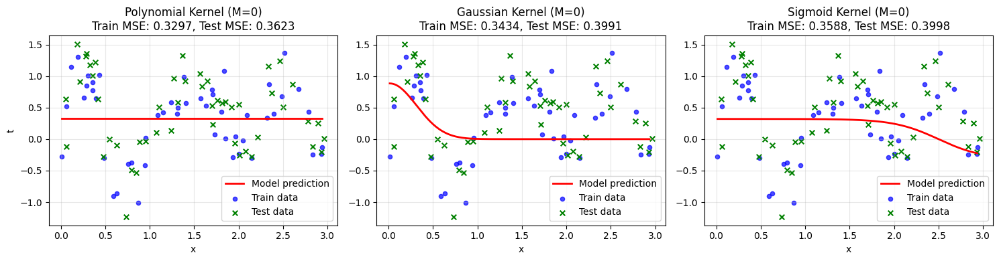


Plotting for Model Order M = 1


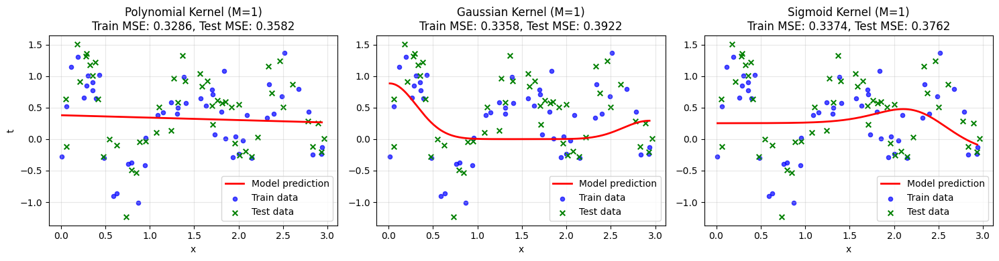


Plotting for Model Order M = 2


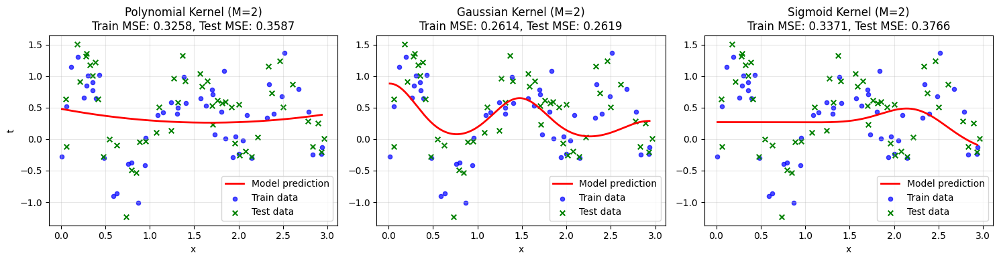


Plotting for Model Order M = 3


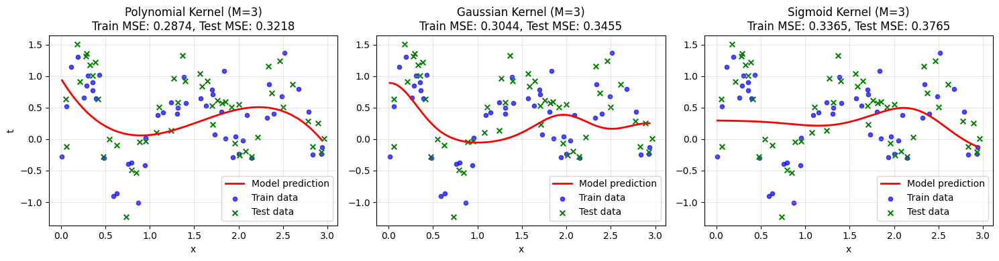


Plotting for Model Order M = 4


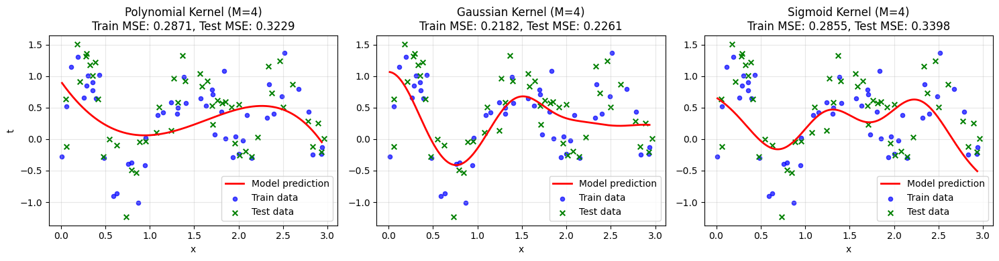


Plotting for Model Order M = 5


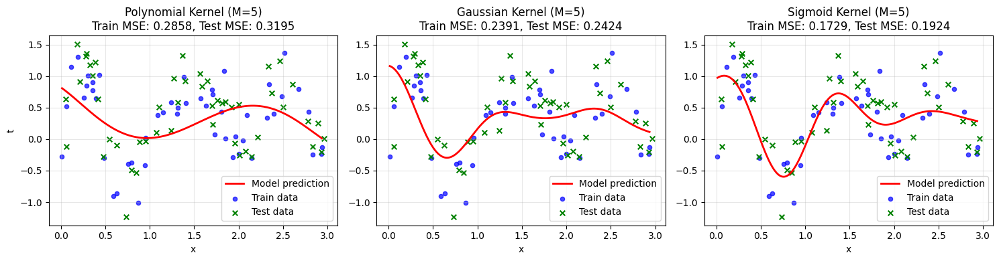


Plotting for Model Order M = 6


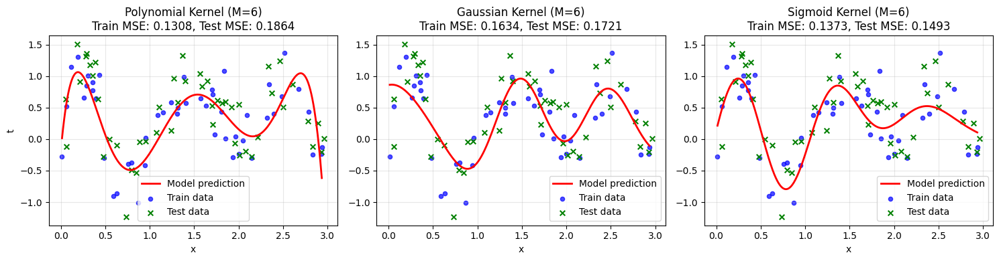


Plotting for Model Order M = 7


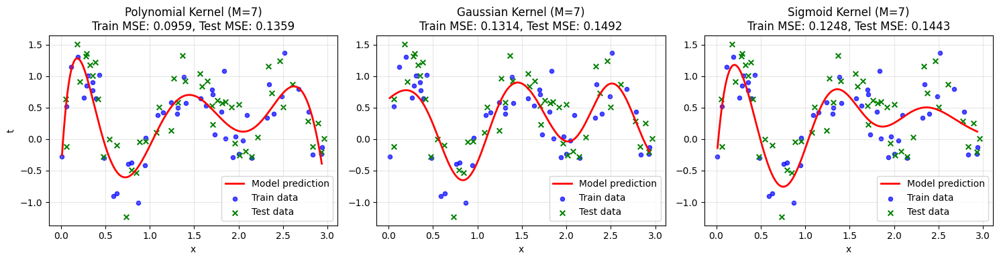


Plotting for Model Order M = 8


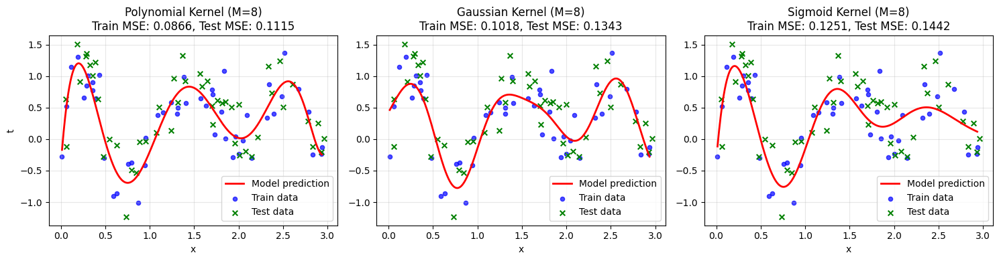


Plotting for Model Order M = 9


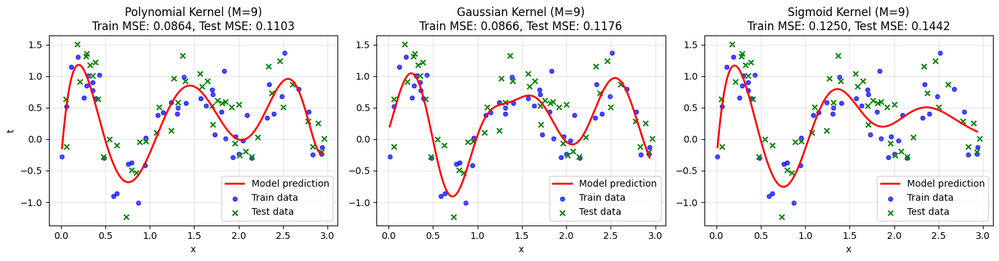

In [32]:
# Cell 10: Part 3(b) - Plot Predictions for Piecewise Function
print("\n=== Plotting Predictions for Piecewise Function ===")
M_range = list(range(10))

for M in M_range:
    print(f"\nPlotting for Model Order M = {M}")
    PlotPrediction(
        xb_train, tb_train, xb_test, tb_test, M, best_params_dict_piecewise[M]
    )

### Comparing Observations Across Two Different Target Functions

The model behavior changes significantly due to this more complex structure.

### Key Differences in Behavior

#### 1. **Higher Overall Errors**
- The mean squared errors are generally higher for all kernels, especially at lower M.
- This is because the new function has more small and abrupt changes, making it harder to approximate with fewer basis functions.

#### 2. **Polynomial Kernel**
- Polynomial kernels do okay at moderate M, but start to overfit and show wavy, unstable behavior earlier.
- Their global nature makes them poorly suited for sharp local features like the triangle peak or Gaussian bump.
- Runge phenomenon : When interpolating a smooth function over a large interval using high-degree polynomials with equally spaced points, the resulting polynomial may oscillate wildly near the endpoints, even though it fits the points exactly.

#### 3. **Gaussian Kernel**
- Gaussian kernels perform consistently well.
- They work best here because they are can adapt to small regions independently.
- Starts to overfit for M=8,9 as the difference between train and test errors increases

#### 4. **Sigmoid Kernel**
- As before, sigmoid kernels start off slow but improve with higher M.

### Conclusion

- The kind of target function you’re trying to learn really affects which kernel works best.

- If the function is smooth and changes gradually, simpler models like polynomials can work well.

- But if the function has sharp turns, bumps, or different patterns in different regions, you need something more flexible like Gaussian kernels that can adapt to local changes.

- Sigmoid kernels are also flexible, but they usually need a more complex model (higher M) to capture all the details properly.

This shows why testing on different kinds of functions is important when choosing the right kernel and model complexity.


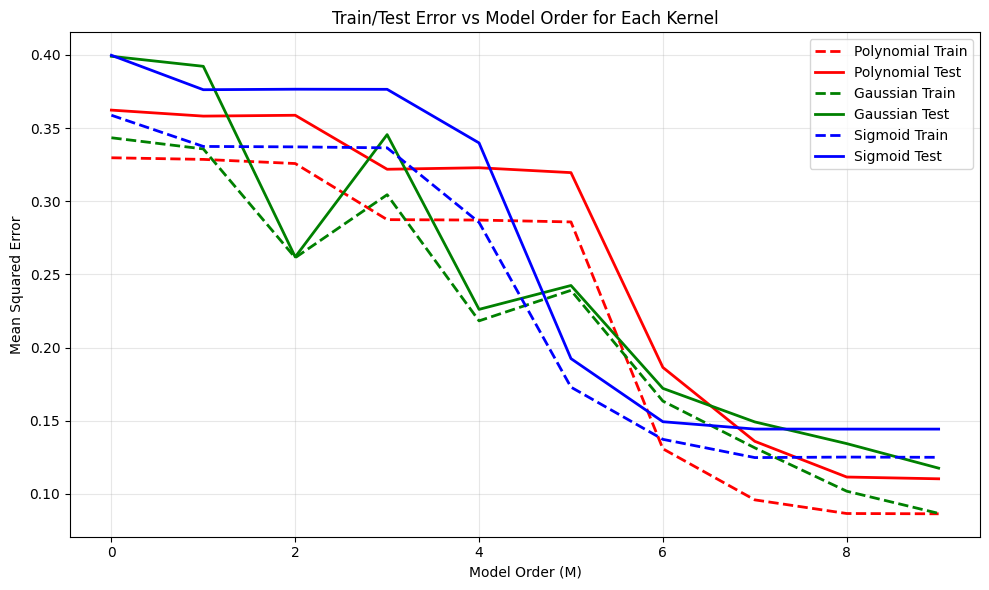

In [48]:
PlotErrors(xb_train, tb_train, xb_test, tb_test, M_range, best_params_dict_piecewise)

### Train/Test Error vs Model Order (M) – Piecewise Target Function

Train and test errors decrease steadily, meaning the models are learning the underlying pattern as complexity increases.

#### **Polynomial Kernel**
- Initially performs reasonably well.
- Initially we used fixed hyper parameters so we could change M_range however we wanted and that won't affect the plotting functions.
    - For higher orders like M = 30, both training and test errors suddenly increase and oscillate.
    - Runge phenomenon can be observed more clearly here.
    - This sharp increase was only visible after we extended the model order range from 10 to 20. Before that, the polynomial kernel appeared to perform similarly to the others.
- But after tuning the hyperparameters, we are passing the list containing best parameters for corresponding M values which restricts the range of M to the size of the list which is 10 so the further plot cannot be observed anymore.

### Conclusion

- **Gaussian kernels** are the most robust across varying complexity — they model local features without instability.
- **Polynomial kernels** may suddenly overfit at higher orders, so always test a wide range of M.
- **Sigmoid kernels** offer smooth performance and are less risky than polynomials for irregular data.


# PART 4

# 4(a)

In [33]:
def sigmoid(a):
    return 1 / (1 + np.exp(-a))

In [34]:
def ErrorPred(
    w_est, X_train, Y_train, X_test, Y_test, kernelType
):  # (estimated weight, training data, training targets, testing data, testing targets, type of the kernel )
    """
    Compute training and testing errors using kernel regression
    Args:
        w_est: estimated weights
        X_train: training data
        Y_train: training targets
        X_test: test data
        Y_test: test targets
        kernelType: type of kernel
    Returns:
        TrainError: training MSE
        TestError: testing MSE
    """
    M = len(w_est) - 1
    # Ensure inputs are in correct shape
    X_train = np.asarray(X_train).reshape(-1, 1)
    X_test = np.asarray(X_test).reshape(-1, 1)
    Y_train = np.asarray(Y_train).reshape(-1, 1)
    Y_test = np.asarray(Y_test).reshape(-1, 1)

    # Get kernel matrices
    Phi_train = get_kernel(X_train, M, kernelType)
    Phi_test = get_kernel(X_test, M, kernelType)

    # Make predictions
    Y_train_pred = Phi_train @ w_est
    Y_test_pred = Phi_test @ w_est

    # Compute MSE
    TrainError = mean_squared_error(Y_train, Y_train_pred)
    TestError = mean_squared_error(Y_test, Y_test_pred)

    return TrainError, TestError

In [35]:
def Pred(
    w_est, X_train, X_test, kernelType
):  # (estimated weights, training data, testing data, type of the kernel )
    """
    Compute predictions for training and testing data
    Args:
        w_est: estimated weights
        X_train: training data
        X_test: test data
        kernelType: type of kernel
    Returns:
        Y_tr_pred: training predictions
        Y_te_pred: testing predictions
    """
    M = len(w_est) - 1
    # Ensure inputs are in correct shape
    X_train = np.asarray(X_train).reshape(-1, 1)
    X_test = np.asarray(X_test).reshape(-1, 1)

    # Get kernel matrices
    Phi_train = get_kernel(X_train, M, kernelType)
    Phi_test = get_kernel(X_test, M, kernelType)

    # Compute predictions
    Y_tr_pred = Phi_train @ w_est
    Y_te_pred = Phi_test @ w_est

    return Y_tr_pred, Y_te_pred


def Pred_Error(
    w_est, X_train, Y_train, X_test, Y_test, kernelType
):  # (estimated weights, training data, training targets, testing data, testing targets, type of the kernel )
    """
    Compute prediction errors for training and testing data
    Args:
        w_est: estimated weights
        X_train: training data
        Y_train: training targets
        X_test: test data
        Y_test: test targets
        kernelType: type of kernel
    Returns:
        Y_tr_error: training MSE
        Y_te_error: testing MSE
    """
    # Get predictions
    Y_tr_pred, Y_te_pred = Pred(w_est, X_train, X_test, kernelType)

    # Compute MSE
    Y_tr_error = mean_squared_error(Y_train, Y_tr_pred)
    Y_te_error = mean_squared_error(Y_test, Y_te_pred)

    return Y_tr_error, Y_te_error

In [36]:
##################################################
# Repeat 3(a) and 3(b) using stochastic gradient descent for weight update.
##################################################

def generate_data_3a(num_points=100, noise_std=0.1):
    """Generates data for Part 3(a): t_n = sin(2*pi*x_n) + e_n"""
    X = np.random.rand(num_points, 1)
    e = np.random.normal(0, noise_std, (num_points, 1))
    T = np.sin(2 * np.pi * X) + e
    return X.flatten(), T.flatten()


def generate_data_3b(num_points_total=100, noise_std=0.1):
    """Generates data for Part 3(b): piecewise function"""
    num_points_per_segment = num_points_total // 3
    X_segments, T_segments = [], []

    X1 = np.random.uniform(0, 1, num_points_per_segment)
    T1 = np.sin(2 * np.pi * X1)
    X_segments.append(X1)
    T_segments.append(T1)

    X2 = np.random.uniform(1, 2, num_points_per_segment)
    T2 = 2 * (0.5 - np.abs(X2 - 1.5))
    X_segments.append(X2)
    T_segments.append(T2)

    num_points_s3 = num_points_total - 2 * num_points_per_segment
    X3 = np.random.uniform(2, 3, num_points_s3)
    T3 = np.exp(-((X3 - 2.5) ** 2) / (2 * 0.1**2))
    X_segments.append(X3)
    T_segments.append(T3)

    X = np.concatenate(X_segments)
    T_true = np.concatenate(T_segments)
    e = np.random.normal(0, noise_std, X.shape[0])
    T = T_true + e

    sorted_indices = np.argsort(X)
    X = X[sorted_indices]
    T = T[sorted_indices]

    return X.flatten(), T.flatten()

In [37]:
def detect_convergence(mse_history, tolerance=1e-5, window=10):
    """
    Detect convergence based on MSE change over a window
    Returns the epoch where convergence is detected, or -1 if not converged
    """
    if len(mse_history) < window:
        return -1

    for i in range(window, len(mse_history)):
        recent_window = mse_history[i - window : i]
        if max(recent_window) - min(recent_window) < tolerance:
            return i - window
    return -1

### Convergence detecting function

- It looks at the mse_history (a list of MSE values from previous epochs/iterations).
- It considers a window of the most recent MSE values.
- f the difference between the maximum and minimum MSE within this window is less than a given tolerance, it assumes the model's performance has plateaued and returns the epoch number where convergence was detected.
- If the condition is not met or if there isn't enough history yet, it returns -1 to indicate that training should continue.

In [38]:
def custom_shuffle(X, Y, random_state=None):
    """
    Custom shuffle function to shuffle X and Y arrays together
    Args:
        X: input array
        Y: target array
        random_state: random seed for reproducibility
    Returns:
        X_shuffled, Y_shuffled: shuffled arrays
    """
    if random_state is not None:
        np.random.seed(random_state)

    # Get the number of samples
    n_samples = len(X)

    # Generate random indices
    indices = np.random.permutation(n_samples)

    # Shuffle both arrays using the same indices
    X_shuffled = X[indices]
    Y_shuffled = Y[indices]

    return X_shuffled, Y_shuffled

In [39]:
def Training(
    X_train, Y_train, X_test, Y_test, kernelType, M, Epochs, BatchSize, stepSize
):
    """
    Train a kernel regression model using stochastic gradient descent
    Args:
        X_train: training data
        Y_train: training targets
        X_test: test data
        Y_test: test targets
        kernelType: type of kernel
        M: order of the model
        Epochs: number of epochs
        BatchSize: batch size
        stepSize: learning rate
    Returns:
        weights: trained weights
    """
    # Initialize weights
    np.random.seed(42)
    weights = np.random.randn(M + 1) * 0.01

    # Initialize error storage
    train_errors = []
    test_errors = []

    # Ensure inputs are in correct shape
    X_train = np.asarray(X_train).reshape(-1, 1)
    Y_train = np.asarray(Y_train).reshape(-1, 1)
    X_test = np.asarray(X_test).reshape(-1, 1)
    Y_test = np.asarray(Y_test).reshape(-1, 1)

    N_train = len(X_train)

    for epoch in range(Epochs):
        # Shuffle data
        X_train_shuffled, Y_train_shuffled = custom_shuffle(
            X_train, Y_train, random_state=epoch
        )

        # Compute current errors
        tr_err, te_err = ErrorPred(
            weights, X_train, Y_train, X_test, Y_test, kernelType
        )
        train_errors.append(tr_err)
        test_errors.append(te_err)

        # Mini-batch processing
        num_batches = N_train // BatchSize
        if N_train % BatchSize != 0:
            num_batches += 1

        for batch in range(num_batches):
            start_idx = batch * BatchSize
            end_idx = min((batch + 1) * BatchSize, N_train)
            X_batch = X_train_shuffled[start_idx:end_idx]
            Y_batch = Y_train_shuffled[start_idx:end_idx]

            if len(X_batch) == 0:
                continue

            # Initialize gradient
            batch_gradient_sum = np.zeros_like(weights)

            # Iterate through batch
            for n in range(len(X_batch)):
                x_n = X_batch[n]
                y_n = Y_batch[n]

                # Obtain kernel representation
                x_n_reshaped = np.array([x_n]).reshape(-1, 1)
                phi_n = get_kernel(x_n_reshaped, M, kernelType)[0]

                # Compute prediction and gradient
                y_pred_n = phi_n @ weights
                grad_n = 2 * (y_pred_n - y_n) * phi_n
                batch_gradient_sum += grad_n

            # Compute mean gradient and update weights
            mean_batch_gradient = batch_gradient_sum / len(X_batch)
            weights -= stepSize * mean_batch_gradient

    # Plot training and testing errors
    plt.figure(figsize=(10, 6))
    plt.plot(range(len(train_errors)), train_errors, "b-", label="Train MSE")
    plt.plot(range(len(test_errors)), test_errors, "r-", label="Test MSE")
    plt.xlabel("Epochs")
    plt.ylabel("MSE")
    plt.title(f"Training and Testing Errors - {kernelType} Kernel")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

    return weights

In [40]:
def sgd_training_with_analysis(
    X_train,
    Y_train,
    X_test,
    Y_test,
    kernelType,
    M_order,
    step_size,
    batch_size,
    max_epochs=500,
    convergence_tol=1e-5,
):
    """
    SGD training with convergence detection and detailed analysis
    """
    N_train = len(X_train)

    # Initialize weights
    np.random.seed(42)
    weights = np.random.randn(M_order + 1) * 0.01

    train_errors = []
    test_errors = []

    for epoch in range(max_epochs):
        # Shuffle data
        X_train_shuffled, Y_train_shuffled = custom_shuffle(
            X_train, Y_train, random_state=epoch
        )

        # Mini-batch processing
        num_batches = N_train // batch_size
        if N_train % batch_size != 0:
            num_batches += 1

        for i in range(num_batches):
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, N_train)
            X_batch = X_train_shuffled[start_idx:end_idx]
            Y_batch = Y_train_shuffled[start_idx:end_idx]

            if len(X_batch) == 0:
                continue

            # Compute batch gradient
            batch_gradient_sum = np.zeros_like(weights)

            for n in range(len(X_batch)):
                x_n = X_batch[n]
                y_n = Y_batch[n]

                # Get kernel features
                x_n_reshaped = np.array([x_n]).reshape(-1, 1)
                phi_n = get_kernel(x_n_reshaped, M_order, kernelType)[0]

                # Compute gradient
                y_pred_n = phi_n @ weights
                grad_n = 2 * (y_pred_n - y_n) * phi_n
                batch_gradient_sum += grad_n

            # Update weights
            mean_batch_gradient = batch_gradient_sum / len(X_batch)
            weights -= step_size * mean_batch_gradient

        # Compute errors
        train_error, test_error = ErrorPred(
            weights, X_train, Y_train, X_test, Y_test, kernelType
        )
        train_errors.append(train_error)
        test_errors.append(test_error)

        # Check for convergence
        if epoch >= 20:
            convergence_epoch = detect_convergence(
                test_errors, convergence_tol, window=10
            )
            if convergence_epoch != -1:
                return weights, train_errors, test_errors, epoch + 1

    return weights, train_errors, test_errors, max_epochs

### sgd_training_with_analysis Function

1. **Initialization**: Randomly initializes model weights.

2. **Training Loop**: Runs for multiple epochs, shuffling data each time and processing it in mini-batches. For each batch, it computes MSE gradients and updates weights using averaged gradients.

3. **Error Tracking**: After each mini-batch update, it computes and stores full training and test MSE, which is computationally expensive but useful for analysis.

4. **Output**: Returns the final model weights, training/testing error history, and the epoch of convergence.


In [41]:
##################################################
# Repeat 3(a) and 3(b) using stochastic gradient descent for weight update.
##################################################
def custom_train_test_split(X, y, test_size=0.2, random_state=None):

    if random_state is not None:
        np.random.seed(random_state)

    # Get number of samples
    n_samples = len(X)

    # Calculate test size
    test_samples = int(n_samples * test_size)

    # Generate random indices
    indices = np.random.permutation(n_samples)

    # Split indices
    test_indices = indices[:test_samples]
    train_indices = indices[test_samples:]

    # Split the data
    X_train = X[train_indices]
    X_test = X[test_indices]
    y_train = y[train_indices]
    y_test = y[test_indices]

    return X_train, X_test, y_train, y_test


X_3a, T_3a = generate_data_3a(num_points=100)
X_train_3a, X_test_3a, Y_train_3a, Y_test_3a = custom_train_test_split(
    X_3a, T_3a, test_size=0.5, random_state=42
)

X_3b, T_3b = generate_data_3b(num_points_total=150)
X_train_3b, X_test_3b, Y_train_3b, Y_test_3b = custom_train_test_split(
    X_3b, T_3b, test_size=0.5, random_state=42
)

# Kernel-specific step sizes
kernel_step_sizes = {
    "polynomial": [0.0001, 0.00001, 0.000001],
    "gaussian": [0.1, 0.01, 0.001, 0.0001, 0.00001],
    "sigmoid": [0.1, 0.01, 0.001, 0.0001],
}

# Other parameters
kernels = ["polynomial", "gaussian", "sigmoid"]
batch_sizes = [1, 5, 10, 25, 50]
M_order = 5
max_epochs = 200

datasets = {
    "3a": (X_train_3a, Y_train_3a, X_test_3a, Y_test_3a),
    "3b": (X_train_3b, Y_train_3b, X_test_3b, Y_test_3b),
}

### Step Size for different Kernels

- The step size list is different for each kernel type because certain step size causes overflow. Therefore, the most suitable and feasible ones are chosen for observation after testing for various step sizes.

# 4(b)

Valid batch sizes for dataset 3a: [1, 5, 10, 25, 50]
Valid batch sizes for dataset 3b: [1, 5, 10, 25, 50, 75]

Analyzing dataset 3a

Kernel: polynomial
  Step size: 0.0001
  Step size: 1e-05
  Step size: 1e-06


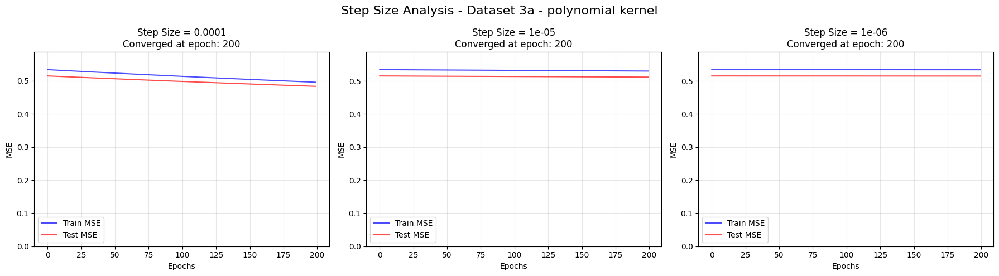

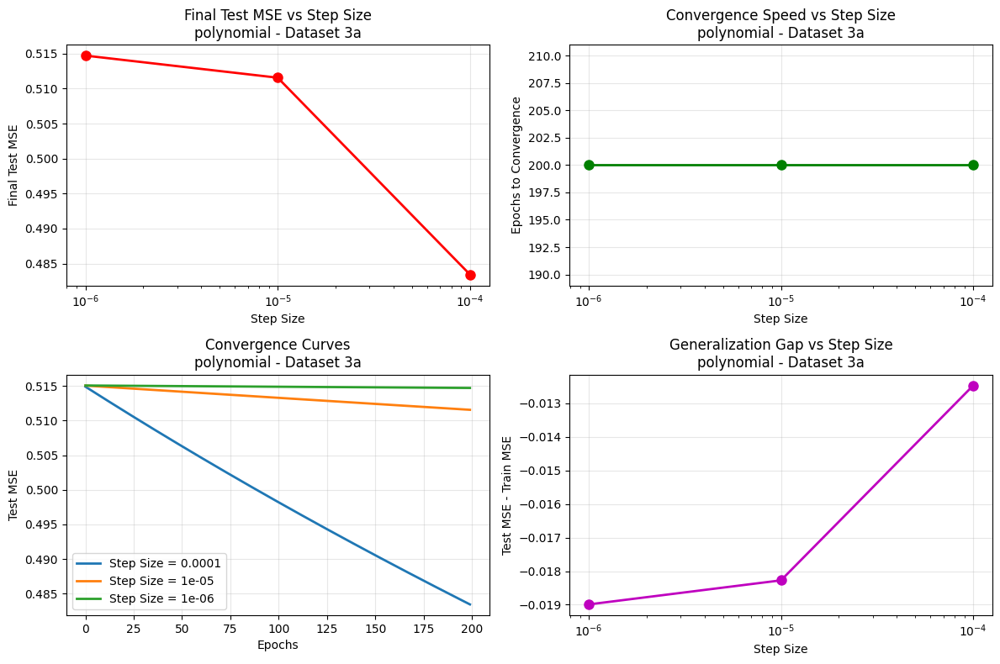


Kernel: gaussian
  Step size: 0.1
  Step size: 0.01
  Step size: 0.001
  Step size: 0.0001
  Step size: 1e-05


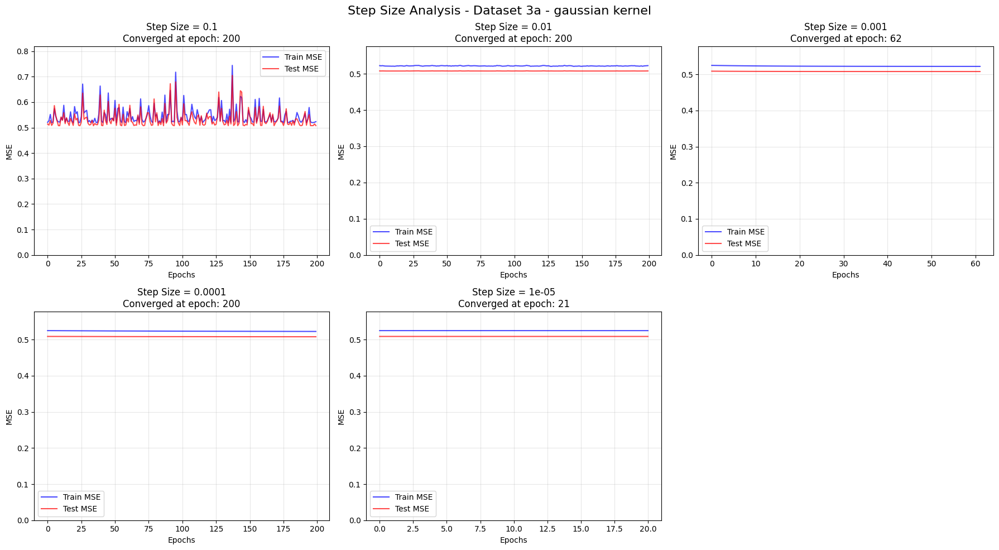

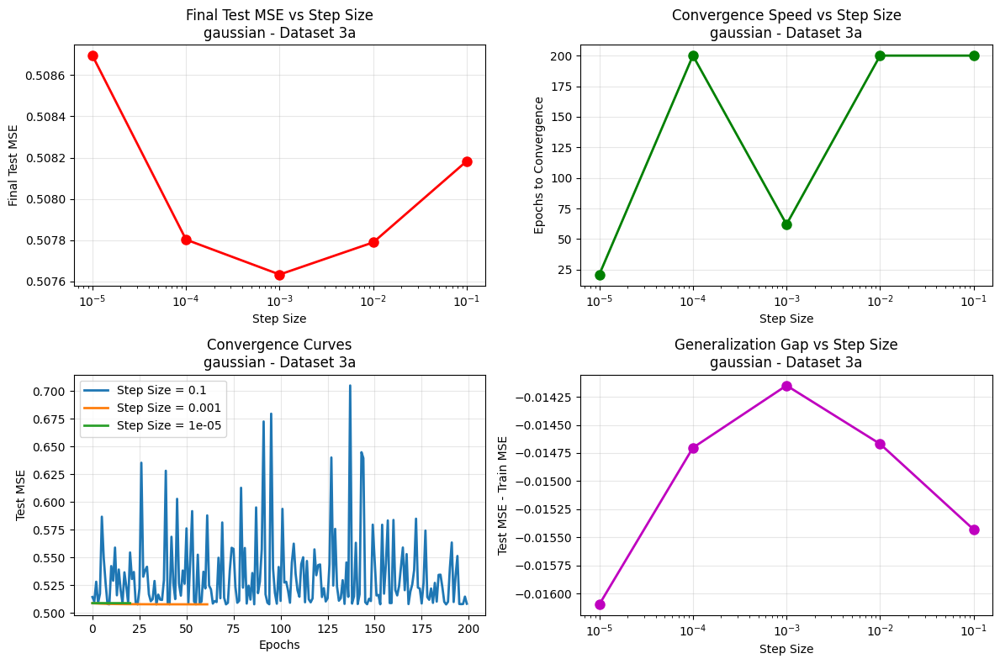


Kernel: sigmoid
  Step size: 0.1
  Step size: 0.01
  Step size: 0.001
  Step size: 0.0001


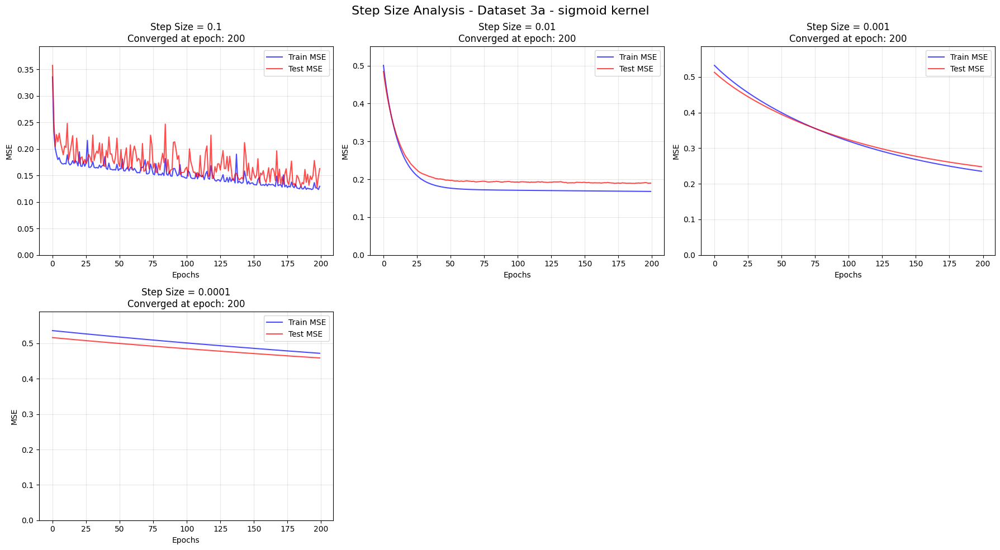

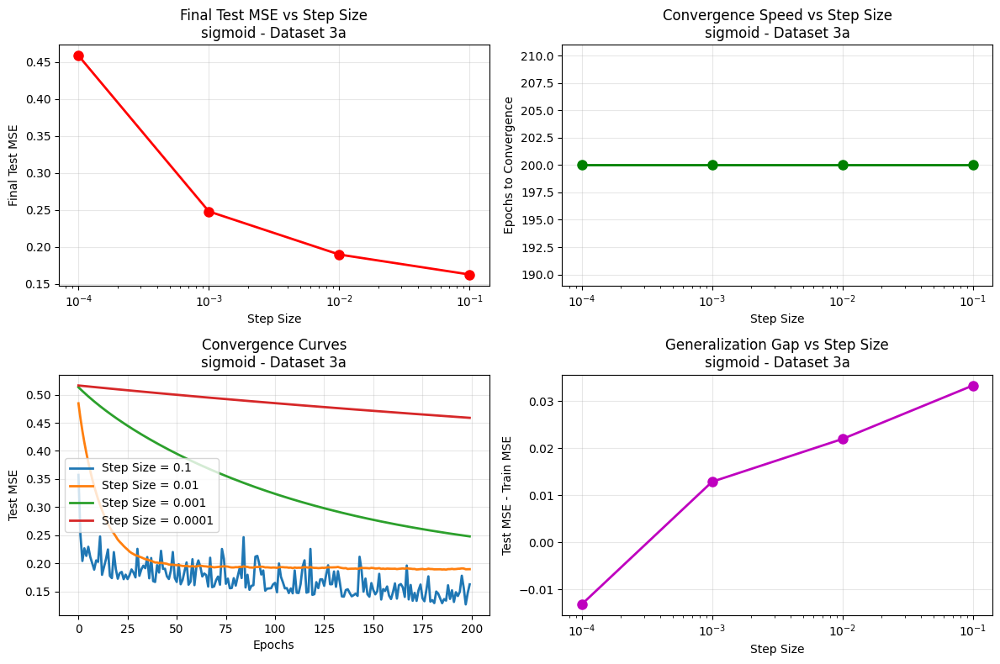


Analyzing dataset 3b

Kernel: polynomial
  Step size: 0.0001
  Step size: 1e-05
  Step size: 1e-06


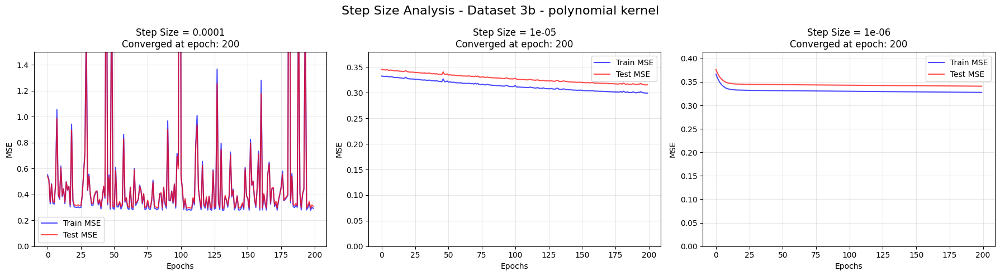

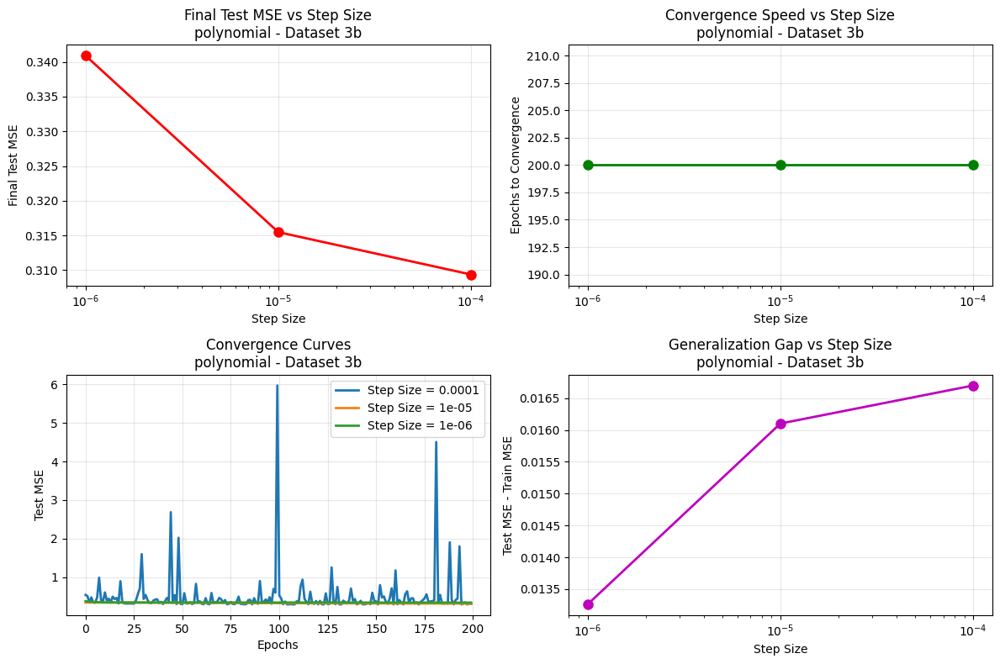


Kernel: gaussian
  Step size: 0.1
  Step size: 0.01
  Step size: 0.001
  Step size: 0.0001
  Step size: 1e-05


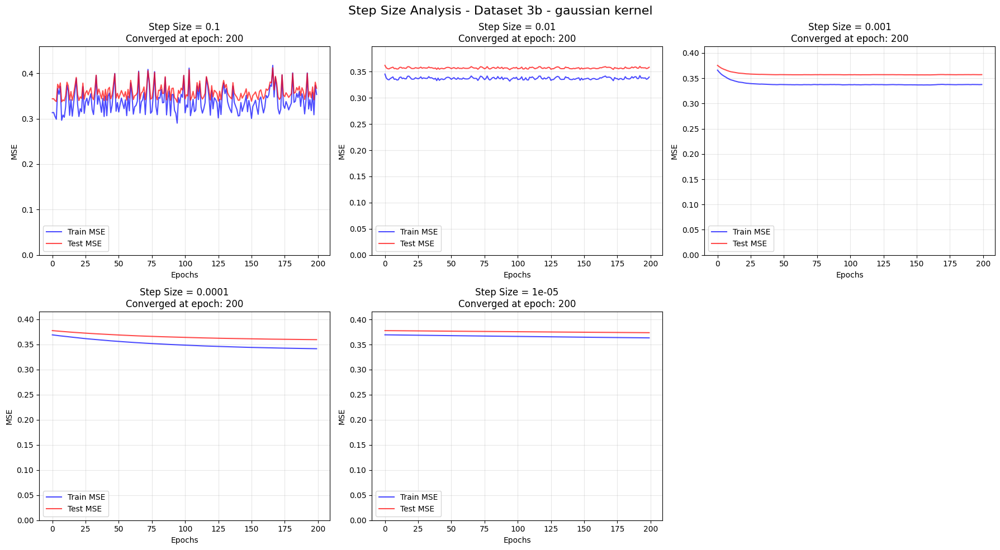

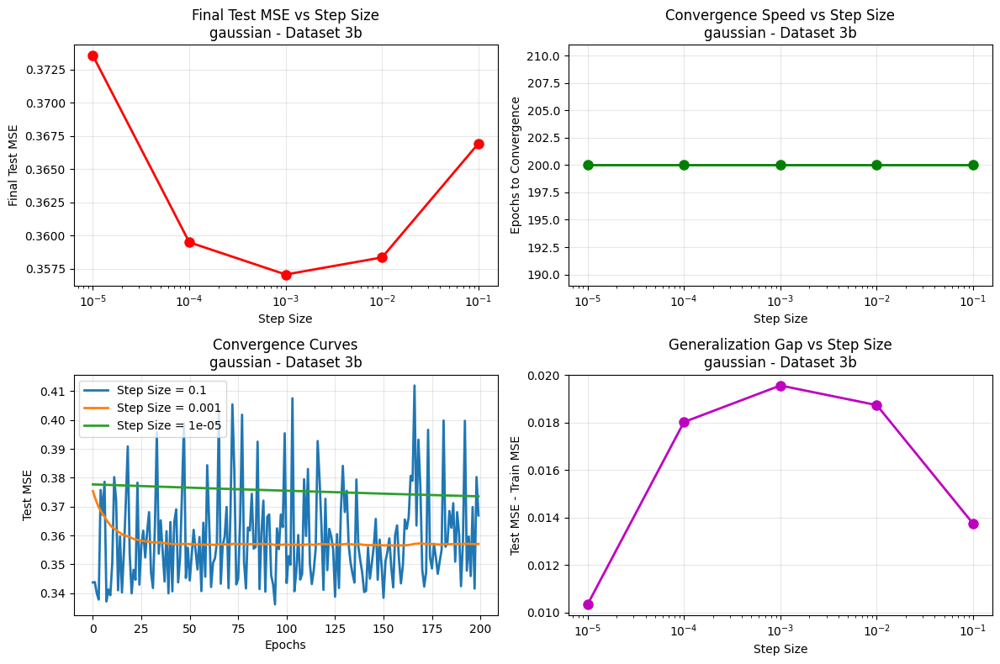


Kernel: sigmoid
  Step size: 0.1
  Step size: 0.01
  Step size: 0.001
  Step size: 0.0001


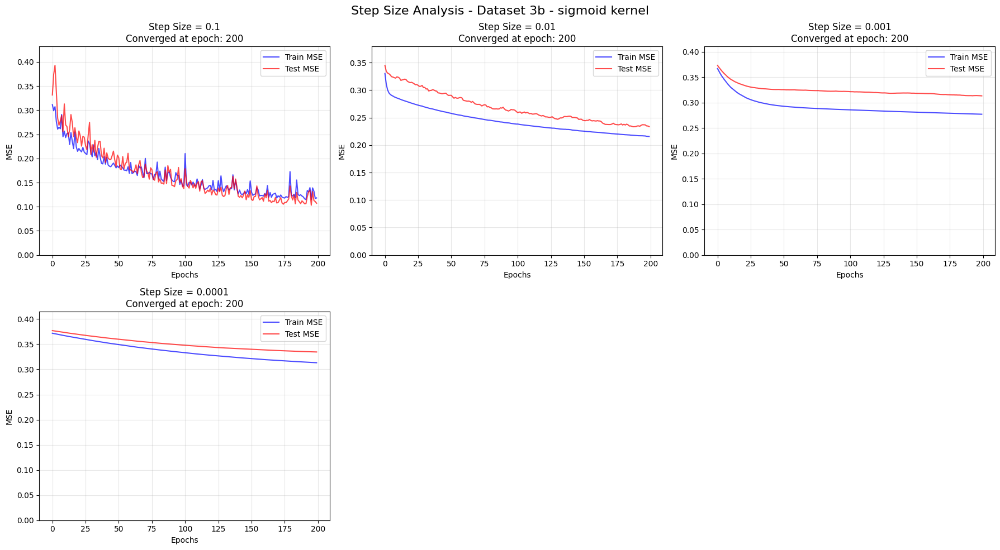

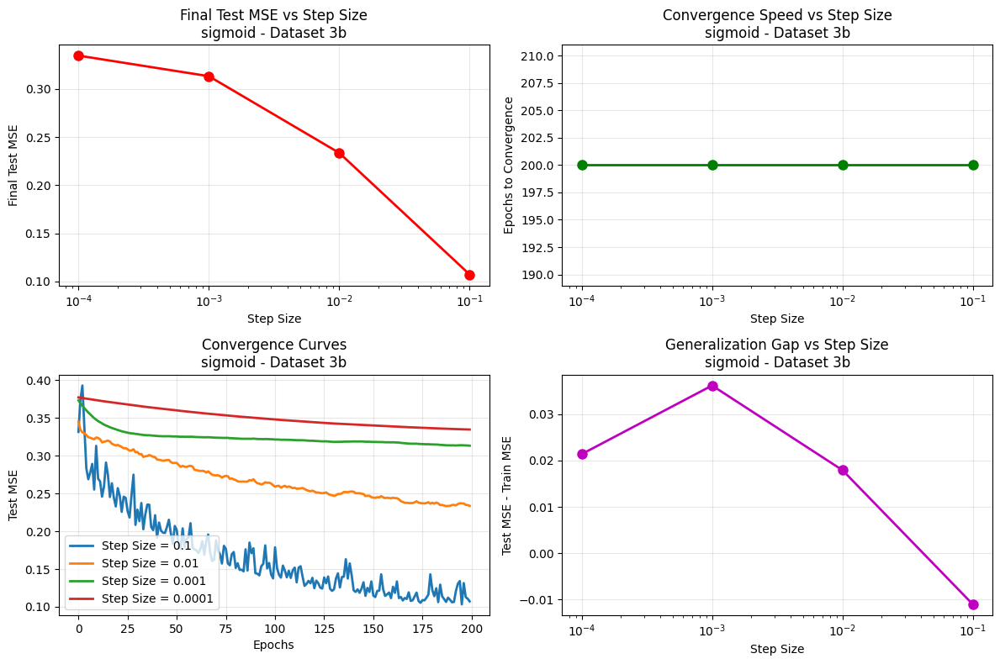


SUMMARY: Best Step Sizes for Each Kernel and Dataset

Dataset 3a:
  polynomial  : Best step size = 0.000100, Test MSE = 0.483434, Converged at epoch 200
  gaussian    : Best step size = 0.001000, Test MSE = 0.507634, Converged at epoch 62
  sigmoid     : Best step size = 0.100000, Test MSE = 0.162779, Converged at epoch 200

Dataset 3b:
  polynomial  : Best step size = 0.000100, Test MSE = 0.309367, Converged at epoch 200
  gaussian    : Best step size = 0.001000, Test MSE = 0.357074, Converged at epoch 200
  sigmoid     : Best step size = 0.100000, Test MSE = 0.107225, Converged at epoch 200


In [42]:
########################################
# Study the effect of stepSize on the convergence of weights ( plot required results )
########################################

valid_batch_sizes = {}
for dataset_name, (X_train, Y_train, X_test, Y_test) in datasets.items():
    valid_bs = [bs for bs in batch_sizes if bs <= len(X_train)]
    if len(X_train) not in valid_bs:
        valid_bs.append(len(X_train))
    valid_batch_sizes[dataset_name] = sorted(valid_bs)

print(f"Valid batch sizes for dataset 3a: {valid_batch_sizes['3a']}")
print(f"Valid batch sizes for dataset 3b: {valid_batch_sizes['3b']}")

step_size_results = {}

for dataset_name, (X_train, Y_train, X_test, Y_test) in datasets.items():
    print(f"\nAnalyzing dataset {dataset_name}")
    step_size_results[dataset_name] = {}

    for kernel in kernels:
        print(f"\nKernel: {kernel}")
        step_size_results[dataset_name][kernel] = {}

        current_step_sizes = kernel_step_sizes[kernel]
        num_step_sizes = len(current_step_sizes)
        cols = min(3, num_step_sizes)
        rows = (num_step_sizes + cols - 1) // cols

        fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
        fig.suptitle(
            f"Step Size Analysis - Dataset {dataset_name} - {kernel} kernel",
            fontsize=16,
        )

        if num_step_sizes == 1:
            axes = [axes]
        elif rows == 1:
            axes = (
                axes if isinstance(axes, list) or hasattr(axes, "__len__") else [axes]
            )
        else:
            axes = axes.flatten()

        for idx, step_size in enumerate(current_step_sizes):
            print(f"  Step size: {step_size}")
            batch_size = min(10, len(X_train))

            weights, train_errors, test_errors, epochs_to_converge = (
                sgd_training_with_analysis(
                    X_train,
                    Y_train,
                    X_test,
                    Y_test,
                    kernel,
                    M_order,
                    step_size,
                    batch_size,
                    max_epochs,
                )
            )
            step_size_results[dataset_name][kernel][step_size] = {
                "train_errors": train_errors,
                "test_errors": test_errors,
                "epochs_to_converge": epochs_to_converge,
                "final_train_error": train_errors[-1],
                "final_test_error": test_errors[-1],
            }

            if idx < len(axes):
                ax = axes[idx]
                epochs_range = range(len(test_errors))
                ax.plot(epochs_range, train_errors, "b-", alpha=0.7, label="Train MSE")
                ax.plot(epochs_range, test_errors, "r-", alpha=0.7, label="Test MSE")
                ax.set_title(
                    f"Step Size = {step_size}\nConverged at epoch: {epochs_to_converge}"
                )
                ax.set_xlabel("Epochs")
                ax.set_ylabel("MSE")
                ax.legend()
                ax.grid(True, alpha=0.3)
                ax.set_ylim(0, min(1.5, max(max(test_errors), max(train_errors)) * 1.1))

        for idx in range(len(current_step_sizes), len(axes)):
            if idx < len(axes):
                axes[idx].remove()

        plt.tight_layout()
        plt.show()

        # Summary plot
        plt.figure(figsize=(12, 8))

        plt.subplot(2, 2, 1)
        final_test_errors = [
            step_size_results[dataset_name][kernel][ss]["final_test_error"]
            for ss in current_step_sizes
        ]
        plt.plot(
            current_step_sizes, final_test_errors, "ro-", linewidth=2, markersize=8
        )
        plt.xlabel("Step Size")
        plt.ylabel("Final Test MSE")
        plt.title(f"Final Test MSE vs Step Size\n{kernel} - Dataset {dataset_name}")
        plt.grid(True, alpha=0.3)
        plt.xscale("log")

        plt.subplot(2, 2, 2)
        convergence_epochs = [
            step_size_results[dataset_name][kernel][ss]["epochs_to_converge"]
            for ss in current_step_sizes
        ]
        plt.plot(
            current_step_sizes, convergence_epochs, "go-", linewidth=2, markersize=8
        )
        plt.xlabel("Step Size")
        plt.ylabel("Epochs to Convergence")
        plt.title(f"Convergence Speed vs Step Size\n{kernel} - Dataset {dataset_name}")
        plt.grid(True, alpha=0.3)
        plt.xscale("log")

        plt.subplot(2, 2, 3)
        step_sizes_to_show = (
            current_step_sizes[::2]
            if len(current_step_sizes) > 4
            else current_step_sizes
        )
        for ss in step_sizes_to_show:
            test_errors = step_size_results[dataset_name][kernel][ss]["test_errors"]
            plt.plot(
                range(len(test_errors)),
                test_errors,
                label=f"Step Size = {ss}",
                linewidth=2,
            )
        plt.xlabel("Epochs")
        plt.ylabel("Test MSE")
        plt.title(f"Convergence Curves\n{kernel} - Dataset {dataset_name}")
        plt.legend()
        plt.grid(True, alpha=0.3)

        plt.subplot(2, 2, 4)
        train_test_diff = [
            step_size_results[dataset_name][kernel][ss]["final_test_error"]
            - step_size_results[dataset_name][kernel][ss]["final_train_error"]
            for ss in current_step_sizes
        ]
        plt.plot(current_step_sizes, train_test_diff, "mo-", linewidth=2, markersize=8)
        plt.xlabel("Step Size")
        plt.ylabel("Test MSE - Train MSE")
        plt.title(f"Generalization Gap vs Step Size\n{kernel} - Dataset {dataset_name}")
        plt.grid(True, alpha=0.3)
        plt.xscale("log")

        plt.tight_layout()
        plt.show()

# Summary of best step sizes
print("\n" + "=" * 60)
print("SUMMARY: Best Step Sizes for Each Kernel and Dataset")
print("=" * 60)

for dataset_name in datasets.keys():
    print(f"\nDataset {dataset_name}:")
    for kernel in kernels:
        current_step_sizes = kernel_step_sizes[kernel]
        best_step_size = min(
            current_step_sizes,
            key=lambda ss: step_size_results[dataset_name][kernel][ss][
                "final_test_error"
            ],
        )
        best_test_error = step_size_results[dataset_name][kernel][best_step_size][
            "final_test_error"
        ]
        convergence_epochs = step_size_results[dataset_name][kernel][best_step_size][
            "epochs_to_converge"
        ]

        print(
            f"  {kernel:12s}: Best step size = {best_step_size:8.6f}, "
            f"Test MSE = {best_test_error:.6f}, Converged at epoch {convergence_epochs}"
        )

### Mini-Batch Size Analysis Summary

1. It prints best step sizes from previous experiments. Uses a fixed or pre-determined optimal `step_size` (e.g., `0.00001`) for all batch size trials.

2. **Batch Size Testing**: Iterates over each dataset and kernel, testing various `batch_size` values (e.g., [1, 5, 10, 25, 50, ...]) to simulate different gradient descent modes — from pure SGD (`batch_size=1`) to full-batch.

3. **Plot Generation**:
   - **Convergence Plots**: Learning curves for each batch size.
   - **Summary Plots**: Visual summaries of test MSE, convergence epochs, generalization gap, total iterations, and computational efficiency.

4. This helps us understand how mini-batch size affects model performance, convergence speed, and generalization.



COMPREHENSIVE BATCH SIZE ANALYSIS

Analyzing dataset 3a

Kernel: polynomial
  Batch size: 1
  Batch size: 5
  Batch size: 10
  Batch size: 25
  Batch size: 50


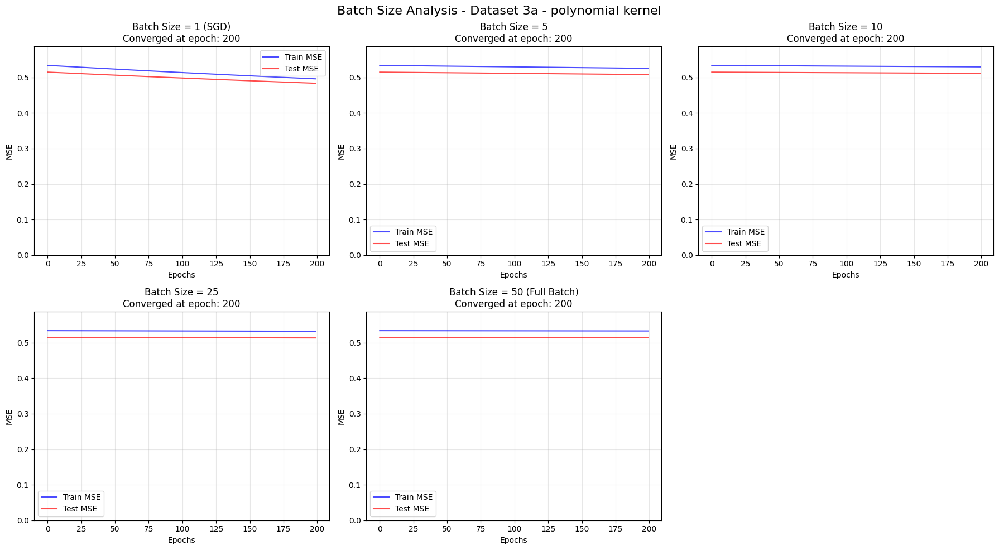

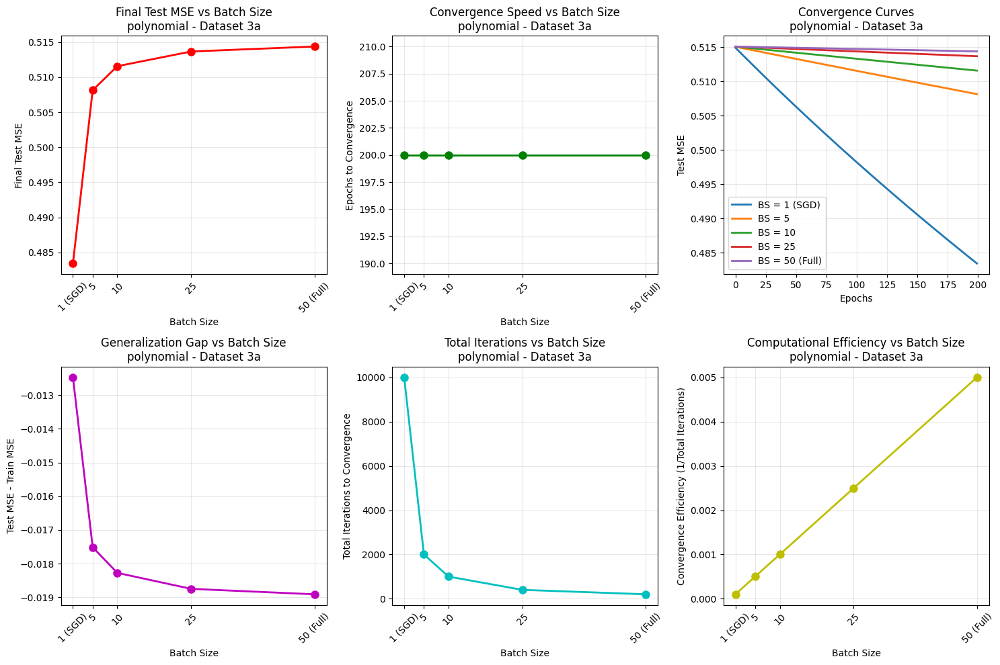


Kernel: gaussian
  Batch size: 1
  Batch size: 5
  Batch size: 10
  Batch size: 25
  Batch size: 50


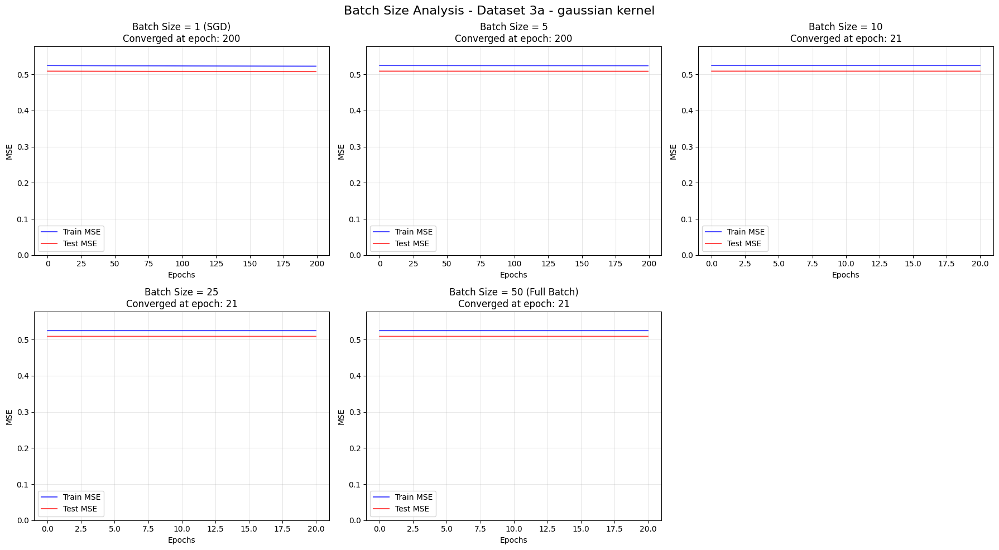

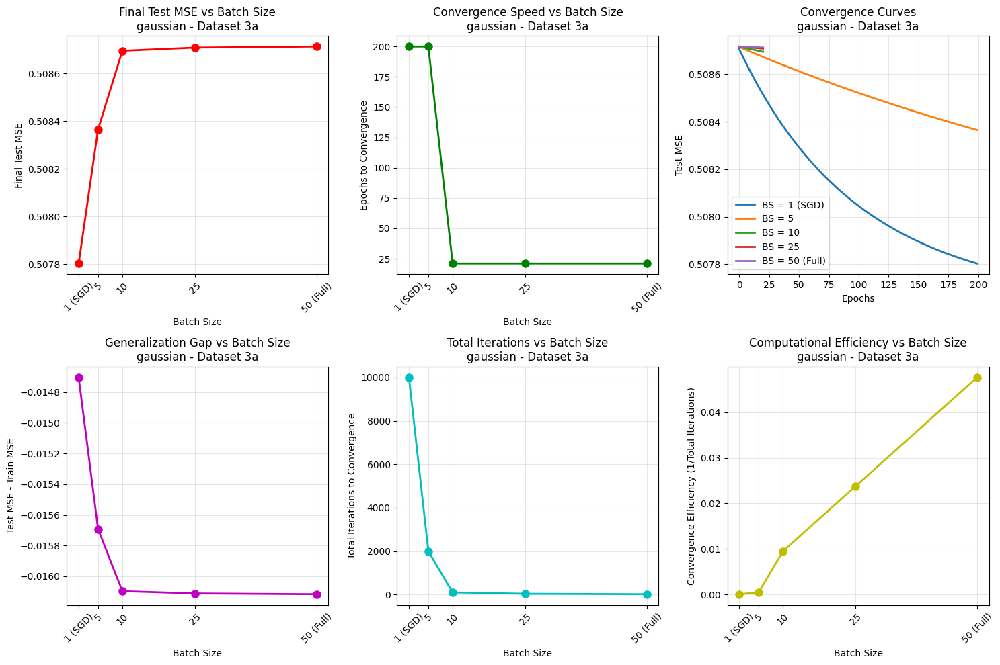


Kernel: sigmoid
  Batch size: 1
  Batch size: 5
  Batch size: 10
  Batch size: 25
  Batch size: 50


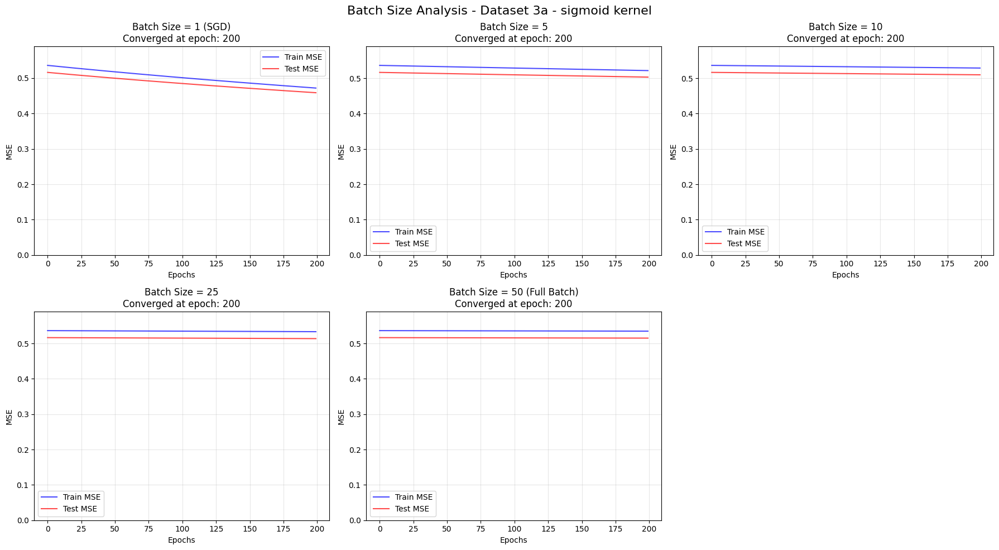

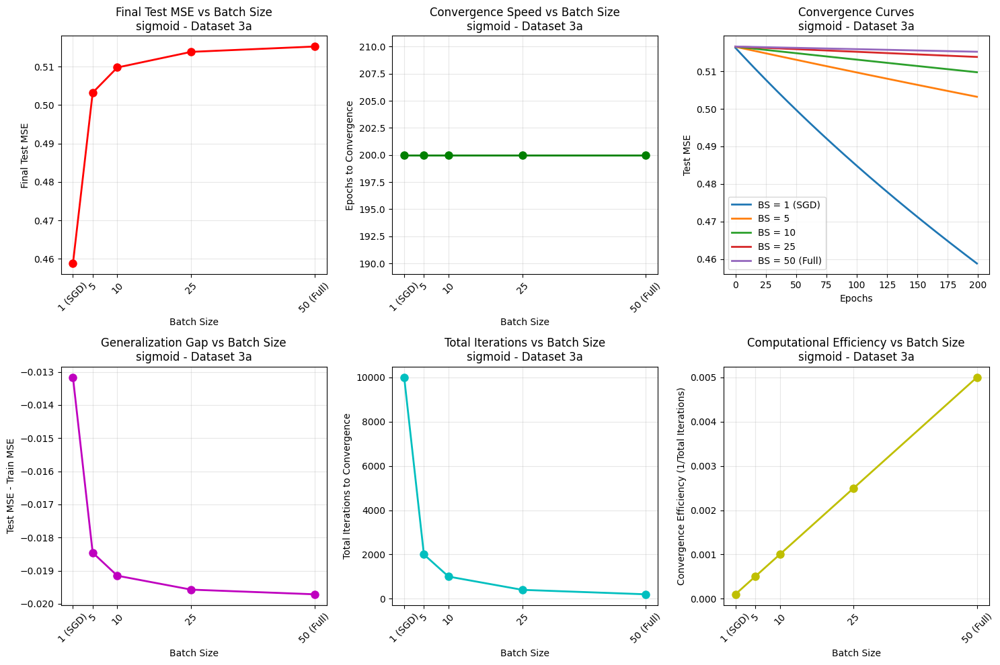


Analyzing dataset 3b

Kernel: polynomial
  Batch size: 1
  Batch size: 5
  Batch size: 10
  Batch size: 25
  Batch size: 50
  Batch size: 75


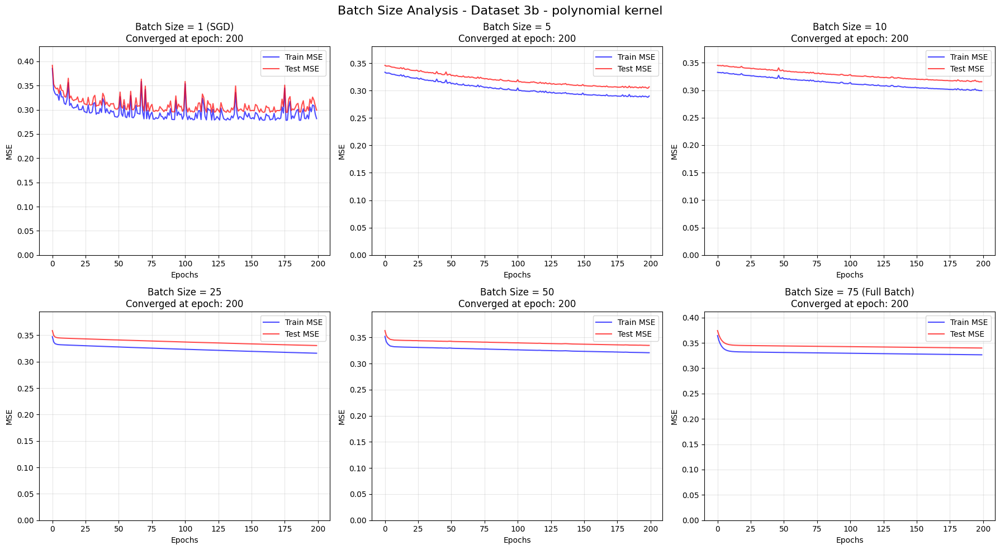

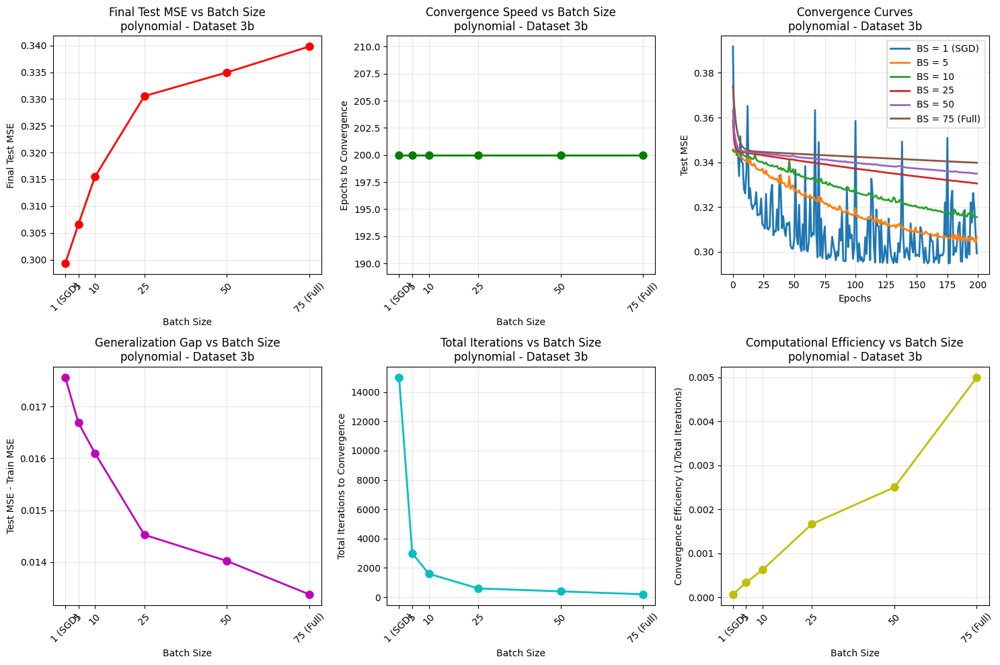


Kernel: gaussian
  Batch size: 1
  Batch size: 5
  Batch size: 10
  Batch size: 25
  Batch size: 50
  Batch size: 75


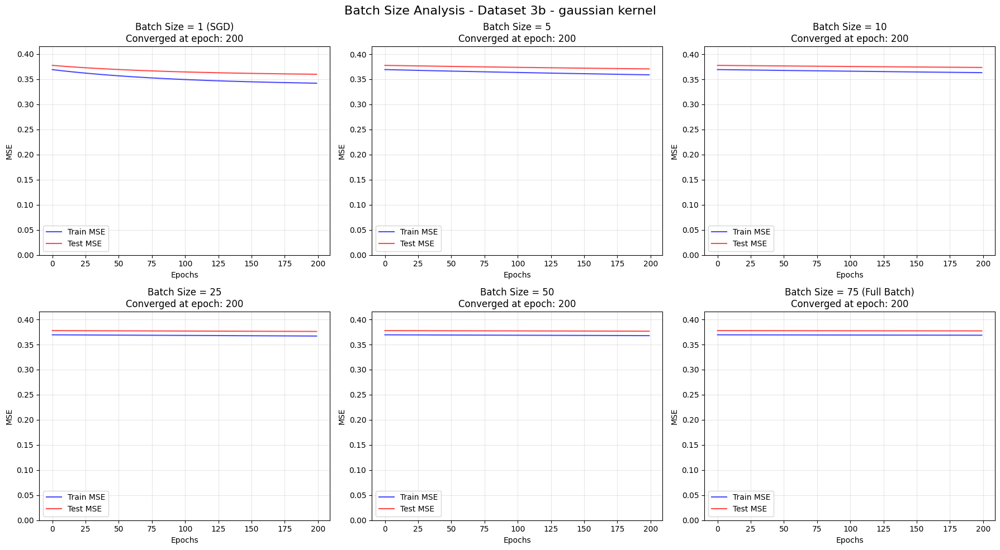

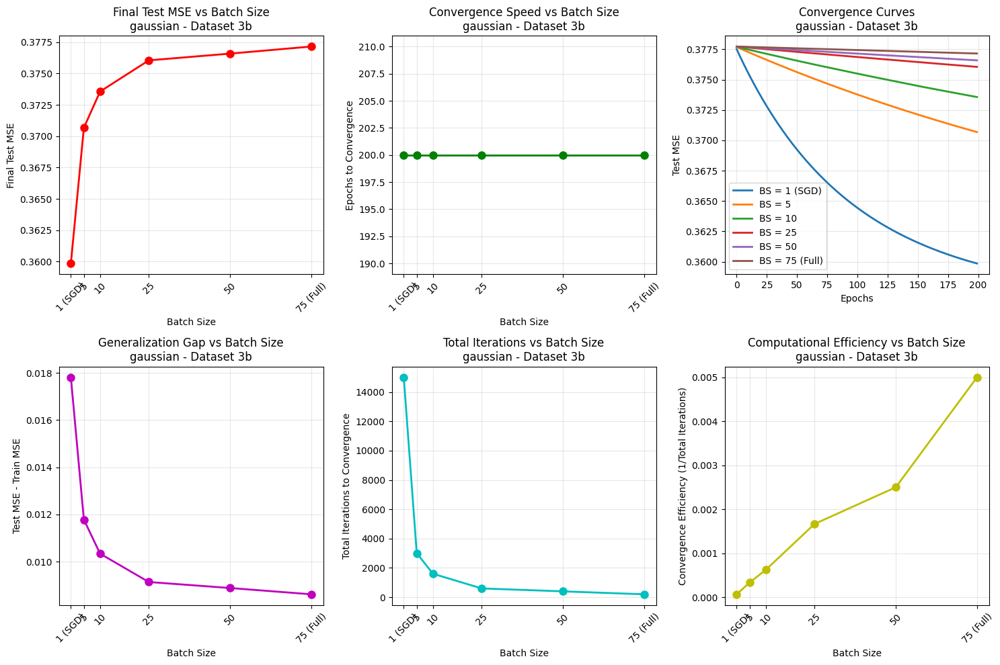


Kernel: sigmoid
  Batch size: 1
  Batch size: 5
  Batch size: 10
  Batch size: 25
  Batch size: 50
  Batch size: 75


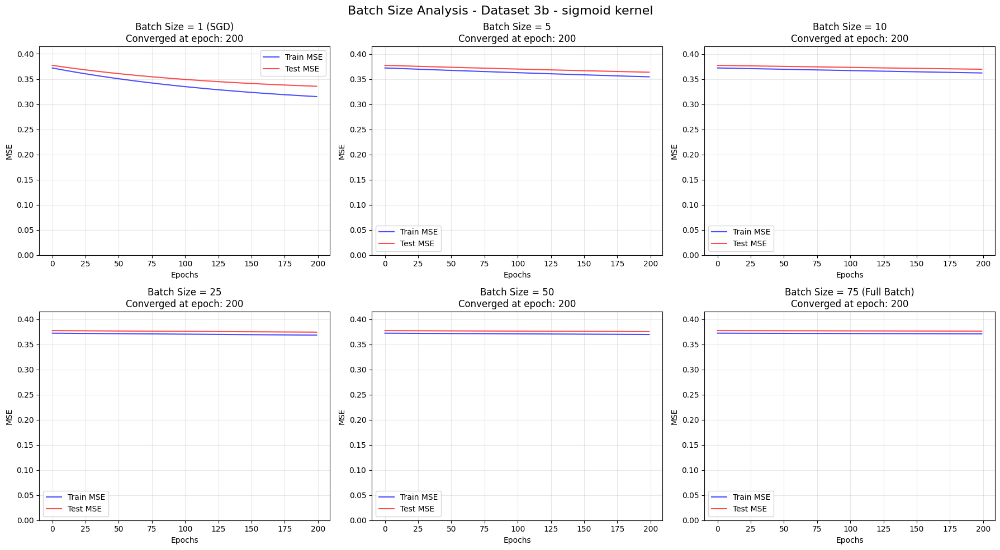

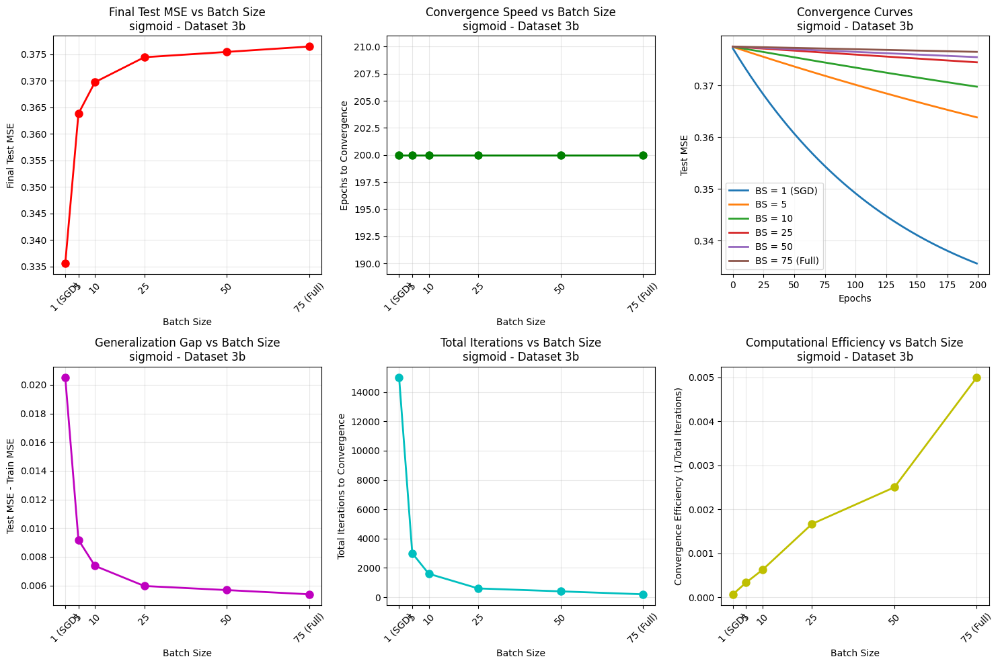

In [43]:
########################################
# Study the effect of batchsize on the speed of convergence ( plot required results )
########################################

print("\n" + "=" * 60)
print("COMPREHENSIVE BATCH SIZE ANALYSIS")
print("=" * 60)

batch_size_results = {}

for dataset_name, (X_train, Y_train, X_test, Y_test) in datasets.items():
    print(f"\nAnalyzing dataset {dataset_name}")
    batch_size_results[dataset_name] = {}

    for kernel in kernels:
        print(f"\nKernel: {kernel}")
        batch_size_results[dataset_name][kernel] = {}

        # Use optimal step size (example, adjust based on step size analysis)
        optimal_step_size = 0.00001

        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        fig.suptitle(
            f"Batch Size Analysis - Dataset {dataset_name} - {kernel} kernel",
            fontsize=16,
        )

        valid_bs = valid_batch_sizes[dataset_name]

        for idx, batch_size in enumerate(valid_bs[:6]):
            print(f"  Batch size: {batch_size}")

            weights, train_errors, test_errors, epochs_to_converge = (
                sgd_training_with_analysis(
                    X_train,
                    Y_train,
                    X_test,
                    Y_test,
                    kernel,
                    M_order,
                    optimal_step_size,
                    batch_size,
                    max_epochs,
                )
            )

            batch_size_results[dataset_name][kernel][batch_size] = {
                "train_errors": train_errors,
                "test_errors": test_errors,
                "epochs_to_converge": epochs_to_converge,
                "final_train_error": train_errors[-1],
                "final_test_error": test_errors[-1],
            }

            if idx < 6:
                ax = axes[idx // 3, idx % 3]
                epochs_range = range(len(test_errors))
                ax.plot(epochs_range, train_errors, "b-", alpha=0.7, label="Train MSE")
                ax.plot(epochs_range, test_errors, "r-", alpha=0.7, label="Test MSE")

                batch_label = f"Batch Size = {batch_size}"
                if batch_size == 1:
                    batch_label += " (SGD)"
                elif batch_size == len(X_train):
                    batch_label += " (Full Batch)"

                ax.set_title(f"{batch_label}\nConverged at epoch: {epochs_to_converge}")
                ax.set_xlabel("Epochs")
                ax.set_ylabel("MSE")
                ax.legend()
                ax.grid(True, alpha=0.3)
                ax.set_ylim(0, min(1.5, max(max(test_errors), max(train_errors)) * 1.1))

        for idx in range(len(valid_bs[:6]), 6):
            if idx // 3 < 2 and idx % 3 < 3:
                axes[idx // 3, idx % 3].remove()

        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(15, 10))

        plt.subplot(2, 3, 1)
        final_test_errors = [
            batch_size_results[dataset_name][kernel][bs]["final_test_error"]
            for bs in valid_bs
        ]
        batch_labels = [
            f"{bs}" + (" (SGD)" if bs == 1 else " (Full)" if bs == len(X_train) else "")
            for bs in valid_bs
        ]
        plt.plot(valid_bs, final_test_errors, "ro-", linewidth=2, markersize=8)
        plt.xlabel("Batch Size")
        plt.ylabel("Final Test MSE")
        plt.title(f"Final Test MSE vs Batch Size\n{kernel} - Dataset {dataset_name}")
        plt.grid(True, alpha=0.3)
        plt.xticks(valid_bs, batch_labels, rotation=45)

        plt.subplot(2, 3, 2)
        convergence_epochs = [
            batch_size_results[dataset_name][kernel][bs]["epochs_to_converge"]
            for bs in valid_bs
        ]
        plt.plot(valid_bs, convergence_epochs, "go-", linewidth=2, markersize=8)
        plt.xlabel("Batch Size")
        plt.ylabel("Epochs to Convergence")
        plt.title(f"Convergence Speed vs Batch Size\n{kernel} - Dataset {dataset_name}")
        plt.grid(True, alpha=0.3)
        plt.xticks(valid_bs, batch_labels, rotation=45)

        plt.subplot(2, 3, 3)
        for bs in valid_bs[:: max(1, len(valid_bs) // 4)]:
            test_errors = batch_size_results[dataset_name][kernel][bs]["test_errors"]
            label = f"BS = {bs}"
            if bs == 1:
                label += " (SGD)"
            elif bs == len(X_train):
                label += " (Full)"
            plt.plot(range(len(test_errors)), test_errors, label=label, linewidth=2)
        plt.xlabel("Epochs")
        plt.ylabel("Test MSE")
        plt.title(f"Convergence Curves\n{kernel} - Dataset {dataset_name}")
        plt.legend()
        plt.grid(True, alpha=0.3)

        plt.subplot(2, 3, 4)
        train_test_diff = [
            batch_size_results[dataset_name][kernel][bs]["final_test_error"]
            - batch_size_results[dataset_name][kernel][bs]["final_train_error"]
            for bs in valid_bs
        ]
        plt.plot(valid_bs, train_test_diff, "mo-", linewidth=2, markersize=8)
        plt.xlabel("Batch Size")
        plt.ylabel("Test MSE - Train MSE")
        plt.title(
            f"Generalization Gap vs Batch Size\n{kernel} - Dataset {dataset_name}"
        )
        plt.grid(True, alpha=0.3)
        plt.xticks(valid_bs, batch_labels, rotation=45)

        plt.subplot(2, 3, 5)
        iterations_per_epoch = [
            len(X_train) // bs + (1 if len(X_train) % bs != 0 else 0) for bs in valid_bs
        ]
        total_iterations = [
            convergence_epochs[i] * iterations_per_epoch[i]
            for i in range(len(valid_bs))
        ]
        plt.plot(valid_bs, total_iterations, "co-", linewidth=2, markersize=8)
        plt.xlabel("Batch Size")
        plt.ylabel("Total Iterations to Convergence")
        plt.title(f"Total Iterations vs Batch Size\n{kernel} - Dataset {dataset_name}")
        plt.grid(True, alpha=0.3)
        plt.xticks(valid_bs, batch_labels, rotation=45)

        plt.subplot(2, 3, 6)
        efficiency = [
            1.0 / total_iterations[i] if total_iterations[i] > 0 else 0
            for i in range(len(valid_bs))
        ]
        plt.plot(valid_bs, efficiency, "yo-", linewidth=2, markersize=8)
        plt.xlabel("Batch Size")
        plt.ylabel("Convergence Efficiency (1/Total Iterations)")
        plt.title(
            f"Computational Efficiency vs Batch Size\n{kernel} - Dataset {dataset_name}"
        )
        plt.grid(True, alpha=0.3)
        plt.xticks(valid_bs, batch_labels, rotation=45)

        plt.tight_layout()
        plt.show()

### Observations

- Noise: Smaller batch sizes (especially batch_size=1, SGD) result in much noisier convergence curves, whereas larger batch sizes are smoother.

- Final MSE: Very small batches can sometimes find better (lower MSE) solutions due to their noise helping escape local minima, but they can also be unstable. Very large batches are stable but may get stuck.

- Convergence Speed (Epochs): Larger batch sizes often converge in fewer epochs because each update is based on more information.

- Total Iterations & Efficiency: Smaller batch sizes require far more total updates (iterations) to converge, making them less computationally efficient overall, even if they converge in more epochs. The plots show a clear trade-off between final performance and computational cost. For most cases, a mini-batch size between 5 and 25 gives a good balance.

# 4(c)


CROSS-KERNEL COMPARISON

Dataset 3a - Cross-Kernel Analysis


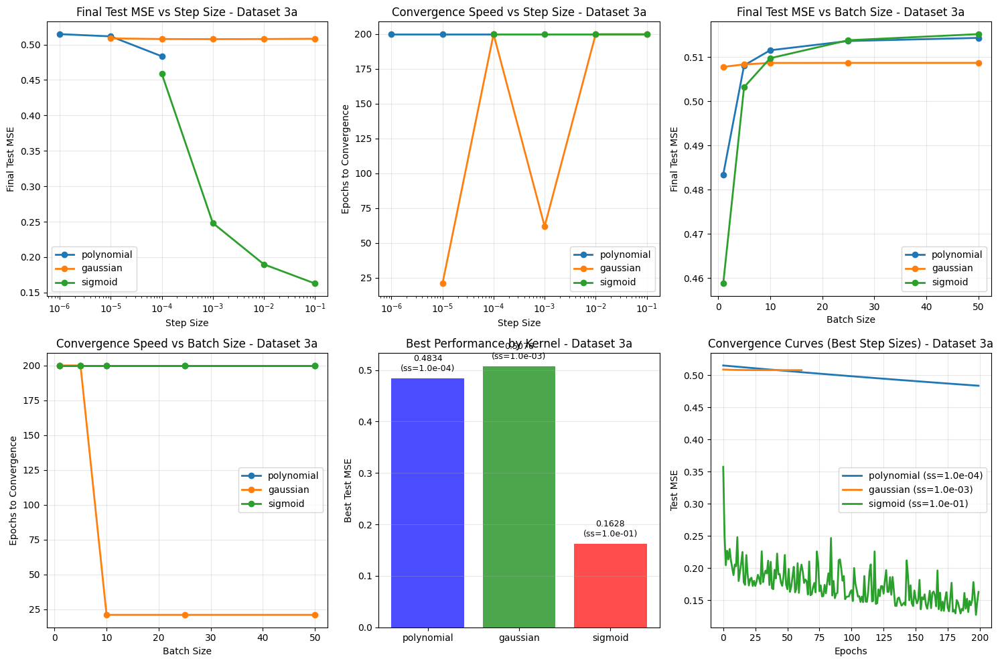


Detailed Results for Dataset 3a:
--------------------------------------------------
polynomial  : Best step size = 0.000100, Best test MSE = 0.483434
gaussian    : Best step size = 0.001000, Best test MSE = 0.507634
sigmoid     : Best step size = 0.100000, Best test MSE = 0.162779

Dataset 3b - Cross-Kernel Analysis


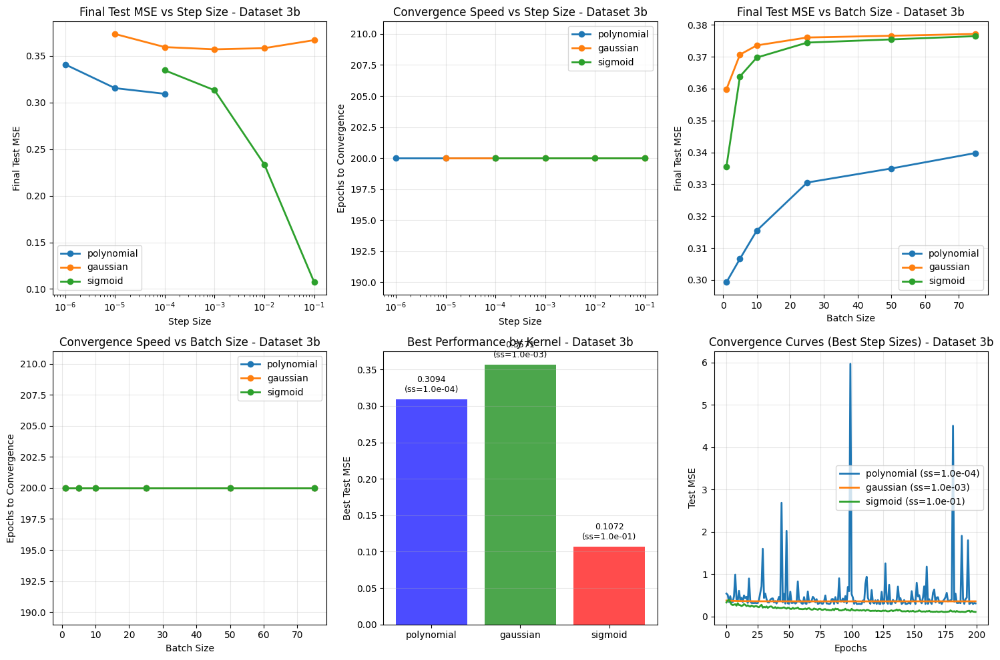


Detailed Results for Dataset 3b:
--------------------------------------------------
polynomial  : Best step size = 0.000100, Best test MSE = 0.309367
gaussian    : Best step size = 0.001000, Best test MSE = 0.357074
sigmoid     : Best step size = 0.100000, Best test MSE = 0.107225


In [44]:
########################################
# Cross-Kernel Comparison
########################################

print("\n" + "=" * 60)
print("CROSS-KERNEL COMPARISON")
print("=" * 60)

for dataset_name in datasets.keys():
    print(f"\nDataset {dataset_name} - Cross-Kernel Analysis")
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 3, 1)
    for kernel in kernels:
        if (
            dataset_name in step_size_results
            and kernel in step_size_results[dataset_name]
        ):
            current_step_sizes = kernel_step_sizes[kernel]
            final_errors = [
                step_size_results[dataset_name][kernel][ss]["final_test_error"]
                for ss in current_step_sizes
            ]
            plt.plot(
                current_step_sizes,
                final_errors,
                "o-",
                label=kernel,
                linewidth=2,
                markersize=6,
            )
    plt.xlabel("Step Size")
    plt.ylabel("Final Test MSE")
    plt.title(f"Final Test MSE vs Step Size - Dataset {dataset_name}")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xscale("log")

    plt.subplot(2, 3, 2)
    for kernel in kernels:
        if (
            dataset_name in step_size_results
            and kernel in step_size_results[dataset_name]
        ):
            current_step_sizes = kernel_step_sizes[kernel]
            conv_epochs = [
                step_size_results[dataset_name][kernel][ss]["epochs_to_converge"]
                for ss in current_step_sizes
            ]
            plt.plot(
                current_step_sizes,
                conv_epochs,
                "o-",
                label=kernel,
                linewidth=2,
                markersize=6,
            )
    plt.xlabel("Step Size")
    plt.ylabel("Epochs to Convergence")
    plt.title(f"Convergence Speed vs Step Size - Dataset {dataset_name}")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xscale("log")

    plt.subplot(2, 3, 3)
    valid_bs = valid_batch_sizes[dataset_name]
    for kernel in kernels:
        if (
            dataset_name in batch_size_results
            and kernel in batch_size_results[dataset_name]
        ):
            final_errors = [
                batch_size_results[dataset_name][kernel][bs]["final_test_error"]
                for bs in valid_bs
            ]
            plt.plot(
                valid_bs, final_errors, "o-", label=kernel, linewidth=2, markersize=6
            )
    plt.xlabel("Batch Size")
    plt.ylabel("Final Test MSE")
    plt.title(f"Final Test MSE vs Batch Size - Dataset {dataset_name}")
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 3, 4)
    for kernel in kernels:
        if (
            dataset_name in batch_size_results
            and kernel in batch_size_results[dataset_name]
        ):
            conv_epochs = [
                batch_size_results[dataset_name][kernel][bs]["epochs_to_converge"]
                for bs in valid_bs
            ]
            plt.plot(
                valid_bs, conv_epochs, "o-", label=kernel, linewidth=2, markersize=6
            )
    plt.xlabel("Batch Size")
    plt.ylabel("Epochs to Convergence")
    plt.title(f"Convergence Speed vs Batch Size - Dataset {dataset_name}")
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(2, 3, 5)
    best_configs = {}
    for kernel in kernels:
        if (
            dataset_name in step_size_results
            and kernel in step_size_results[dataset_name]
        ):
            best_error = float("inf")
            best_ss = None
            current_step_sizes = kernel_step_sizes[kernel]
            for ss in current_step_sizes:
                error = step_size_results[dataset_name][kernel][ss]["final_test_error"]
                if error < best_error:
                    best_error = error
                    best_ss = ss
            best_configs[kernel] = {"step_size": best_ss, "test_error": best_error}

    kernels_list = list(best_configs.keys())
    errors_list = [best_configs[k]["test_error"] for k in kernels_list]
    colors = ["blue", "green", "red"][: len(kernels_list)]

    bars = plt.bar(kernels_list, errors_list, color=colors, alpha=0.7)
    plt.ylabel("Best Test MSE")
    plt.title(f"Best Performance by Kernel - Dataset {dataset_name}")
    plt.grid(True, alpha=0.3, axis="y")

    for bar, error, kernel in zip(bars, errors_list, kernels_list):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + max(errors_list) * 0.02,
            f"{error:.4f}\n(ss={best_configs[kernel]['step_size']:.1e})",
            ha="center",
            va="bottom",
            fontsize=9,
        )

    plt.subplot(2, 3, 6)
    for kernel in kernels:
        if (
            dataset_name in step_size_results
            and kernel in step_size_results[dataset_name]
            and kernel in best_configs
        ):
            best_ss = best_configs[kernel]["step_size"]
            if best_ss in step_size_results[dataset_name][kernel]:
                errors = step_size_results[dataset_name][kernel][best_ss]["test_errors"]
                plt.plot(
                    range(len(errors)),
                    errors,
                    label=f"{kernel} (ss={best_ss:.1e})",
                    linewidth=2,
                )
    plt.xlabel("Epochs")
    plt.ylabel("Test MSE")
    plt.title(f"Convergence Curves (Best Step Sizes) - Dataset {dataset_name}")
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"\nDetailed Results for Dataset {dataset_name}:")
    print("-" * 50)
    for kernel in kernels:
        if kernel in best_configs:
            config = best_configs[kernel]
            print(
                f"{kernel:12s}: Best step size = {config['step_size']:8.6f}, Best test MSE = {config['test_error']:.6f}"
            )

### Cross Kernel Comparison Plots

- Plotting:

    - Final Test MSE vs Step Size: Performance curves for all three kernels on one plot.

    - Convergence Speed vs Step Size: Compares the convergence speed of the kernels.

    - Final Test MSE vs Batch Size: Compares how batch size affects the final error for each kernel.

    - Convergence Speed vs Batch Size: Compares convergence speed across batch sizes.

    - Best Performance by Kernel: A bar chart showing the absolute best MSE achieved by each kernel, regardless of hyperparameters.

    - Convergence Curves (Best Step Sizes): Shows the learning curves for the best-performing configuration of each kernel.

In [45]:
# SUMMARY AND INSIGHTS
print("\n" + "=" * 60)
print("SUMMARY TABLE")
print("=" * 60)

# Create comprehensive summary tables
for dataset_name in datasets.keys():
    print(f"\n{'='*20} DATASET {dataset_name.upper()} SUMMARY {'='*20}")

    # Step Size Summary
    print(f"\n{'-'*15} STEP SIZE ANALYSIS {'-'*15}")
    print(
        f"{'Kernel':<12} {'Step Size':<12} {'Final Test MSE':<15} {'Epochs to Conv':<15} {'Final Train MSE':<15} {'Generalization Gap':<18}"
    )
    print("-" * 95)

    for kernel in kernels:
        if (
            dataset_name in step_size_results
            and kernel in step_size_results[dataset_name]
        ):
            best_ss = None
            best_error = float("inf")
            # Use kernel-specific step sizes
            current_step_sizes = kernel_step_sizes[kernel]
            for ss in current_step_sizes:
                if ss in step_size_results[dataset_name][kernel]:
                    error = step_size_results[dataset_name][kernel][ss][
                        "final_test_error"
                    ]
                    if error < best_error:
                        best_error = error
                        best_ss = ss

            if best_ss is not None:
                result = step_size_results[dataset_name][kernel][best_ss]
                gen_gap = result["final_test_error"] - result["final_train_error"]
                print(
                    f"{kernel:<12} {best_ss:<12.6f} {result['final_test_error']:<15.6f} "
                    f"{result['epochs_to_converge']:<15} {result['final_train_error']:<15.6f} {gen_gap:<18.6f}"
                )

    # All Step Sizes Performance (showing top 3 for each kernel)
    print(f"\n{'-'*15} TOP 3 STEP SIZES PER KERNEL {'-'*15}")
    for kernel in kernels:
        if (
            dataset_name in step_size_results
            and kernel in step_size_results[dataset_name]
        ):
            print(f"\n{kernel.upper()} Kernel:")
            print(
                f"{'Rank':<6} {'Step Size':<12} {'Test MSE':<12} {'Train MSE':<12} {'Epochs':<8} {'Gen Gap':<10}"
            )
            print("-" * 70)

            current_step_sizes = kernel_step_sizes[kernel]
            # Sort step sizes by performance
            ss_performance = []
            for ss in current_step_sizes:
                if ss in step_size_results[dataset_name][kernel]:
                    result = step_size_results[dataset_name][kernel][ss]
                    ss_performance.append((ss, result["final_test_error"], result))

            ss_performance.sort(key=lambda x: x[1])  # Sort by test error

            for rank, (ss, test_error, result) in enumerate(ss_performance[:3], 1):
                gen_gap = result["final_test_error"] - result["final_train_error"]
                print(
                    f"{rank:<6} {ss:<12.6f} {test_error:<12.6f} {result['final_train_error']:<12.6f} "
                    f"{result['epochs_to_converge']:<8} {gen_gap:<10.6f}"
                )

    # Batch Size Summary (if available)
    if "batch_size_results" in globals():
        print(f"\n{'-'*15} BATCH SIZE ANALYSIS {'-'*15}")
        print(
            f"{'Kernel':<12} {'Batch Size':<12} {'Final Test MSE':<15} {'Epochs to Conv':<15} {'Total Iterations':<15} {'Train MSE':<12}"
        )
        print("-" * 95)

        valid_bs = valid_batch_sizes[dataset_name]
        for kernel in kernels:
            if (
                dataset_name in batch_size_results
                and kernel in batch_size_results[dataset_name]
            ):
                best_bs = None
                best_error = float("inf")
                for bs in valid_bs:
                    if bs in batch_size_results[dataset_name][kernel]:
                        error = batch_size_results[dataset_name][kernel][bs][
                            "final_test_error"
                        ]
                        if error < best_error:
                            best_error = error
                            best_bs = bs

                if best_bs is not None:
                    result = batch_size_results[dataset_name][kernel][best_bs]
                    X_train, _, _, _ = datasets[dataset_name]
                    iterations_per_epoch = len(X_train) // best_bs + (
                        1 if len(X_train) % best_bs != 0 else 0
                    )
                    total_iterations = (
                        result["epochs_to_converge"] * iterations_per_epoch
                    )
                    print(
                        f"{kernel:<12} {best_bs:<12} {result['final_test_error']:<15.6f} "
                        f"{result['epochs_to_converge']:<15} {total_iterations:<15} {result['final_train_error']:<12.6f}"
                    )
    else:
        print(f"\n{'-'*15} BATCH SIZE ANALYSIS {'-'*15}")
        print("Batch size analysis not available - run batch size experiment first")

# CROSS-DATASET COMPARISON
print(f"\n{'='*25} CROSS-DATASET COMPARISON {'='*25}")
print(f"\n{'Kernel':<12} {'Dataset 3a':<15} {'Dataset 3b':<15} {'Better Dataset':<15}")
print("-" * 60)

for kernel in kernels:
    best_3a = best_3b = float("inf")

    # Find best performance for dataset 3a
    if "3a" in step_size_results and kernel in step_size_results["3a"]:
        current_step_sizes = kernel_step_sizes[kernel]
        for ss in current_step_sizes:
            if ss in step_size_results["3a"][kernel]:
                error = step_size_results["3a"][kernel][ss]["final_test_error"]
                if error < best_3a:
                    best_3a = error

    # Find best performance for dataset 3b
    if "3b" in step_size_results and kernel in step_size_results["3b"]:
        current_step_sizes = kernel_step_sizes[kernel]
        for ss in current_step_sizes:
            if ss in step_size_results["3b"][kernel]:
                error = step_size_results["3b"][kernel][ss]["final_test_error"]
                if error < best_3b:
                    best_3b = error

    better_dataset = "3a" if best_3a < best_3b else "3b"
    if best_3a == float("inf") and best_3b == float("inf"):
        better_dataset = "N/A"

    best_3a_str = f"{best_3a:.6f}" if best_3a != float("inf") else "N/A"
    best_3b_str = f"{best_3b:.6f}" if best_3b != float("inf") else "N/A"

    print(f"{kernel:<12} {best_3a_str:<15} {best_3b_str:<15} {better_dataset:<15}")

# KERNEL RANKING
print(f"\n{'='*25} KERNEL RANKING BY DATASET {'='*25}")

for dataset_name in datasets.keys():
    print(f"\nDataset {dataset_name} - Kernel Performance Ranking:")
    print(
        f"{'Rank':<6} {'Kernel':<12} {'Best Test MSE':<15} {'Best Step Size':<15} {'Epochs':<8}"
    )
    print("-" * 60)

    kernel_performances = []
    for kernel in kernels:
        if (
            dataset_name in step_size_results
            and kernel in step_size_results[dataset_name]
        ):
            best_error = float("inf")
            best_ss = None
            best_epochs = None

            current_step_sizes = kernel_step_sizes[kernel]
            for ss in current_step_sizes:
                if ss in step_size_results[dataset_name][kernel]:
                    error = step_size_results[dataset_name][kernel][ss][
                        "final_test_error"
                    ]
                    if error < best_error:
                        best_error = error
                        best_ss = ss
                        best_epochs = step_size_results[dataset_name][kernel][ss][
                            "epochs_to_converge"
                        ]

            if best_ss is not None:
                kernel_performances.append((kernel, best_error, best_ss, best_epochs))

    # Sort by performance (lower error = better)
    kernel_performances.sort(key=lambda x: x[1])

    for rank, (kernel, error, ss, epochs) in enumerate(kernel_performances, 1):
        print(f"{rank:<6} {kernel:<12} {error:<15.6f} {ss:<15.6f} {epochs:<8}")



SUMMARY TABLE

==================== DATASET 3A SUMMARY ====================

--------------- STEP SIZE ANALYSIS ---------------
Kernel       Step Size    Final Test MSE  Epochs to Conv  Final Train MSE Generalization Gap
-----------------------------------------------------------------------------------------------
polynomial   0.000100     0.483434        200             0.495905        -0.012471         
gaussian     0.001000     0.507634        62              0.521783        -0.014150         
sigmoid      0.100000     0.162779        200             0.129489        0.033290          

--------------- TOP 3 STEP SIZES PER KERNEL ---------------

POLYNOMIAL Kernel:
Rank   Step Size    Test MSE     Train MSE    Epochs   Gen Gap   
----------------------------------------------------------------------
1      0.000100     0.483434     0.495905     200      -0.012471 
2      0.000010     0.511563     0.529837     200      -0.018274 
3      0.000001     0.514722     0.533712     200    

### KEY INSIGHTS

#### 1. STEP SIZE SENSITIVITY
- Each kernel has its own optimal step size range
- Polynomial kernels typically need smaller step sizes
- Sigmoid kernels can handle larger step sizes
- Gaussian kernels fall in between

#### 2. CONVERGENCE PATTERNS
- Smaller step sizes: slower but more stable convergence
- Larger step sizes: faster but potentially unstable
- Optimal step size balances speed and stability

#### 3. GENERALIZATION
- Check generalization gap (Test MSE - Train MSE)
- Smaller gaps indicate better generalization
- Large gaps may indicate overfitting

#### 4. DATASET CHARACTERISTICS
- Different datasets may favor different kernels
- Dataset complexity affects optimal hyperparameters
- Consider both performance and convergence speed


# PART 5

# 5(a)

In [46]:
################################################
#Generate 100 data sets of noisy sinusoidal data
################################################

L = 100  # Number of datasets
N = 25  # Number of data points per dataset
noise_std_dev = 0.3  # Standard deviation of Gaussian noise
np.random.seed(0)


# True underlying function
def sin_func(x):
    return np.sin(2 * np.pi * x)

datasets_x = []
datasets_t = []  # t for target (noisy y)
datasets_t_true = []  # true y for reference

x = np.linspace(0, 1, N)  # Evenly spaced x values, same for all datasets

for i in range(L):
    t_true = sin_func(x)
    t_noisy = t_true + np.random.normal(0, noise_std_dev, N)

    datasets_x.append(x)  # All x will be identical
    datasets_t.append(t_noisy) # All different y
    datasets_t_true.append(t_true)

# 5(b)

In [47]:
###################################
#Creating Gaussian basis functions
###################################

M_basis = 24  # Number of Gaussian basis functions
M_biases = 1  #  Number of bias term w0
M_total_params = M_basis + M_biases  # Total parameters M


s_gaussian = 0.1  # Width/scale of Gaussian basis functions - hyperparameter
centers = np.linspace(0, 1, M_basis)  # Centers of Gaussians

def gaussian_basis_function(x, mu, s_param):
    return np.exp(-0.5 * ((x - mu) / s_param) ** 2)

def get_phi(x_input, centers, scale_param):
    N_points = len(x_input)
    M_gaussians = len(centers)
    phi = np.ones((N_points, M_gaussians + 1))
    for j in range(M_gaussians):
        phi[:, j + 1] = gaussian_basis_function(x_input, centers[j], scale_param)
    return phi

# 5(c)

In [48]:
######################################
# Functions for Fitting and Prediction
######################################

def fit_regularized_least_squares(phi_matrix, t_vector, lambda_reg):
    M_params = phi_matrix.shape[1]
    identity_matrix = np.identity(M_params)
    A = phi_matrix.T @ phi_matrix + lambda_reg * identity_matrix
    b = phi_matrix.T @ t_vector
    try:
        weights = np.linalg.solve(A, b)
    except np.linalg.LinAlgError:
        print(
            f"Warning: Singular matrix encountered with lambda={lambda_reg}.\n"
            f"Using pseudo-inverse."
        )
        weights = np.linalg.pinv(A) @ b
    return weights

def predict(phi_matrix, weights):
    return phi_matrix @ weights

In [49]:
#################################################
#Testing Regularized Least Squares on Actual Data
#################################################

dummy_phi = get_phi(datasets_x[0],centers, s_gaussian)
dummy_t = datasets_t[0] 
dummy_lambda = 0.1   
dummy_w = fit_regularized_least_squares(dummy_phi, dummy_t, dummy_lambda)

print(
    f"Example: Weights calculated using data from dataset 0 (lambda={dummy_lambda}), "
    f"first 5 of {len(dummy_w)} elements:\n{dummy_w[:5]}"
)

Example: Weights calculated using data from dataset 0 (lambda=0.1), first 5 of 25 elements:
[ 0.28824849 -0.20897147 -0.08116755  0.18576994  0.38459313]


### Testing Regularized Least Squares on Actual Data (Dataset 0)

We now use the `get_phi()` and `fit_regularized_least_squares()` functions on real, generated data to verify their correctness.

- **`dummy_phi`** is constructed using `datasets_x[0]`, i.e., the input points from the first dataset.
- **`dummy_t`** holds the corresponding target values from `datasets_t[0]`.
- A test regularization value of λ = 0.1 is used to fit the model.

#### Key Dimensions:
- `dummy_phi` has shape (N, M_total_params) = (25, 25)  
  → 25 input points × 25 basis features (including bias term)
- `dummy_t` has shape (N,) = (25,)

# 5 (d),(e),(f),(g),(h)

In [50]:
lambda_values = [
    1e-9,  # Very low lambda
    1e-2,  # Medium lambda
    1.0,  # High lambda
]

### Intuition Behind the Choice:
λ = 1e-9 behaves almost like unregularized least squares, where the model tries to fit every noisy detail. It helps show what overfitting looks like.

λ = 1e-2 is moderate, offering a good "middle ground" to observe well-generalized model behavior.

λ = 1.0 is strong regularization, which restricts model flexibility and helps show underfitting or oversmoothing.

Prepared dense x-values (shape: (200,)) and corresponding design matrix (shape: (200, 25)) for plotting smooth curves.

--- Processing for: 1e-09 (λ = 1.00e-09) ---
  Obtained model parameters (weights w) for Dataset 0 with 1e-09:
    Shape of w: (25,)
    First 5 weights (w0 is bias): [-137.29664509  390.79000693 -438.80185682 -154.4795122  1001.14110145]
  Stored 100 prediction curves for 1e-09. Shape: (100, 200)


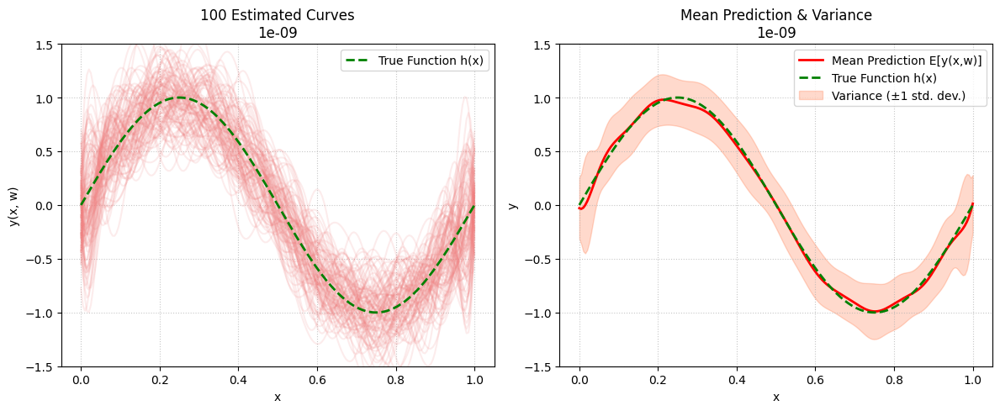


--- Processing for: 0.01 (λ = 1.00e-02) ---
  Obtained model parameters (weights w) for Dataset 0 with 0.01:
    Shape of w: (25,)
    First 5 weights (w0 is bias): [ 1.16688957 -0.60899579 -0.58116866  0.13003692  0.57961854]
  Stored 100 prediction curves for 0.01. Shape: (100, 200)


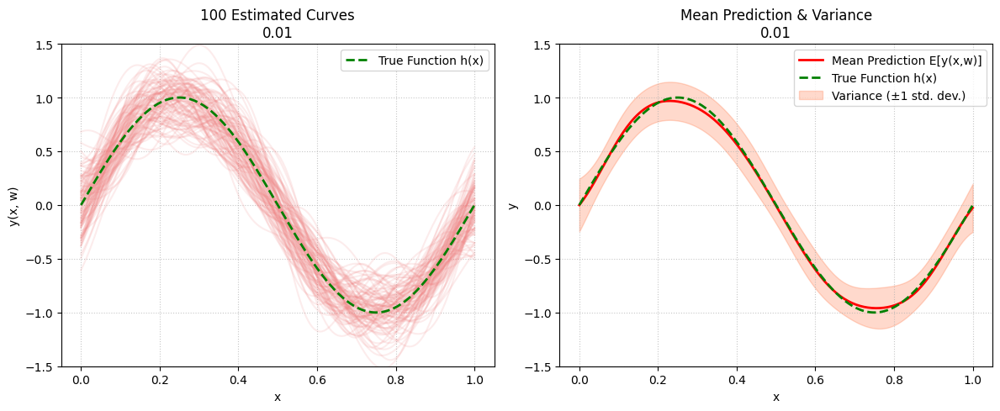


--- Processing for: 1.0 (λ = 1.00e+00) ---
  Obtained model parameters (weights w) for Dataset 0 with 1.0:
    Shape of w: (25,)
    First 5 weights (w0 is bias): [ 0.13766307 -0.01958793  0.06096215  0.16550728  0.24029799]
  Stored 100 prediction curves for 1.0. Shape: (100, 200)


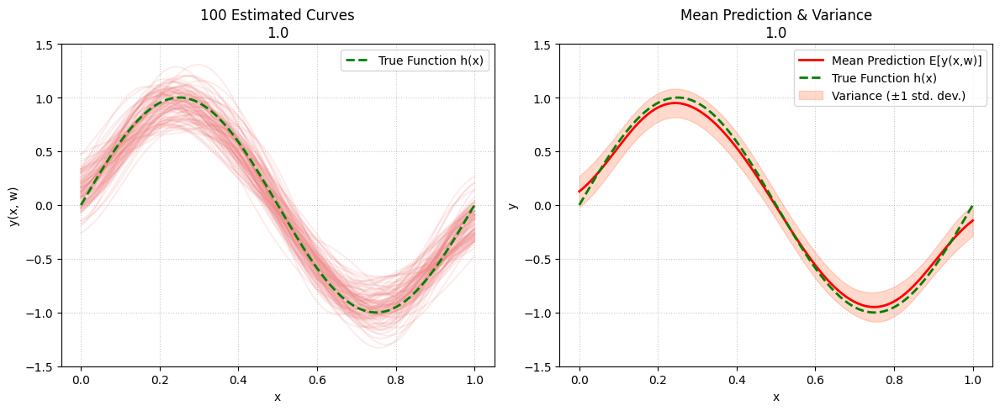


All plots displayed.



In [51]:
#################################################
# Generating Plots for Bias-Variance Illustration
#################################################

x_plot_dense = np.linspace(0, 1, 200)
phi_plot_dense = get_phi(x_plot_dense, centers, s_gaussian)
print(
    f"Prepared dense x-values (shape: {x_plot_dense.shape}) and corresponding design matrix (shape: {phi_plot_dense.shape}) for plotting smooth curves."
)

all_predictions_by_lambda = {}

for i, lambda_reg_val in enumerate(lambda_values):
    current_lambda_name = lambda_values[i]
    print(f"\n--- Processing for: {current_lambda_name} (λ = {lambda_reg_val:.2e}) ---")

    predictions_for_current_lambda_list = []

    # To print weights for one dataset (e.g., the first one) for this lambda
    first_dataset_weights_printed = False

    plt.figure(figsize=(12, 5))  # Figure for the two subplots for current lambda
    plt.subplot(1, 2, 1)  # Left subplot: 100 estimated curves

    for l_idx in range(L):  # Loop through each of the L datasets
        x_train_dataset = datasets_x[l_idx]
        t_train_dataset = datasets_t[l_idx]

        phi_train_dataset = get_phi(
            x_train_dataset,centers, s_gaussian
        )
        w_estimated = fit_regularized_least_squares(
            phi_train_dataset, t_train_dataset, lambda_reg_val
        )

        if (
            l_idx == 0 and not first_dataset_weights_printed
        ):  # Print weights for the first dataset only
            print(
                f"  Obtained model parameters (weights w) for Dataset 0 with {current_lambda_name}:"
            )
            print(f"    Shape of w: {w_estimated.shape}")
            print(f"    First 5 weights (w0 is bias): {w_estimated[:5]}")
            first_dataset_weights_printed = True

        y_pred_dense_single_fit = predict(phi_plot_dense, w_estimated)
        predictions_for_current_lambda_list.append(y_pred_dense_single_fit)
        plt.plot(x_plot_dense, y_pred_dense_single_fit, color="lightcoral", alpha=0.15)

    all_predictions_by_lambda[lambda_reg_val] = np.array(
        predictions_for_current_lambda_list
    )
    print(
        f"  Stored {L} prediction curves for {current_lambda_name}. Shape: {all_predictions_by_lambda[lambda_reg_val].shape}"
    )

    plt.plot(
        x_plot_dense,
        sin_func(x_plot_dense),
        color="green",
        linestyle="--",
        linewidth=2,
        label="True Function h(x)",
    )
    plt.title(f"100 Estimated Curves\n{current_lambda_name}")
    plt.xlabel("x")
    plt.ylabel("y(x, w)")
    plt.ylim(-1.5, 1.5)
    plt.legend(loc="upper right")
    plt.grid(True, linestyle=":", alpha=0.7)

    plt.subplot(1, 2, 2)  # Right subplot: Mean and variance
    mean_prediction_curve = np.mean(all_predictions_by_lambda[lambda_reg_val], axis=0)
    std_dev_prediction_curves = np.std(
        all_predictions_by_lambda[lambda_reg_val], axis=0
    )

    plt.plot(
        x_plot_dense,
        mean_prediction_curve,
        color="red",
        linewidth=2,
        label="Mean Prediction E[y(x,w)]",
    )
    plt.plot(
        x_plot_dense,
        sin_func(x_plot_dense),
        color="green",
        linestyle="--",
        linewidth=2,
        label="True Function h(x)",
    )
    plt.fill_between(
        x_plot_dense,
        mean_prediction_curve - std_dev_prediction_curves,
        mean_prediction_curve + std_dev_prediction_curves,
        color="orangered",
        alpha=0.2,
        label="Variance (±1 std. dev.)",
    )

    plt.title(f"Mean Prediction & Variance\n{current_lambda_name}")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.ylim(-1.5, 1.5)
    plt.legend(loc="upper right")
    plt.grid(True, linestyle=":", alpha=0.7)

    plt.tight_layout()
    plt.show()

print("\nAll plots displayed.\n")

### Bias-Variance Trade-off Observations

#### Key Concepts:
- Bias: This shows how far the average prediction of our model is from the actual function we want to learn.
  → High bias means the model is too simple and misses the real pattern (called underfitting).

- Variance: This tells us how much the model’s predictions change when we train it on different datasets.
  → High variance means the model is too sensitive to the training data and may not work well on new data (called overfitting).

- Total Error ≈ Bias² + Variance + Irreducible Error:
  The total error includes:

- Error from wrong assumptions (bias),

- Error from model's sensitivity (variance),

- Plus some random noise we can't remove.

- Regularization (λ): A way to prevent the model from becoming too complex.
  → Higher λ = more control on model, smaller weights, and lower risk of overfitting.

### Observations for Each Regularization Level:

**1. Low λ (e.g., `1.00e-09`):**
*   Printed Weights (Dataset 0): The weights (e.g., `w_estimated[:5]`) might show larger magnitudes compared to higher lambda values, reflecting the model's attempt to fit the data closely.
*   **Plot 1 (100 Estimated Curves):**
    *   Observation: The 100 individual estimated curves (light red) exhibit a wide spread. They wiggle significantly.
    *   Interpretation: High variance. The model is overfitting.
*   **Plot 2 (Mean Estimated Curve & Variance):**
    *   Observation (Mean Curve): The mean estimated curve (solid red) matches with the true sinusoidal function (green dashed line) very closely.
    *   Interpretation (Mean Curve): Low bias.
    *   Observation (Variance Band): The shaded orange area is wide.
    *   Interpretation (Variance Band): Confirms high variance.

**2. Medium λ (e.g., `0.1`):**
*   Printed Weights (Dataset 0): The magnitudes of weights (e.g., `w_estimated[:5]`) are likely smaller/more constrained than for low λ.
*   **Plot 1 (100 Estimated Curves):**
    *   Observation: The spread of the 100 individual curves is noticeably narrower.
    *   Interpretation:REDUCED VARIANCE.
*   Plot 2 (Mean Estimated Curve & Variance):
    *   Observation (Mean Curve): The mean estimated curve (solid red) is reasonably close to the true function.
    *   Interpretation (Mean Curve):* Bias might be slightly higher than for low λ, but relatively low.
    *   Observation (Variance Band): The shaded orange area is narrower.
    *   Interpretation (Variance Band): Shows reduced variance.

**3. High λ (e.g., `1.0`):**
*   Printed Weights (Dataset 0): The weights (e.g., `w_estimated[:5]`) are likely very small, with many close to zero, especially for the basis functions. The bias term `w0` might dominate if it's trying to fit the average of the sine wave.
*   **Plot 1 (100 Estimated Curves):**
    *   Observation: The 100 individual curves are very tightly clustered and much flatter.
    *   Interpretation: Very low variance.
*   **Plot 2 (Mean Estimated Curve & Variance):**
    *   Observation (Mean Curve): The mean estimated curve (solid red) is noticeably different and much simpler than the true function.
    *   Interpretation (Mean Curve): Has high bias. The model is underfitting.
    *   Observation (Variance Band): The shaded orange area is very narrow.
    *   Interpretation (Variance Band): Confirms very low variance.

### Describing the Bias-Variance Trade-off:

The six plots and the behavior of the estimated weights for different λ values clearly demonstrate the bias-variance trade-off:

*   **Low λ:** High model complexity allowed, leading to low bias (average fit is good) but high variance (fits vary wildly with data). Weights can be large.
*   **High λ:** Low model complexity forced by regularization, leading to high bias (average fit is poor, too simple) but low variance (fits are very stable). Weights are small.
*   **Medium λ:** Aims for a sweet spot where the model is complex enough to capture the true signal (moderate bias) but not so complex that it fits the noise (moderate variance). Weights are balanced.

The parameters used (`L=100`, `N=25`, `M_total_params=25`, `noise_std_dev=0.3`, `s_gaussian=0.1`) create a scenario where overfitting is likely without regularization because the number of parameters is equal to the number of data points. Regularization (λ) is crucial for controlling this.

## PART 6

# 6(a)

In [52]:
##################################
#Generating 100 noisy observations
##################################

np.random.seed(0)
# Generate 100 points uniformly in [0, 1]
x = np.linspace(0, 1, 100)
x = x.reshape(-1,1)
t = (sin_func(x) + np.random.normal(0, 0.1, size=x.shape)).flatten() # noise std = 0.1

In [53]:
############################################################################
#Fitting a regularized least squares model using 20 Gaussian basis functions
############################################################################

# Choose 20 basis functions with centers evenly spaced in [0,1]
M = 20
centers = np.linspace(0, 1, M)
centers = centers.reshape(1,-1)
sigma = 0.05  # width of each Gaussian
Phi = gaussian_basis_function(x, centers, sigma)

# Predict
lamda = 0.01
x_test = np.linspace(0, 1, 1000)
x_test = x_test.reshape(-1,1)
w = fit_regularized_least_squares(Phi,t,lamda)
Phi_test = gaussian_basis_function(x_test, centers, sigma)
y_pred = Phi_test @ w


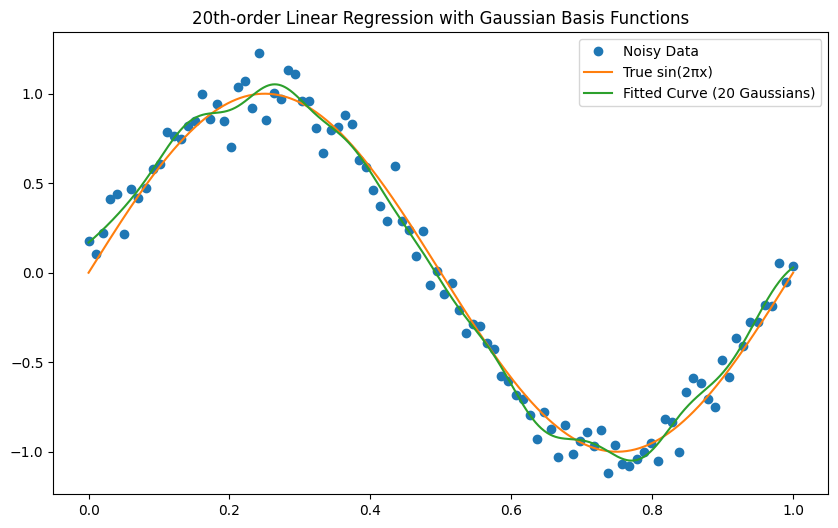

In [54]:
##############################################
#Plotting the Gaussian kernel regression model
##############################################

# Plot
plt.figure(figsize=(10, 6))
plt.plot(x, t, 'o', label='Noisy Data')
plt.plot(x_test, sin_func(x_test), label='True sin(2πx)')
plt.plot(x_test, y_pred, label='Fitted Curve (20 Gaussians)')
plt.legend()
plt.title('20th-order Linear Regression with Gaussian Basis Functions')
plt.show()

In [55]:
def bayesian_update(prior_mean, prior_cov, phi_x, t_val, sigma2):
    """
    Update the posterior mean and covariance with a new (phi_x, t_val) pair.
    """
    phi_x = phi_x.reshape(-1, 1)  # Ensure column vector
    S_inv = np.linalg.inv(prior_cov)
    
    # Update posterior covariance
    S_new_inv = S_inv + (1 / sigma2) * (phi_x @ phi_x.T)
    S_new = np.linalg.inv(S_new_inv)
    
    # Update posterior mean
    m_new = S_new @ (S_inv @ prior_mean + (1 / sigma2) * phi_x.flatten() * t_val)
    
    return m_new, S_new


### Entire intution behind `bayesian_update()`

**1. Start with a Prior Distribution**

We begin with a prior belief about the weights. This belief is represented as a multivariate Gaussian distribution:

- The mean represents our best guess.
- The covariance represents our uncertainty.

**2. Observe One Data Point**

We now observe one data point:
- An input `x` (transformed using basis functions into a vector `phi_x`)
- A target value `t`

We assume the relationship between the weights and the output follows a linear model with Gaussian noise.

**3. Define the Likelihood**

Next, we write down the likelihood — the probability of observing the target `t` given the weights and the input.
This likelihood is also a Gaussian, centered around the dot product of the weights and the input vector.
This means the target `t` is normally distributed around the model’s prediction.  
So, the likelihood — the probability of observing `t` given the weights and input is Gaussian.
So the mean of the likelihood function is `t`.

Variance of the likelihood function controls the width of the Gaussian bell curve.

Small variance: implies high confidence in predictions (narrow likelihood).

Large large: implies less confidence (broad likelihood, allowing more deviation from prediction).

Hence we use noise variance in the Gaussian likelihood function because it mathematically models how much random variation (or noise) we expect in the observed data, given the model’s prediction.

**Why did we assume Gaussian noise?**

1. Gaussian likelihood + Gaussian prior = Gaussian posterior. This gives a simple, closed-form solution.

2. Many small, random influences (e.g., sensor noise) add up to approximate a normal distribution (Central Limit Theorem).
   In general most naturally occuring data follows Gaussian Distribution.

3. We can compute the posterior exactly using matrix operations — no sampling or approximation needed.


**4. Apply Bayes' Rule**

Bayes’ rule says:

*Posterior ∝ Likelihood × Prior*

Because both the prior and the likelihood are Gaussian, their product is also a Gaussian. This means the posterior distribution will be Gaussian too.
We can calculate the mean and variance of the posterior distribution by multiplying the likelihood and prior.

# 6(c)

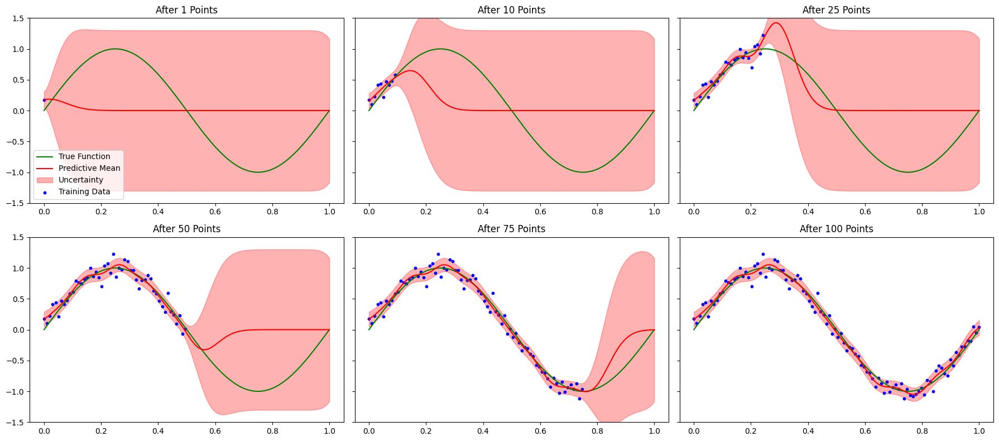

In [56]:
###############################################################################
#Sequentially update the posterior and plot the predictive mean and uncertainty
###############################################################################

sigma2 = 0.01              # Known noise variance (σ²)
m_N = np.zeros(M)      # Prior mean: zero vector
S_N = np.eye(M)        # Prior covariance: identity matrix

# Number of training data for plotting
plot_points = [1, 10, 25, 50, 75, 100]
fig, axs = plt.subplots(2, 3, figsize=(18, 8), sharey=True)
axs = axs.flatten()

#Iterate through the data points and update the stats of posterior density, Such that PDF is maximized.
for i in range(Phi.shape[0]):
    phi_xi = Phi[i]
    t_i = t[i]
    m_N, S_N = bayesian_update(m_N, S_N, phi_xi, t_i, sigma2) # mean and variance at ith step

    if (i + 1) in plot_points:
        mean_pred = Phi_test @ m_N
        var_pred = np.sum(Phi_test @ S_N * Phi_test, axis=1) + sigma2
        std_pred = np.sqrt(var_pred)

        ax = axs[plot_points.index(i + 1)]
        ax.plot(x_test, sin_func(x_test), 'g', label="True Function")
        ax.plot(x_test, mean_pred, 'r', label="Predictive Mean")
        ax.fill_between(x_test.flatten(),
                        mean_pred - std_pred,
                        mean_pred + std_pred,
                        alpha=0.3, color='red', label="Uncertainty")
        ax.scatter(x[:i+1], t[:i+1], color='blue', s=10, label="Training Data")
        ax.set_title(f"After {i+1} Points")
        ax.set_ylim(-1.5, 1.5)
        if plot_points.index(i + 1) == 0:
            ax.legend()

plt.tight_layout()
plt.show()


#### Intution behind the above code

This code performs Bayesian regression with sequential updates, showing how the model's predictive mean and uncertainty evolve as more training data is observed.

Initially, the model assumes a standard normal prior over weights, meaning it expects the weights to be centered at zero with unit variance. The observation noise is modeled with a known variance of 0.01.

For each new training point, the model updates its posterior distribution over weights using Bayesian updating. This involves computing a new posterior mean and covariance after incorporating the new data point.

At specific points (e.g., after 1, 10, 25, 50, 75, and 100 data points), the model calculates the predictive distribution for the test inputs. It plots:
- The true function (green)
- The predictive mean (red curve)
- The uncertainty (red shaded region representing mean ± standard deviation)
- The training points observed so far (blue dots)

#### Observations

1. **For learned regions:**

The model becomes confident — predictive mean aligns with data, and uncertainty (variance) becomes low.

2. **For unseen regions:**

The model defaults to the prior mean (usually 0), and the uncertainty stays high (close to 1, depending on prior and noise variance).

3. In the final plot (100 points) uncertainty is the lowest because the model has learned the function well using all the data points.

4. Uncertainty shrinks specifically where data is present — not globally. Even in the 100-point plot, edges like x≈0 and x≈1 may still show slightly more uncertainty due to data sparsity.


# 6(b)

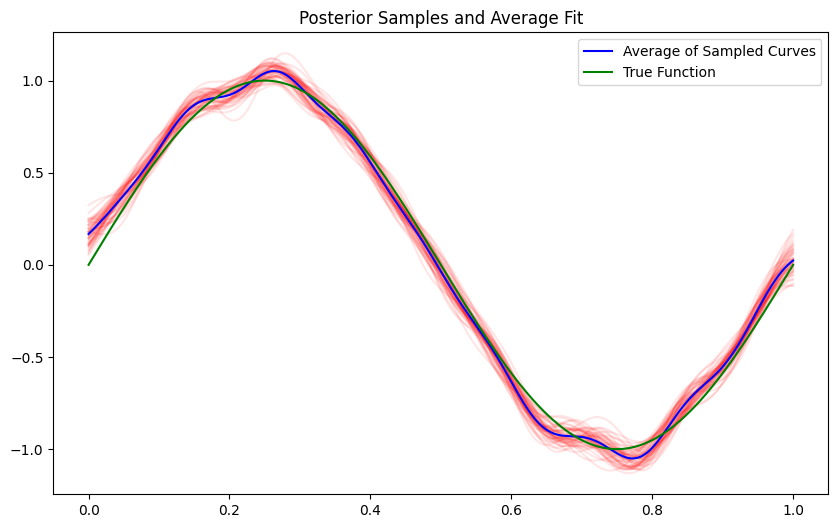

In [57]:
###################################################
# Plotting Posterior Sampling and Average Curve Fit
###################################################

n_samples = 50
sampled_curves = []

for _ in range(n_samples):
    w_sample = np.random.multivariate_normal(mean=m_N, cov=S_N)
    y_sample = predict(Phi_test, w_sample)
    sampled_curves.append(y_sample)

sampled_curves = np.array(sampled_curves)
average_curve = np.mean(sampled_curves, axis=0)

x_test = np.linspace(0, 1, 1000).reshape(-1, 1)

plt.figure(figsize=(10, 6))
for i in range(n_samples):
    plt.plot(x_test, sampled_curves[i], color='red', alpha=0.1)

plt.plot(x_test, average_curve, label='Average of Sampled Curves', color='blue')
plt.plot(x_test, sin_func(x_test), label='True Function', color='green')
plt.legend()
plt.title("Posterior Samples and Average Fit")
plt.show()


#### Intution behind above code

This code visualizes what the posterior distribution over weights actually means, by drawing multiple random samples from it and plotting their corresponding functions.

After training the Bayesian model on all 100 data points, we’ve calculated the final posterior mean m_N and posterior covariance S_N. These encode everything the model believes about the true weights given the data.

We now sample 50 random weight vectors w_sample from the multivariate normal distribution defined by this posterior.

For each sample, we compute the predicted curve: y_sample = Φ_test @ w_sample

This gives us 50 possible fits which reflect the uncertainty in the model's parameters.

Finally we get the average of these 50 curves approximates the posterior predictive mean.

It’s plotted in blue, and compared with the true function in green.

#### Observations

- The red curves are tightly packed where there is more data. Hence it shows more confidence where data is more abundant.  This observation is similar to that of the previous plot.

- The mean curve in the second plot (average of sampled curves) and the predictive mean in the first plot's final panel (after 100 data points) should be almost identical, because both curves represent the Bayesian posterior predictive mean.
  In the first plot, it’s computed analytically whereas in the second plot, we sample many weight vectors and take the average over all sampled predictions.
  As long as we use enough samples (e.g., 50+), the sample average converges closely to the analytical mean.